# Imports

In [1]:
# Linear algebra
import numpy as np

# Dataframes
import pandas as pd

# Swifter fast pandas apply
import swifter

# Path
import os
data_path = os.path.join('..', 'data')
results_path = os.path.join(data_path, 'Results')
whole_dataset_path = os.path.join(data_path, 'Whole Dataset')

# Plotting
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d
import matplotlib.patheffects as pe
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# statistics
from scipy.stats import spearmanr
from statsmodels.stats.multitest import multipletests
from scipy.stats import pearsonr
from scipy.stats import ttest_ind

# Biopython
from Bio.Seq import Seq
from Bio.Data import CodonTable

C:\Users\wsega\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Load Data

In [2]:
test_with_results = pd.read_pickle(os.path.join(results_path, '2_test_with_bart30.pkl'))

discretized_df = pd.read_pickle(os.path.join(whole_dataset_path, 'genes_human_discrete_expression.pkl'))

In [3]:
# import json

# # save test_with_results to csv with 'median' and 'median_float' list-like columns to json strings
# test_with_results['median'] = test_with_results['median'].apply(lambda x: json.dumps(x) if not isinstance(x, float) else x)
# test_with_results['median_float'] = test_with_results['median_float'].apply(lambda x: json.dumps(x) if not isinstance(x, float) else x)
# test_with_results.to_csv(os.path.join(results_path, '2_test_with_bart30.json.csv'), index=False)

In [4]:
isinstance(test_with_results['median'].iloc[4], str)

False

In [5]:
# Tissue Site Detail Ids
tissueSiteDetailId = ('Adipose_Subcutaneous', 'Adipose_Visceral_Omentum', 'Adrenal_Gland', 'Artery_Aorta', 'Artery_Coronary', 'Artery_Tibial', 'Bladder', 'Brain_Amygdala', 'Brain_Anterior_cingulate_cortex_BA24', 'Brain_Caudate_basal_ganglia', 'Brain_Cerebellar_Hemisphere', 'Brain_Cerebellum', 'Brain_Cortex', 'Brain_Frontal_Cortex_BA9', 'Brain_Hippocampus', 'Brain_Hypothalamus', 'Brain_Nucleus_accumbens_basal_ganglia', 'Brain_Putamen_basal_ganglia', 'Brain_Spinal_cord_cervical_c-1', 'Brain_Substantia_nigra', 'Breast_Mammary_Tissue', 'Cells_EBV-transformed_lymphocytes', 'Cells_Cultured_fibroblasts', 'Cervix_Ectocervix', 'Cervix_Endocervix', 'Colon_Sigmoid', 'Colon_Transverse', 'Esophagus_Gastroesophageal_Junction', 'Esophagus_Mucosa', 'Esophagus_Muscularis', 'Fallopian_Tube', 'Heart_Atrial_Appendage', 'Heart_Left_Ventricle', 'Kidney_Cortex', 'Kidney_Medulla', 'Liver', 'Lung', 'Minor_Salivary_Gland', 'Muscle_Skeletal', 'Nerve_Tibial', 'Ovary', 'Pancreas', 'Pituitary', 'Prostate', 'Skin_Not_Sun_Exposed_Suprapubic', 'Skin_Sun_Exposed_Lower_leg', 'Small_Intestine_Terminal_Ileum', 'Spleen', 'Stomach', 'Testis', 'Thyroid', 'Uterus', 'Vagina', 'Whole_Blood')
temp_df = pd.DataFrame(discretized_df['median_float'].tolist(), columns=tissueSiteDetailId)

In [6]:
# median expression floats lists
test_median_float = test_with_results['median_float'].dropna()
test_median_float_indices = test_median_float.index
test_median_float = test_median_float.tolist()
all_median_float = discretized_df['median_float'].dropna().tolist()

test_float_vectors = np.array(test_median_float)
all_float_vectors = np.array(all_median_float)

# total reads per tissue
total_reads = all_float_vectors.T.sum(axis=1)

# Normalize the float vectors (shape [num_vectors, 54]) by the total reads (shape [54])
normalized_test_float_vectors = test_float_vectors / total_reads

# Graphs

## Histograms

### Prediction Accuracy Histograms

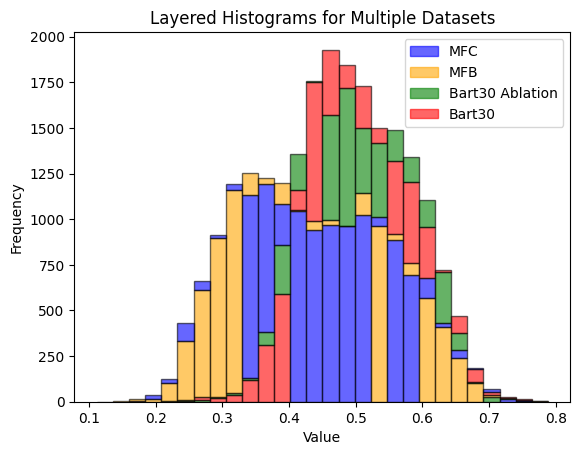

In [36]:
def layered_histograms(datasets, names, bins=30, colors=None, alpha=0.6):
    """
    Plots layered histograms for multiple datasets.
    
    Parameters:
        datasets (list of np.array): List of datasets to be plotted.
        bins (int or array): Number of bins or bin edges.
        colors (list of str): List of colors for each dataset.
        alpha (float): Transparency of bars.
    """
    num_datasets = len(datasets)
    if colors is None:
        colors = plt.cm.get_cmap('tab10', num_datasets).colors  # Generate distinct colors if not provided
    
    # Compute histograms for all datasets
    hist_counts = []
    for data in datasets:
        counts, edges = np.histogram(data, bins=bins)
        hist_counts.append(counts)

    hist_counts = np.array(hist_counts)  # Shape: (num_datasets, num_bins)
    bins = np.array(bins)  # Ensure bins is an array
    bin_widths = np.diff(bins)

    # Determine lowest bar and stack others
    bottom = np.zeros(len(bins) - 1)
    sorted_indices = np.argsort(hist_counts, axis=0)  # Sorting datasets per bin (low to high)
    
    for rank in range(num_datasets):  # Iterate over sorted order
        dataset_idx = sorted_indices[rank]
        for i in range(len(bins) - 1):
            idx = dataset_idx[i]
            height = hist_counts[idx, i] - (hist_counts[sorted_indices[rank - 1, i], i] if rank > 0 else 0)
            if height > 0:
                plt.bar(bins[i], height, width=bin_widths[i], bottom=bottom[i], color=colors[idx], alpha=alpha, edgecolor='black')
                bottom[i] += height  # Update bottom for stacking

    # Create legend
    from matplotlib.patches import Patch
    legend_patches = [Patch(color=colors[i], alpha=alpha, label=names[i]) for i in range(num_datasets)]
    plt.legend(handles=legend_patches)

    plt.xlabel("Value")
    plt.ylabel("Frequency")
    plt.title("Layered Histograms for Multiple Datasets")
    plt.show()

# Example Usage
np.random.seed(42)
datasets = [
    test_with_results['mfc_accuracy'],
    test_with_results['mfb_accuracy'],
    test_with_results['bart30_ablation_accuracy'],
    test_with_results['bart30_accuracy']
]

names = ['MFC', 'MFB', 'Bart30 Ablation', 'Bart30']

colors = ['blue', 'orange', 'green', 'red']

layered_histograms(datasets, names, bins=np.linspace(0.1, 0.8, 30), colors=colors, alpha=0.6)

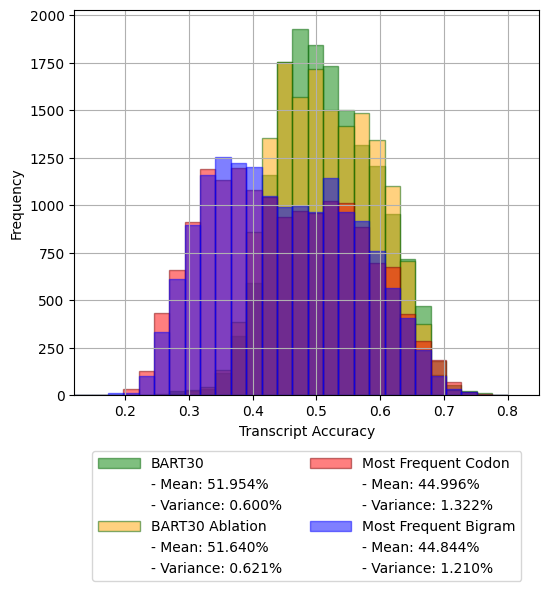

In [115]:
mfc_accuracies = test_with_results['mfc_accuracy']
mfb_accuracies = test_with_results['mfb_accuracy']
bart_ablation_accuracies = test_with_results['bart30_ablation_accuracy']
bart_accuracies = test_with_results['bart30_accuracy']

mean_mfc_accuracy = np.mean(mfc_accuracies)
mean_mfb_accuracy = np.mean(mfb_accuracies)
mean_bart_ablation_accuracy = np.mean(bart_ablation_accuracies)
mean_bart_accuracy = np.mean(bart_accuracies)

variance_mfc_accuracy = np.var(mfc_accuracies)
variance_mfb_accuracy = np.var(mfb_accuracies)
variance_bart_ablation_accuracy = np.var(bart_ablation_accuracies)
variance_bart_accuracy = np.var(bart_accuracies)

bins = np.linspace(0.1, 0.8, 30)

plt.figure(figsize=(6, 5))

# shades of blue for mfc, mfb and shades of red for bart and bart ablation
colors = ['red', 'blue', 'green', 'orange']
# darker shades for the edgecolor of the bars
dark_colors = ['maroon', 'blue', 'darkgreen', 'darkgreen']

# default plt style
plt.style.use('default')

# Plot histogram for bart_accuracies
plt.hist(bart_accuracies, bins=bins, color=colors[2], alpha=0.5, label='BART30', edgecolor=dark_colors[2])
plt.axvline(mean_bart_accuracy, color='blue', linestyle='dashed', linewidth=1, label=f'- Mean: {mean_bart_accuracy * 100 :.3f}%', alpha=0)
plt.axvline(variance_bart_accuracy, color='blue', linestyle='dashed', linewidth=1, label=f'- Variance: {variance_bart_accuracy * 100 :.3f}%', alpha=0)

# Plot histogram for bart_ablation_accuracies
plt.hist(bart_ablation_accuracies, bins=bins, color=colors[3], alpha=0.5, label='BART30 Ablation', edgecolor=dark_colors[3])
plt.axvline(mean_bart_ablation_accuracy, color='blue', linestyle='dashed', linewidth=1, label=f'- Mean: {mean_bart_ablation_accuracy * 100 :.3f}%', alpha=0)
plt.axvline(variance_bart_ablation_accuracy, color='blue', linestyle='dashed', linewidth=1, label=f'- Variance: {variance_bart_ablation_accuracy * 100 :.3f}%', alpha=0)

# Plot histogram for mfc_accuracies
plt.hist(mfc_accuracies, bins=bins, color=colors[0], alpha=0.5, label='Most Frequent Codon', edgecolor=dark_colors[0])
plt.axvline(mean_mfc_accuracy, color='blue', linestyle='dashed', linewidth=1, label=f'- Mean: {mean_mfc_accuracy * 100 :.3f}%', alpha=0)
plt.axvline(variance_mfc_accuracy, color='blue', linestyle='dashed', linewidth=1, label=f'- Variance: {variance_mfc_accuracy * 100 :.3f}%', alpha=0)

# Plot histogram for bi_codon_accuracy
plt.hist(mfb_accuracies, bins=bins, color=colors[1], alpha=0.5, label='Most Frequent Bigram', edgecolor=dark_colors[1])
plt.axvline(mean_mfb_accuracy, color='blue', linestyle='dashed', linewidth=1, label=f'- Mean: {mean_mfb_accuracy * 100 :.3f}%', alpha=0)
plt.axvline(variance_mfb_accuracy, color='blue', linestyle='dashed', linewidth=1, label=f'- Variance: {variance_mfb_accuracy * 100 :.3f}%', alpha=0)

# plt.title('Histogram of Accuracies')
plt.xlabel('Transcript Accuracy')
plt.ylabel('Frequency')
# plt.ylim(0, 5)
plt.xlim(0.12, 0.85)
# position legend to right of the plot
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.5), ncol=2, handlelength=3, fontsize=10)
plt.grid(True)

# square figure
# plt.gca().set_aspect('auto', adjustable='box')

plt.savefig('histogram_accuracies.svg', format='svg', bbox_inches='tight')

plt.show()

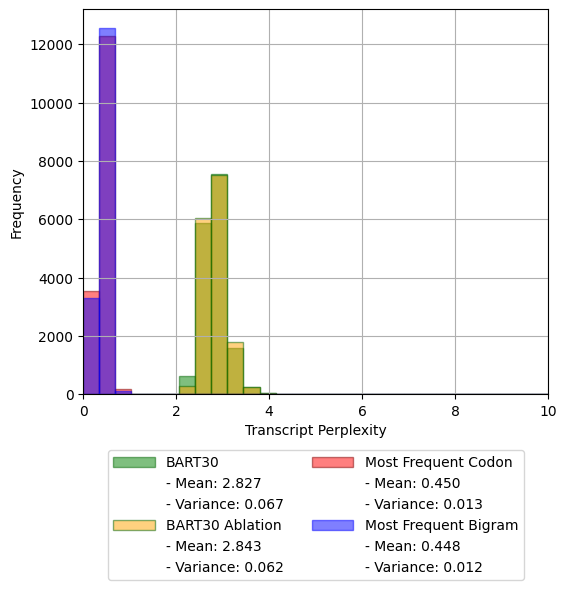

In [10]:
mfc_perplexity = test_with_results['mfc_accuracy']  # Replace with actual perplexity column if available
mfb_perplexity = test_with_results['mfb_accuracy']  # Replace with actual perplexity column if available
bart_ablation_perplexity = test_with_results['bart30_ablation_perplexity']
bart_perplexity = test_with_results['bart30_perplexity']

mean_mfc_perplexity = np.mean(mfc_perplexity)
mean_mfb_perplexity = np.mean(mfb_perplexity)
mean_bart_ablation_perplexity = np.mean(bart_ablation_perplexity)
mean_bart_perplexity = np.mean(bart_perplexity)

variance_mfc_perplexity = np.var(mfc_perplexity)
variance_mfb_perplexity = np.var(mfb_perplexity)
variance_bart_ablation_perplexity = np.var(bart_ablation_perplexity)
variance_bart_perplexity = np.var(bart_perplexity)

bins = np.linspace(0, 10, 30)  # Adjust bin range as needed

plt.figure(figsize=(6, 5))

# shades of blue for mfc, mfb and shades of red for bart and bart ablation
colors = ['red', 'blue', 'green', 'orange']
dark_colors = ['maroon', 'blue', 'darkgreen', 'darkgreen']

plt.style.use('default')

# Plot histogram for bart_perplexity
plt.hist(bart_perplexity, bins=bins, color=colors[2], alpha=0.5, label='BART30', edgecolor=dark_colors[2])
plt.axvline(mean_bart_perplexity, color='blue', linestyle='dashed', linewidth=1, label=f'- Mean: {mean_bart_perplexity:.3f}', alpha=0)
plt.axvline(variance_bart_perplexity, color='blue', linestyle='dashed', linewidth=1, label=f'- Variance: {variance_bart_perplexity:.3f}', alpha=0)

# Plot histogram for bart_ablation_perplexity
plt.hist(bart_ablation_perplexity, bins=bins, color=colors[3], alpha=0.5, label='BART30 Ablation', edgecolor=dark_colors[3])
plt.axvline(mean_bart_ablation_perplexity, color='blue', linestyle='dashed', linewidth=1, label=f'- Mean: {mean_bart_ablation_perplexity:.3f}', alpha=0)
plt.axvline(variance_bart_ablation_perplexity, color='blue', linestyle='dashed', linewidth=1, label=f'- Variance: {variance_bart_ablation_perplexity:.3f}', alpha=0)

# Plot histogram for mfc_perplexity
plt.hist(mfc_perplexity, bins=bins, color=colors[0], alpha=0.5, label='Most Frequent Codon', edgecolor=dark_colors[0])
plt.axvline(mean_mfc_perplexity, color='blue', linestyle='dashed', linewidth=1, label=f'- Mean: {mean_mfc_perplexity:.3f}', alpha=0)
plt.axvline(variance_mfc_perplexity, color='blue', linestyle='dashed', linewidth=1, label=f'- Variance: {variance_mfc_perplexity:.3f}', alpha=0)

# Plot histogram for mfb_perplexity
plt.hist(mfb_perplexity, bins=bins, color=colors[1], alpha=0.5, label='Most Frequent Bigram', edgecolor=dark_colors[1])
plt.axvline(mean_mfb_perplexity, color='blue', linestyle='dashed', linewidth=1, label=f'- Mean: {mean_mfb_perplexity:.3f}', alpha=0)
plt.axvline(variance_mfb_perplexity, color='blue', linestyle='dashed', linewidth=1, label=f'- Variance: {variance_mfb_perplexity:.3f}', alpha=0)

plt.xlabel('Transcript Perplexity')
plt.ylabel('Frequency')
plt.xlim(0, 10)  # Adjust x-axis limits as needed
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.5), ncol=2, handlelength=3, fontsize=10)
plt.grid(True)

# plt.savefig('histogram_perplexity.svg', format='svg', bbox_inches='tight')

plt.show()


In [ ]:
# bart_accuracies_temp = test_with_results[test_with_results['bart30_accuracy'] > 0.7].value_counts('mfc_accuracy')
# mfc_accuracies_temp = test_with_results[test_with_results['bart30_accuracy'] > 0.7].value_counts('bart30_accuracy')

# perform a Welch t-test between the high range of accuracies
percentile_95_mfc = np.percentile(mfc_accuracies, 99)
mfc_accuracies_top_5_percentile = mfc_accuracies[mfc_accuracies >= percentile_95_mfc]

percentile_95_bart = np.percentile(bart_accuracies, 99)
bart_accuracies_top_5_percentile = bart_accuracies[bart_accuracies >= percentile_95_bart]

ttest_ind(mfc_accuracies_top_5_percentile, bart_accuracies_top_5_percentile, equal_var=False)

TtestResult(statistic=np.float64(-0.43086463155866744), pvalue=np.float64(0.6668578228573863), df=np.float64(318.96230491793517))

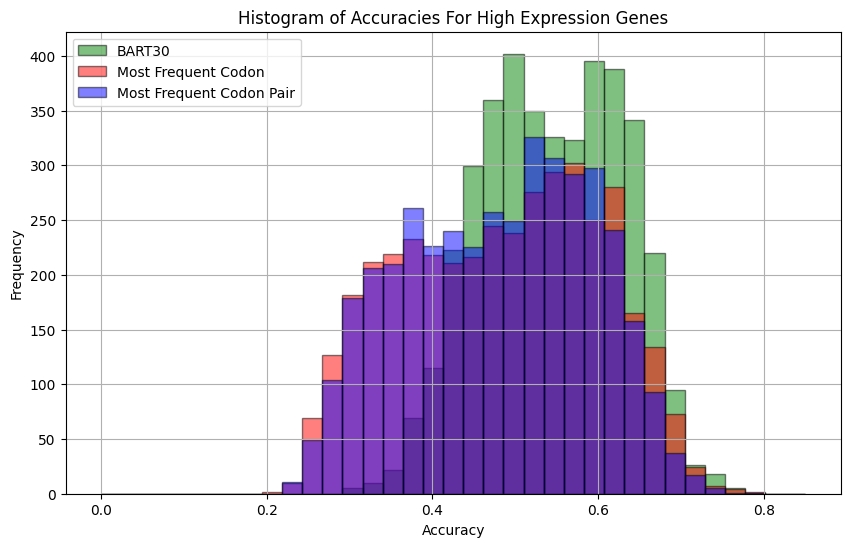

In [291]:
high_exp_test_with_results = test_with_results[test_with_results['median'].apply(lambda x: 'expr_top10' in x if not isinstance(x, float) else False)]

mfc_accuracies = high_exp_test_with_results['mfc_accuracy']
bart_accuracies = high_exp_test_with_results['bart30_accuracy']
mfb_accuracies = high_exp_test_with_results['mfb_accuracy']

mean_mfc_accuracy = np.mean(mfc_accuracies)
mean_exp_accuracy = np.mean(bart_accuracies)
mean_mfb_accuracy = np.mean(mfb_accuracies)

variance_mfc_accuracy = np.var(mfc_accuracies)
variance_exp_accuracy = np.var(bart_accuracies)
variance_mfb_accuracy = np.var(mfb_accuracies)

# Define common bins
bins = np.linspace(0, 0.85, 36)

plt.figure(figsize=(10, 6))

# Plot histogram for bart_accuracies
plt.hist(bart_accuracies, bins=bins, color='green', edgecolor='black', alpha=0.5, label='BART30')

# Plot histogram for mfc_accuracies
plt.hist(mfc_accuracies, bins=bins, color='red', edgecolor='black', alpha=0.5, label='Most Frequent Codon')

# Plot histogram for mfb_accuracies
plt.hist(mfb_accuracies, bins=bins, color='blue', edgecolor='black', alpha=0.5, label='Most Frequent Codon Pair')

plt.title('Histogram of Accuracies For High Expression Genes')
plt.xlabel('Accuracy')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)
plt.show()


C:\Users\wsega\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


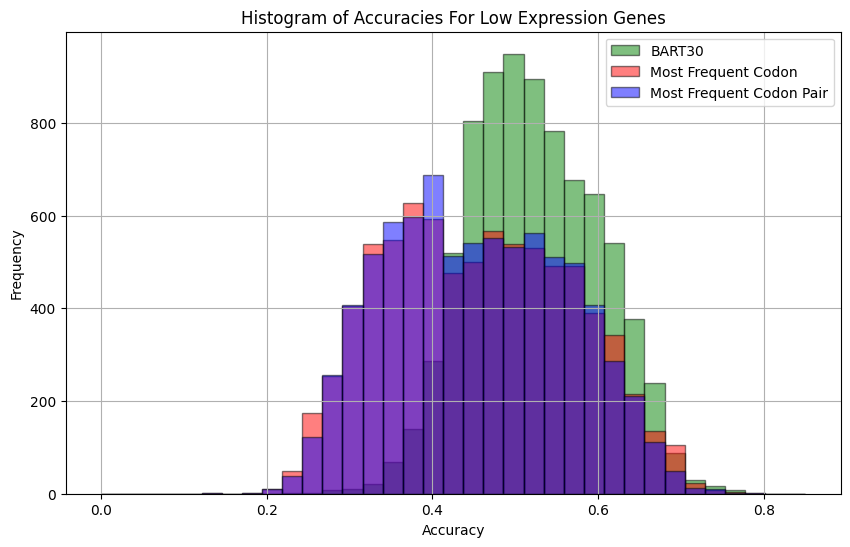

In [292]:
high_exp_test_with_results = test_with_results[test_with_results['median'].apply(lambda x: 'expr_low25' in x if not isinstance(x, float) else False)]

mfc_accuracies = high_exp_test_with_results['mfc_accuracy']
bart_accuracies = high_exp_test_with_results['bart30_accuracy']
mfb_accuracies = high_exp_test_with_results['mfb_accuracy']

mean_mfc_accuracy = np.mean(mfc_accuracies)
mean_exp_accuracy = np.mean(bart_accuracies)
mean_mfb_accuracy = np.mean(mfb_accuracies)

variance_mfc_accuracy = np.var(mfc_accuracies)
variance_exp_accuracy = np.var(bart_accuracies)
variance_mfb_accuracy = np.var(mfb_accuracies)

# Define common bins
bins = np.linspace(0, 0.85, 36)

plt.figure(figsize=(10, 6))

# Plot histogram for bart_accuracies
plt.hist(bart_accuracies, bins=bins, color='green', edgecolor='black', alpha=0.5, label='BART30')

# Plot histogram for mfc_accuracies
plt.hist(mfc_accuracies, bins=bins, color='red', edgecolor='black', alpha=0.5, label='Most Frequent Codon')

# Plot histogram for mfb_accuracies
plt.hist(mfb_accuracies, bins=bins, color='blue', edgecolor='black', alpha=0.5, label='Most Frequent Codon Pair')

plt.title('Histogram of Accuracies For Low Expression Genes')
plt.xlabel('Accuracy')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)
plt.show()


In [293]:
high_exp_test_with_results = test_with_results[test_with_results['canonical'] == True]

mfc_accuracies = high_exp_test_with_results['mfc_accuracy']
bart_accuracies = high_exp_test_with_results['bart30_accuracy']
mfb_accuracies = high_exp_test_with_results['mfb_accuracy']

mean_mfc_accuracy = np.mean(mfc_accuracies)
mean_exp_accuracy = np.mean(bart_accuracies)
mean_mfb_accuracy = np.mean(mfb_accuracies)

variance_mfc_accuracy = np.var(mfc_accuracies)
variance_exp_accuracy = np.var(bart_accuracies)
variance_mfb_accuracy = np.var(mfb_accuracies)

# Define common bins
bins = np.linspace(0, 0.85, 36)

plt.figure(figsize=(10, 6))

# Plot histogram for bart_accuracies
plt.hist(bart_accuracies, bins=bins, color='green', edgecolor='black', alpha=0.5, label='BART30')

# Plot histogram for mfc_accuracies
plt.hist(mfc_accuracies, bins=bins, color='red', edgecolor='black', alpha=0.5, label='Most Frequent Codon')

# Plot histogram for mfb_accuracies
plt.hist(mfb_accuracies, bins=bins, color='blue', edgecolor='black', alpha=0.5, label='Most Frequent Codon Pair')

plt.title('Histogram of Accuracies For Canonical Transcripts')
plt.xlabel('Accuracy')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)
plt.show()


KeyError: 'canonical'

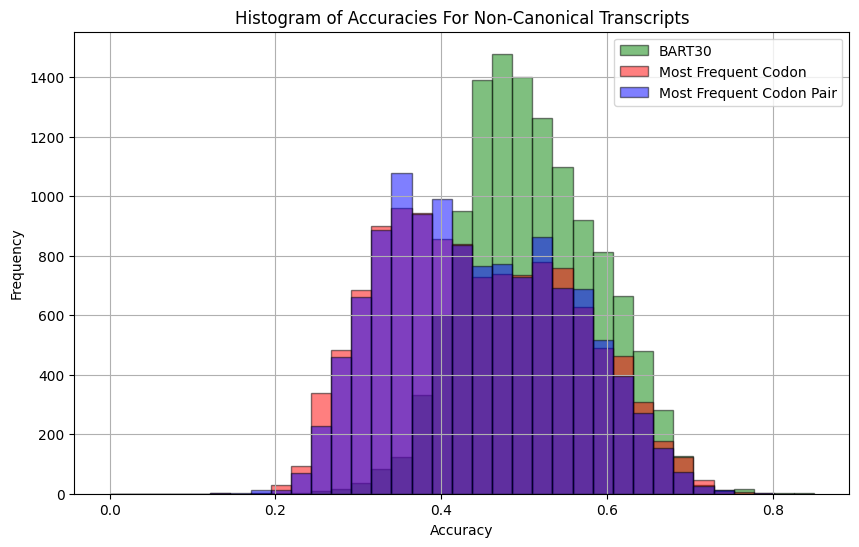

In [ ]:
high_exp_test_with_results = test_with_results[test_with_results['canonical'] == False]

mfc_accuracies = high_exp_test_with_results['mfc_accuracy']
bart_accuracies = high_exp_test_with_results['bart30_accuracy']
mfb_accuracies = high_exp_test_with_results['mfb_accuracy']

mean_mfc_accuracy = np.mean(mfc_accuracies)
mean_exp_accuracy = np.mean(bart_accuracies)
mean_mfb_accuracy = np.mean(mfb_accuracies)

variance_mfc_accuracy = np.var(mfc_accuracies)
variance_exp_accuracy = np.var(bart_accuracies)
variance_mfb_accuracy = np.var(mfb_accuracies)

# Define common bins
bins = np.linspace(0, 0.85, 36)

plt.figure(figsize=(10, 6))

# Plot histogram for bart_accuracies
plt.hist(bart_accuracies, bins=bins, color='green', edgecolor='black', alpha=0.5, label='BART30')

# Plot histogram for mfc_accuracies
plt.hist(mfc_accuracies, bins=bins, color='red', edgecolor='black', alpha=0.5, label='Most Frequent Codon')

# Plot histogram for mfb_accuracies
plt.hist(mfb_accuracies, bins=bins, color='blue', edgecolor='black', alpha=0.5, label='Most Frequent Codon Pair')

plt.title('Histogram of Accuracies For Non-Canonical Transcripts')
plt.xlabel('Accuracy')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)
plt.show()


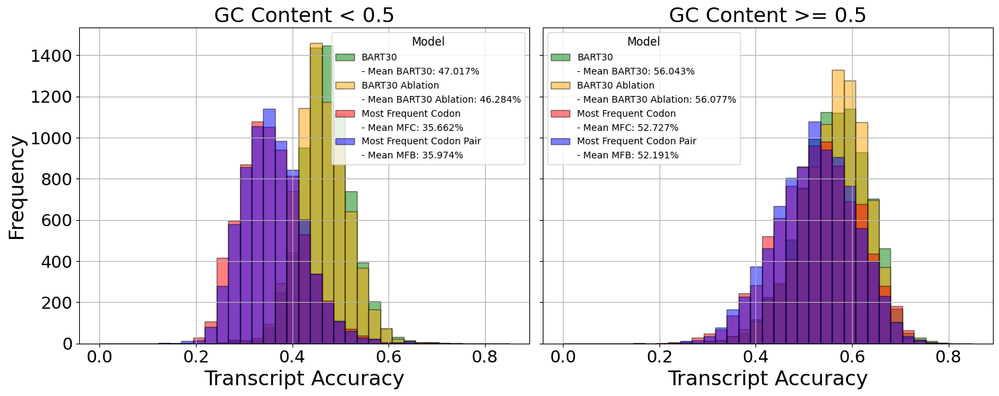

In [138]:
# Split the dataset based on GC content
high_gc_test_with_results = test_with_results[test_with_results['gc_content'] >= 0.5]
low_gc_test_with_results = test_with_results[test_with_results['gc_content'] < 0.5]

# Extract accuracies for high GC content
high_gc_mfc_accuracies = high_gc_test_with_results['mfc_accuracy']
high_gc_mfb_accuracies = high_gc_test_with_results['mfb_accuracy']
high_gc_bart_ablation_accuracies = high_gc_test_with_results['bart30_ablation_accuracy']
high_gc_bart_accuracies = high_gc_test_with_results['bart30_accuracy']

# Extract accuracies for low GC content
low_gc_mfc_accuracies = low_gc_test_with_results['mfc_accuracy']
low_gc_mfb_accuracies = low_gc_test_with_results['mfb_accuracy']
low_gc_bart_ablation_accuracies = low_gc_test_with_results['bart30_ablation_accuracy']
low_gc_bart_accuracies = low_gc_test_with_results['bart30_accuracy']

# Calculate means
mean_high_gc_mfc_accuracy = np.mean(high_gc_mfc_accuracies)
mean_high_gc_mfb_accuracy = np.mean(high_gc_mfb_accuracies)
mean_high_gc_bart_ablation_accuracy = np.mean(high_gc_bart_ablation_accuracies)
mean_high_gc_bart_accuracy = np.mean(high_gc_bart_accuracies)

mean_low_gc_mfc_accuracy = np.mean(low_gc_mfc_accuracies)
mean_low_gc_mfb_accuracy = np.mean(low_gc_mfb_accuracies)
mean_low_gc_bart_ablation_accuracy = np.mean(low_gc_bart_ablation_accuracies)
mean_low_gc_bart_accuracy = np.mean(low_gc_bart_accuracies)

# Define common bins
bins = np.linspace(0, 0.85, 36)

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 6), sharey=True)

# Plot histogram for low GC content
axes[0].hist(low_gc_bart_accuracies, bins=bins, color='green', edgecolor='black', alpha=0.5, label='BART30')
axes[0].axvline(mean_low_gc_bart_accuracy, color='green', linestyle='dashed', linewidth=1, label=f'- Mean BART30: {mean_low_gc_bart_accuracy * 100 :.3f}%', alpha=0)

axes[0].hist(low_gc_bart_ablation_accuracies, bins=bins, color='orange', edgecolor='black', alpha=0.5, label='BART30 Ablation')
axes[0].axvline(mean_low_gc_bart_ablation_accuracy, color='orange', linestyle='dashed', linewidth=1, label=f'- Mean BART30 Ablation: {mean_low_gc_bart_ablation_accuracy * 100 :.3f}%', alpha=0)

axes[0].hist(low_gc_mfc_accuracies, bins=bins, color='red', edgecolor='black', alpha=0.5, label='Most Frequent Codon')
axes[0].axvline(mean_low_gc_mfc_accuracy, color='red', linestyle='dashed', linewidth=1, label=f'- Mean MFC: {mean_low_gc_mfc_accuracy * 100 :.3f}%', alpha=0)

axes[0].hist(low_gc_mfb_accuracies, bins=bins, color='blue', edgecolor='black', alpha=0.5, label='Most Frequent Codon Pair')
axes[0].axvline(mean_low_gc_mfb_accuracy, color='blue', linestyle='dashed', linewidth=1, label=f'- Mean MFB: {mean_low_gc_mfb_accuracy * 100 :.3f}%', alpha=0)

axes[0].set_title('GC Content < 0.5', fontsize=22)
axes[0].set_xlabel('Transcript Accuracy', fontsize=22)
axes[0].tick_params(axis='x', labelsize=18)
axes[0].tick_params(axis='y', labelsize=18)
axes[0].set_ylabel('Frequency', fontsize=22)
axes[0].legend(title='Model', fontsize=10, title_fontsize=12)
axes[0].grid(True)

# Plot histogram for high GC content
axes[1].hist(high_gc_bart_accuracies, bins=bins, color='green', edgecolor='black', alpha=0.5, label='BART30')
axes[1].axvline(mean_high_gc_bart_accuracy, color='green', linestyle='dashed', linewidth=1, label=f'- Mean BART30: {mean_high_gc_bart_accuracy * 100 :.3f}%', alpha=0)

axes[1].hist(high_gc_bart_ablation_accuracies, bins=bins, color='orange', edgecolor='black', alpha=0.5, label='BART30 Ablation')
axes[1].axvline(mean_high_gc_bart_ablation_accuracy, color='orange', linestyle='dashed', linewidth=1, label=f'- Mean BART30 Ablation: {mean_high_gc_bart_ablation_accuracy * 100 :.3f}%', alpha=0)

axes[1].hist(high_gc_mfc_accuracies, bins=bins, color='red', edgecolor='black', alpha=0.5, label='Most Frequent Codon')
axes[1].axvline(mean_high_gc_mfc_accuracy, color='red', linestyle='dashed', linewidth=1, label=f'- Mean MFC: {mean_high_gc_mfc_accuracy * 100 :.3f}%', alpha=0)

axes[1].hist(high_gc_mfb_accuracies, bins=bins, color='blue', edgecolor='black', alpha=0.5, label='Most Frequent Codon Pair')
axes[1].axvline(mean_high_gc_mfb_accuracy, color='blue', linestyle='dashed', linewidth=1, label=f'- Mean MFB: {mean_high_gc_mfb_accuracy * 100 :.3f}%', alpha=0)

axes[1].set_title('GC Content >= 0.5', fontsize=22)
axes[1].set_xlabel('Transcript Accuracy', fontsize=22)
axes[1].tick_params(axis='x', labelsize=18)
axes[1].legend(title='Model', fontsize=10, loc='upper left', title_fontsize=12)
axes[1].grid(True)

# Set the same y-axis range for both subplots
y_min = min(axes[0].get_ylim()[0], axes[1].get_ylim()[0])
y_max = max(axes[0].get_ylim()[1], axes[1].get_ylim()[1])
axes[0].set_ylim(y_min, y_max)
axes[1].set_ylim(y_min, y_max)

plt.tight_layout()

plt.savefig('histogram_accuracies_gc_content.svg', format='svg', bbox_inches='tight')

plt.show()

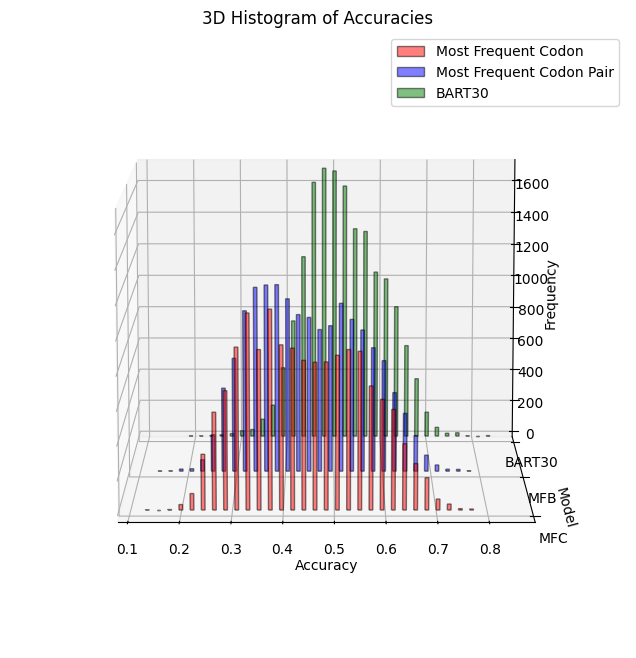

In [ ]:
# Create a figure and a 3D axis
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Define the number of bins
bins = 30

# Compute the histogram data
hist_mfc, bins_mfc = np.histogram(mfc_accuracies, bins=bins)
hist_mfb, bins_mfb = np.histogram(mfb_accuracies, bins=bins)
hist_bart, bins_bart = np.histogram(bart_accuracies, bins=bins)

# Define the positions for the bars
x_mfc = (bins_mfc[:-1] + bins_mfc[1:]) / 2
x_mfb = (bins_mfb[:-1] + bins_mfb[1:]) / 2
x_bart = (bins_bart[:-1] + bins_bart[1:]) / 2

# Define the width of the bars
width = (bins_mfc[1] - bins_mfc[0]) / 3

# Plot the histograms
ax.bar(x_mfc - width, hist_mfc, zs=0, zdir='y', width=width, color='red', alpha=0.5, edgecolor='black', label='Most Frequent Codon')
ax.bar(x_mfb, hist_mfb, zs=1, zdir='y', width=width, color='blue', alpha=0.5, edgecolor='black', label='Most Frequent Codon Pair')
ax.bar(x_bart + width, hist_bart, zs=2, zdir='y', width=width, color='green', alpha=0.5, edgecolor='black', label='BART30')

# Set labels
ax.set_xlabel('Accuracy')
ax.set_ylabel('Model')
ax.set_zlabel('Frequency')
ax.set_yticks([0, 1, 2])
ax.set_yticklabels(['MFC', 'MFB', 'BART30'])

# Set title and legend
ax.set_title('3D Histogram of Accuracies')
ax.legend()

# Change the view angle
ax.view_init(elev=10, azim=-90)

plt.show()

## Prediction Accuracy Vs. Sequence Length

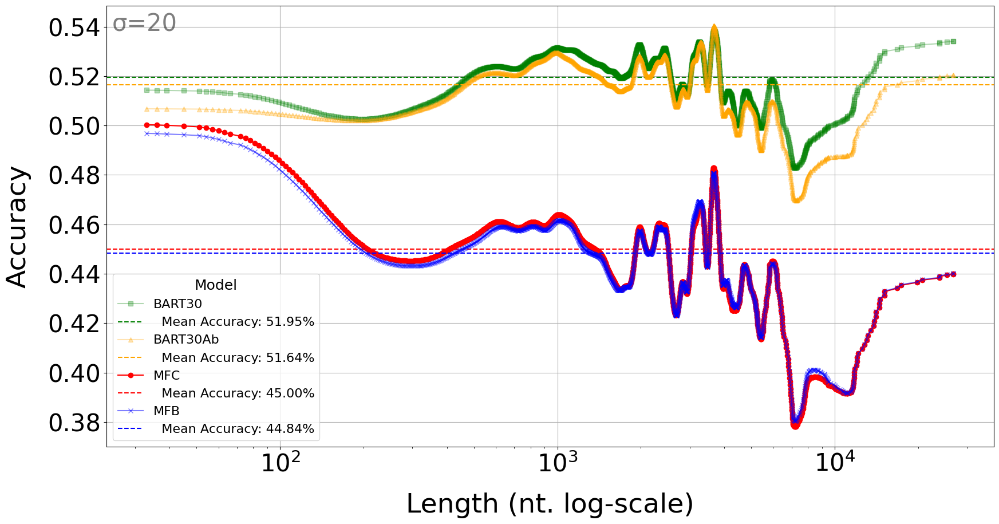

In [71]:
# sort by sequence lengths (in amino acids)
sorted_df = test_with_results.sort_values(by='length (aa)')

# Rename 'length (aa)' to 'length (nt)' and multiply values by 3
sorted_df = sorted_df.rename(columns={'length (aa)': 'length (nt)'})
sequence_lengths = sorted_df['length (nt)'].astype(int) * 3

# group by sequence lengths and calculate the average of the accuracy columns
grouped = sorted_df.groupby(sequence_lengths)
average_accuracies_per_length = grouped[['mfc_accuracy', 'mfb_accuracy', 'bart30_accuracy', 'bart30_ablation_accuracy']].mean()

sgma = 20

# Apply Gaussian smoothing
smoothed_mfc_accuracy = gaussian_filter1d(average_accuracies_per_length['mfc_accuracy'], sigma=sgma)
smoothed_mfb_accuracy = gaussian_filter1d(average_accuracies_per_length['mfb_accuracy'], sigma=sgma)
smoothed_bart_accuracy = gaussian_filter1d(average_accuracies_per_length['bart30_accuracy'], sigma=sgma)
smoothed_bart_ablation_accuracy = gaussian_filter1d(average_accuracies_per_length['bart30_ablation_accuracy'], sigma=sgma)

avg_mfc_accuracy = np.mean(test_with_results['mfc_accuracy'])
avg_mfb_accuracy = np.mean(test_with_results['mfb_accuracy'])
avg_bart30_accuracy = np.mean(test_with_results['bart30_accuracy'])
avg_bart30_ablation_accuracy = np.mean(test_with_results['bart30_ablation_accuracy'])

plt.figure(figsize=(20, 10))

plt.plot(average_accuracies_per_length.index, smoothed_bart_accuracy, marker='s', alpha=0.3, color='green', label=f'BART30')
plt.axhline(avg_bart30_accuracy, color='g', linestyle='--', label=f'  Mean Accuracy: {avg_bart30_accuracy * 100 :.2f}%')

plt.plot(average_accuracies_per_length.index, smoothed_bart_ablation_accuracy, marker='^', alpha=0.3, color='orange', label=f'BART30Ab')
plt.axhline(avg_bart30_ablation_accuracy, color='orange', linestyle='--', label=f'  Mean Accuracy: {avg_bart30_ablation_accuracy * 100 :.2f}%')

plt.plot(average_accuracies_per_length.index, smoothed_mfc_accuracy, marker='o', alpha=1, color='red', label=f'MFC')
plt.axhline(avg_mfc_accuracy, color='r', linestyle='--', label=f'  Mean Accuracy: {avg_mfc_accuracy * 100 :.2f}%')

plt.plot(average_accuracies_per_length.index, smoothed_mfb_accuracy, marker='x', alpha=0.5, color='blue', label=f'MFB')
plt.axhline(avg_mfb_accuracy, color='b', linestyle='--', label=f'  Mean Accuracy: {avg_mfb_accuracy * 100 :.2f}%')

# plt.title(f'Model Accuracies vs. Length (nt) with Gaussian Smoothing (σ={sgma})', fontsize=20)
plt.xlabel('Length (nt. log-scale)', fontsize=34, labelpad=20)
plt.xticks(fontsize=30)
plt.xscale('log')
plt.ylabel('Accuracy', fontsize=34, labelpad=20)
plt.yticks(fontsize=30)
plt.legend(fontsize=16, title='Model', title_fontsize=18)
plt.grid(True)

# annotate sigma value in the top left corner
plt.annotate(f'σ={sgma}', xy=(0.08, 0.93), xycoords='axes fraction', fontsize=30, ha='right', va='bottom', alpha=0.5)

plt.savefig('model_accuracies_vs_length_log_scale.svg', format='svg', bbox_inches='tight')

plt.show()

## Prediction Accuracy Vs. Sequence Length Ranking

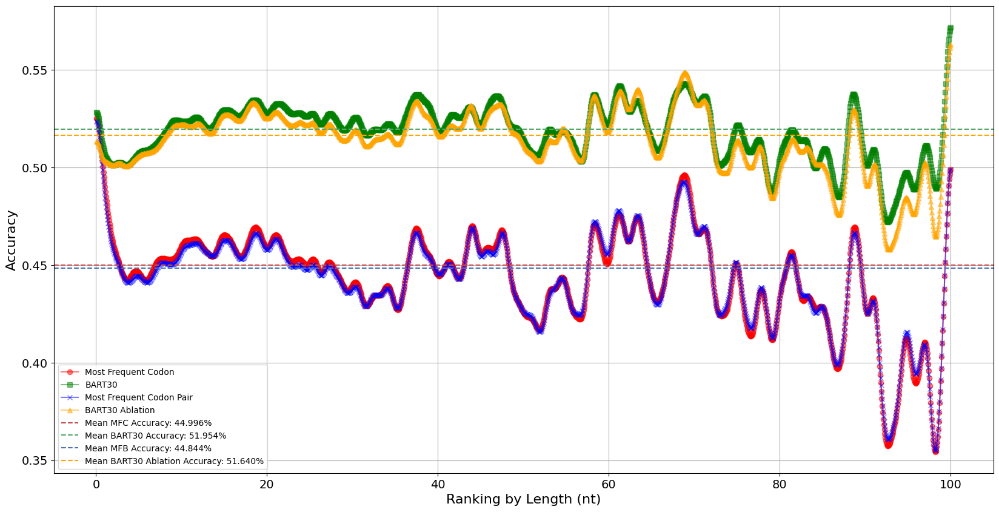

In [124]:
# Rank sequence lengths by percentages
ranked_lengths = pd.Series(average_accuracies_per_length.index).rank(pct=True)
ranked_lengths = ranked_lengths * 100

sgma = 10

# Apply Gaussian smoothing
smoothed_mfc_accuracy = gaussian_filter1d(average_accuracies_per_length['mfc_accuracy'], sigma=sgma)
smoothed_mfb_accuracy = gaussian_filter1d(average_accuracies_per_length['mfb_accuracy'], sigma=sgma)
smoothed_bart_accuracy = gaussian_filter1d(average_accuracies_per_length['bart30_accuracy'], sigma=sgma)
smoothed_bart_ablation_accuracy = gaussian_filter1d(average_accuracies_per_length['bart30_ablation_accuracy'], sigma=sgma)

plt.figure(figsize=(20, 10))

plt.plot(ranked_lengths, smoothed_mfc_accuracy, marker='o', alpha=0.5, color='red', label='Most Frequent Codon')
plt.plot(ranked_lengths, smoothed_bart_accuracy, marker='s', alpha=0.5, color='green', label='BART30')
plt.plot(ranked_lengths, smoothed_mfb_accuracy, marker='x', alpha=0.5, color='blue', label='Most Frequent Codon Pair')
plt.plot(ranked_lengths, smoothed_bart_ablation_accuracy, marker='^', alpha=0.5, color='orange', label='BART30 Ablation')

# plot horizontal lines for the average accuracies
plt.axhline(avg_mfc_accuracy, color='r', linestyle='--', label=f'Mean MFC Accuracy: {avg_mfc_accuracy * 100 :.3f}%')
plt.axhline(avg_bart30_accuracy, color='g', linestyle='--', label=f'Mean BART30 Accuracy: {avg_bart30_accuracy * 100 :.3f}%')
plt.axhline(avg_mfb_accuracy, color='b', linestyle='--', label=f'Mean MFB Accuracy: {avg_mfb_accuracy * 100 :.3f}%')
plt.axhline(avg_bart30_ablation_accuracy, color='orange', linestyle='--', label=f'Mean BART30 Ablation Accuracy: {avg_bart30_ablation_accuracy * 100 :.3f}%')


# plt.title(f'Model Accuracies vs. Length (nt) with Gaussian Smoothing (σ={sgma})', fontsize=20)
plt.xlabel('Ranking by Length (nt)', fontsize=16)
plt.xticks(fontsize=14)
plt.ylabel('Accuracy', fontsize=16)
plt.yticks(fontsize=14)
plt.legend()
plt.grid(True)

plt.savefig('model_accuracies_vs_ranked_length.svg', format='svg', bbox_inches='tight')

plt.show()

## Prediction Accuracy Vs. Average PIdent

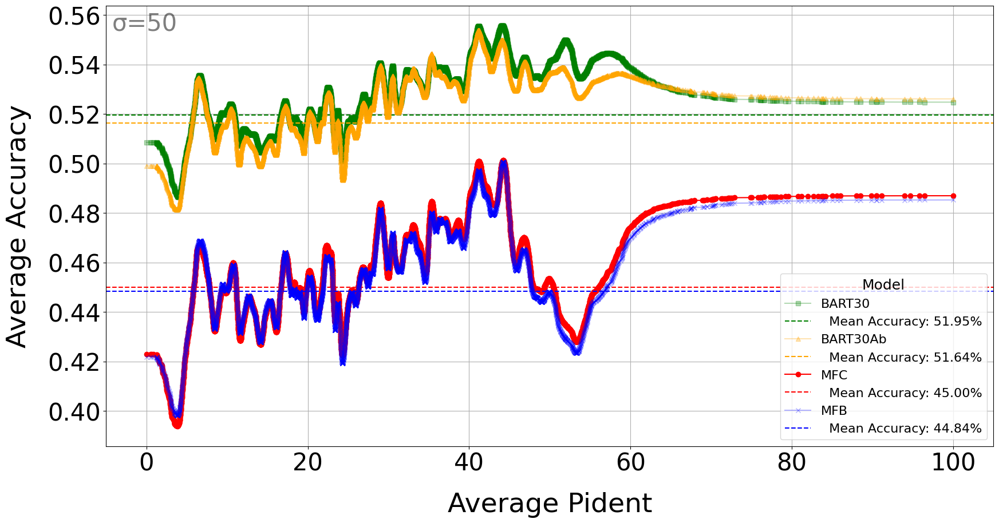

In [ ]:
# sort by sequence average pident
sorted_df = test_with_results.sort_values(by='average_pident')

average_pidents = sorted_df['average_pident']

# group by sequence lengths and calculate the average of the accuracy columns
grouped = sorted_df.groupby(average_pidents)
average_accuracies_per_pident = grouped[['mfc_accuracy', 'mfb_accuracy', 'bart30_accuracy', 'bart30_ablation_accuracy']].mean()

# Apply Gaussian smoothing
sgma = 50

smoothed_mfc_accuracy = gaussian_filter1d(average_accuracies_per_pident['mfc_accuracy'], sigma=sgma)
smoothed_mfb_accuracy = gaussian_filter1d(average_accuracies_per_pident['mfb_accuracy'], sigma=sgma)
smoothed_bart_accuracy = gaussian_filter1d(average_accuracies_per_pident['bart30_accuracy'], sigma=sgma)
smoothed_bart_ablation_accuracy = gaussian_filter1d(average_accuracies_per_pident['bart30_ablation_accuracy'], sigma=sgma)

plt.figure(figsize=(20, 10))

plt.plot(average_accuracies_per_pident.index, smoothed_bart_accuracy, marker='s', alpha=0.3, color='green', label='BART30')
plt.axhline(avg_bart30_accuracy, color='g', linestyle='--', label=f'  Mean Accuracy: {avg_bart30_accuracy * 100:.2f}%')

plt.plot(average_accuracies_per_pident.index, smoothed_bart_ablation_accuracy, marker='^', alpha=0.3, color='orange', label='BART30Ab')
plt.axhline(avg_bart30_ablation_accuracy, color='orange', linestyle='--', label=f'  Mean Accuracy: {avg_bart30_ablation_accuracy * 100:.2f}%')

plt.plot(average_accuracies_per_pident.index, smoothed_mfc_accuracy, marker='o', alpha=1, color='red', label='MFC')
plt.axhline(avg_mfc_accuracy, color='r', linestyle='--', label=f'  Mean Accuracy: {avg_mfc_accuracy * 100:.2f}%')

plt.plot(average_accuracies_per_pident.index, smoothed_mfb_accuracy, marker='x', alpha=0.3, color='blue', label='MFB')
plt.axhline(avg_mfb_accuracy, color='b', linestyle='--', label=f'  Mean Accuracy: {avg_mfb_accuracy * 100:.2f}%')

# plt.title(f"Model Accuracies vs. Average Pident with Gaussian Smoothing (sigma={sgma})", fontsize=20)
plt.xlabel('Average Pident', fontsize=34, labelpad=20)
plt.xticks(fontsize=30)
plt.ylabel('Average Accuracy', fontsize=34, labelpad=20)
plt.yticks(fontsize=30)
# more room for legend text
plt.legend(fontsize=16, title='Model', title_fontsize=18)
plt.grid(True)

# annotate sigma value in the top left corner
plt.annotate(f'σ={sgma}', xy=(0.08, 0.93), xycoords='axes fraction', fontsize=30, ha='right', va='bottom', alpha=0.5)

plt.savefig('model_accuracies_vs_average_pident.svg', format='svg', bbox_inches='tight')

plt.show()

## Prediction Accuracy Vs. Mean Expression Value

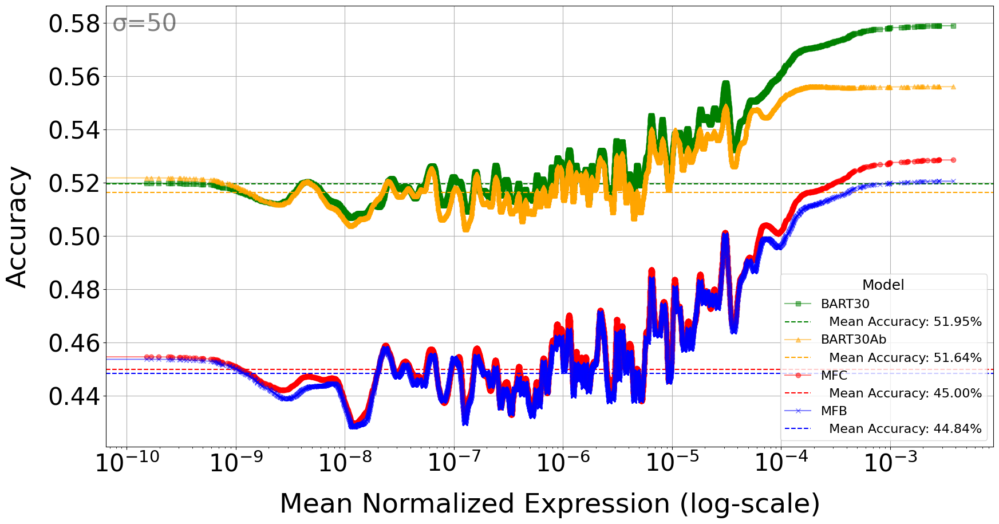

In [78]:
# Drop rows with NaN values in 'median_float'
temp_df = test_with_results.dropna(subset=['median_float']).copy()

# Mean expression values
mean_normalized_test_float_vectors = np.mean(normalized_test_float_vectors, axis=1)
temp_df.loc[:, 'mean_expression'] = mean_normalized_test_float_vectors

# Sort temp_df by mean expression
sorted_df = temp_df.sort_values('mean_expression')

# Group by 'mean_expression' and calculate the average of the accuracy columns
grouped_by_mean_expression = sorted_df.groupby('mean_expression')
average_accuracies_per_mean_expression = grouped_by_mean_expression[['mfc_accuracy', 'mfb_accuracy', 'bart30_accuracy', 'bart30_ablation_accuracy']].mean()

# Apply Gaussian smoothing
sgma = 50

smoothed_mfc_accuracy = gaussian_filter1d(average_accuracies_per_mean_expression['mfc_accuracy'], sigma=sgma)
smoothed_mfb_accuracy = gaussian_filter1d(average_accuracies_per_mean_expression['mfb_accuracy'], sigma=sgma)
smoothed_bart_accuracy = gaussian_filter1d(average_accuracies_per_mean_expression['bart30_accuracy'], sigma=sgma)
smoothed_bart_ablation_accuracy = gaussian_filter1d(average_accuracies_per_mean_expression['bart30_ablation_accuracy'], sigma=sgma)

# Plot the accuracies vs. mean 'median_float' values
plt.figure(figsize=(20, 10))

plt.plot(average_accuracies_per_mean_expression.index, smoothed_bart_accuracy, marker='s', alpha=0.5, color='green', label='BART30')
plt.axhline(avg_bart30_accuracy, color='g', linestyle='--', label=f'  Mean Accuracy: {avg_bart30_accuracy * 100:.2f}%')

plt.plot(average_accuracies_per_mean_expression.index, smoothed_bart_ablation_accuracy, marker='^', alpha=0.5, color='orange', label='BART30Ab')
plt.axhline(avg_bart30_ablation_accuracy, color='orange', linestyle='--', label=f'  Mean Accuracy: {avg_bart30_ablation_accuracy * 100:.2f}%')

plt.plot(average_accuracies_per_mean_expression.index, smoothed_mfc_accuracy, marker='o', alpha=0.5, color='red', label='MFC')
plt.axhline(avg_mfc_accuracy, color='r', linestyle='--', label=f'  Mean Accuracy: {avg_mfc_accuracy * 100:.2f}%')

plt.plot(average_accuracies_per_mean_expression.index, smoothed_mfb_accuracy, marker='x', alpha=0.5, color='blue', label='MFB')
plt.axhline(avg_mfb_accuracy, color='b', linestyle='--', label=f'  Mean Accuracy: {avg_mfb_accuracy * 100:.2f}%')

# plt.title(f'Prediction Accuracy vs. Log-Scale Mean Expression Values with Gaussian Smoothing (σ={sgma})', fontsize=20)
plt.xlabel('Mean Normalized Expression (log-scale)', fontsize=34, labelpad=20)
plt.xticks(fontsize=30)
plt.ylabel('Accuracy', fontsize=34, labelpad=20)
plt.yticks(fontsize=30)
plt.xscale('log')
plt.legend(fontsize=16, title='Model', title_fontsize=18)
plt.grid(True)

# annotate sigma value in the top left corner
plt.annotate(f'σ={sgma}', xy=(0.08, 0.93), xycoords='axes fraction', fontsize=30, ha='right', va='bottom', alpha=0.5)

plt.savefig('model_accuracies_vs_mean_expression.svg', format='svg', bbox_inches='tight')

plt.show()

## Prediction Accuracy vs. Mean Expression Percentile

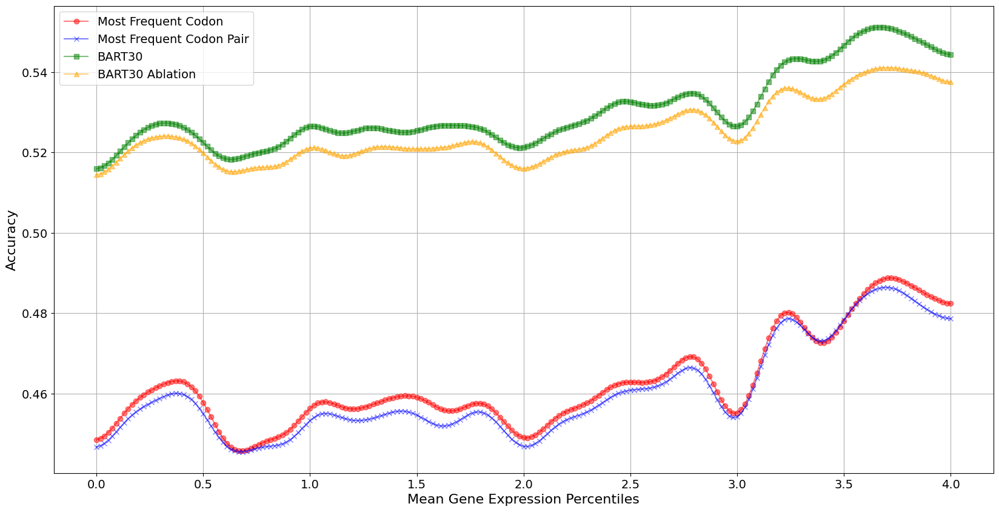

In [129]:
# Drop rows with NaN values in 'median_float'
temp_df = test_with_results.dropna(subset=['median']).copy()

# Replace 'median' string values with their index integer values
expr_labels = ['expr_low25', 'expr_pre25_50', 'expr_pre50_75', 'expr_pre75_90', 'expr_top10']
temp_df.loc[:, 'median'] = temp_df['median'].apply(lambda x: [expr_labels.index(v) for v in x] if isinstance(x, tuple) else x)

# Extract mean of each list in the 'median' column
temp_df.loc[:, 'mean_expression'] = temp_df['median'].apply(lambda x: np.mean(x) if isinstance(x, list) else x)

# sort temp_df by the mean of the 'median_float' column
sorted_df = temp_df.sort_values('mean_expression')

# Group by 'median_float' and calculate the average of the accuracy columns
grouped_by_mean_expression = sorted_df.groupby('mean_expression')
average_accuracies_per_mean_expression = grouped_by_mean_expression[['mfc_accuracy', 'mfb_accuracy', 'bart30_accuracy', 'bart30_ablation_accuracy']].mean()

# Apply Gaussian smoothing
sgma = 5

smoothed_mfc_accuracy = gaussian_filter1d(average_accuracies_per_mean_expression['mfc_accuracy'], sigma=sgma)
smoothed_mfb_accuracy = gaussian_filter1d(average_accuracies_per_mean_expression['mfb_accuracy'], sigma=sgma)
smoothed_bart_accuracy = gaussian_filter1d(average_accuracies_per_mean_expression['bart30_accuracy'], sigma=sgma)
smoothed_bart_ablation_accuracy = gaussian_filter1d(average_accuracies_per_mean_expression['bart30_ablation_accuracy'], sigma=sgma)

# Plot the accuracies vs. mean 'median_float' values
plt.figure(figsize=(20, 10))

plt.plot(average_accuracies_per_mean_expression.index, smoothed_mfc_accuracy, marker='o', alpha=0.5, color='red', label='Most Frequent Codon')
plt.plot(average_accuracies_per_mean_expression.index, smoothed_mfb_accuracy, marker='x', alpha=0.5, color='blue', label='Most Frequent Codon Pair')
plt.plot(average_accuracies_per_mean_expression.index, smoothed_bart_accuracy, marker='s', alpha=0.5, color='green', label='BART30')
plt.plot(average_accuracies_per_mean_expression.index, smoothed_bart_ablation_accuracy, marker='^', alpha=0.5, color='orange', label='BART30 Ablation')

# plt.title(f'Prediction Accuracy vs. Mean Expression Percentiles with Gaussian Smoothing (σ={sgma})', fontsize=20)
plt.xlabel('Mean Gene Expression Percentiles', fontsize=16)
plt.xticks(fontsize=14)
plt.ylabel('Accuracy', fontsize=16)
plt.yticks(fontsize=14)
plt.legend(fontsize=14)
plt.grid(True)

plt.savefig('model_accuracies_vs_mean_expression_percentiles.svg', format='svg', bbox_inches='tight')

plt.show()

## Accuracy vs. Expression Magnitude

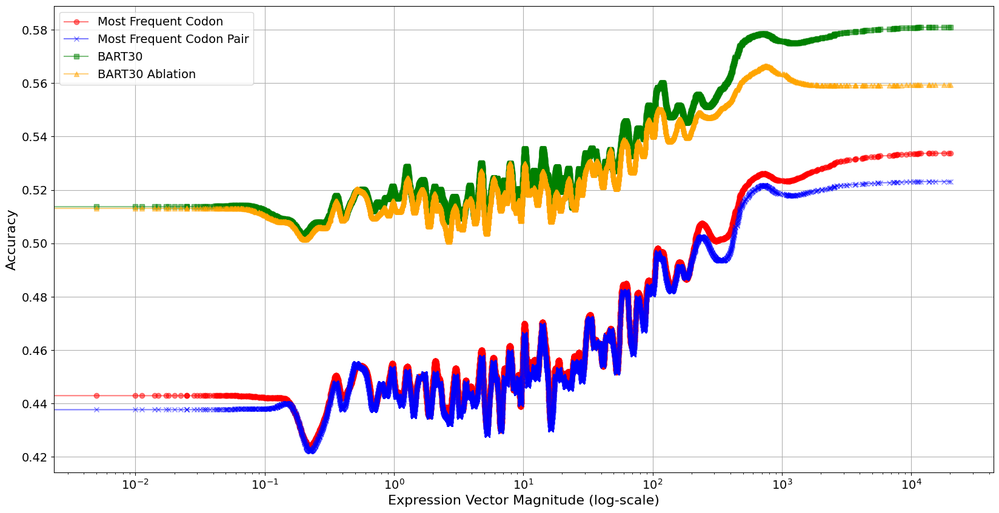

In [131]:
# Drop rows with NaN values in 'median_float'
temp_df = test_with_results.dropna(subset=['median']).copy()

# Extract mean of each list in the 'median' column
temp_df.loc[:, 'expression_magnitude'] = temp_df['median_float'].apply(lambda x: np.linalg.norm(x) if isinstance(x, tuple) else x)

# sort temp_df by the mean of the 'median_float' column
sorted_df = temp_df.sort_values('expression_magnitude')

# Group by 'median_float' and calculate the average of the accuracy columns
grouped_by_expression_magnitude = sorted_df.groupby('expression_magnitude')
average_accuracies_per_expression_magnitude = grouped_by_expression_magnitude[['mfc_accuracy', 'mfb_accuracy', 'bart30_accuracy', 'bart30_ablation_accuracy']].mean()

# Apply Gaussian smoothing
sgma = 50

smoothed_mfc_accuracy = gaussian_filter1d(average_accuracies_per_expression_magnitude['mfc_accuracy'], sigma=sgma)
smoothed_mfb_accuracy = gaussian_filter1d(average_accuracies_per_expression_magnitude['mfb_accuracy'], sigma=sgma)
smoothed_bart_accuracy = gaussian_filter1d(average_accuracies_per_expression_magnitude['bart30_accuracy'], sigma=sgma)
smoothed_bart_ablation_accuracy = gaussian_filter1d(average_accuracies_per_expression_magnitude['bart30_ablation_accuracy'], sigma=sgma)

# Plot the accuracies vs. mean 'median_float' values
plt.figure(figsize=(20, 10))

plt.plot(average_accuracies_per_expression_magnitude.index, smoothed_mfc_accuracy, marker='o', alpha=0.5, color='red', label='Most Frequent Codon')
plt.plot(average_accuracies_per_expression_magnitude.index, smoothed_mfb_accuracy, marker='x', alpha=0.5, color='blue', label='Most Frequent Codon Pair')
plt.plot(average_accuracies_per_expression_magnitude.index, smoothed_bart_accuracy, marker='s', alpha=0.5, color='green', label='BART30')
plt.plot(average_accuracies_per_expression_magnitude.index, smoothed_bart_ablation_accuracy, marker='^', alpha=0.5, color='orange', label='BART30 Ablation')

# plt.title(f'Prediction Accuracy vs. Log-Scale Expression Vector Magnitude with Gaussian Smoothing (σ={sgma})', fontsize=20)
plt.xlabel('Expression Vector Magnitude (log-scale)', fontsize=16)
plt.xticks(fontsize=14)
plt.xscale('log')
plt.ylabel('Accuracy', fontsize=16)
plt.yticks(fontsize=14)
plt.legend(fontsize=14)
plt.grid(True)

plt.savefig('model_accuracies_vs_expression_vector_magnitude.svg', format='svg', bbox_inches='tight')

plt.show()

## Accuracy Vs. Expression Uni-Directionality

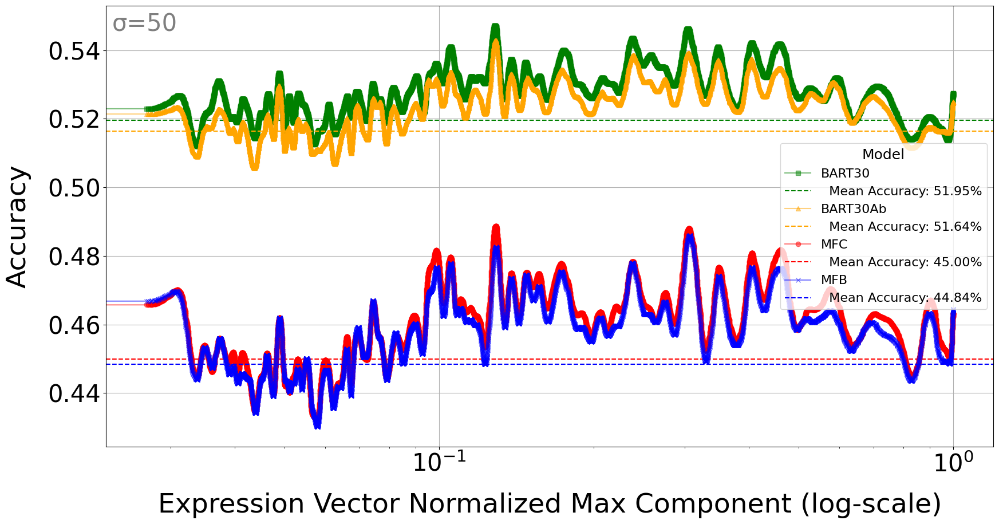

In [62]:
# Drop rows with NaN values in 'median_float'
temp_df = test_with_results.dropna(subset=['median']).copy()

# Extract mean of each list in the 'median' column
temp_df.loc[:, 'expression_normalized_max_component'] = temp_df['median_float'].apply(lambda x: np.max(x) / np.sum(x) if (isinstance(x, tuple) and np.sum(x) != 0) else 0)

# sort temp_df by the mean of the 'median_float' column
sorted_df = temp_df.sort_values('expression_normalized_max_component')

# Group by 'median_float' and calculate the average of the accuracy columns
grouped_by_expression_normalized_max_component = sorted_df.groupby('expression_normalized_max_component')
average_accuracies_per_expression_normalized_max_component = grouped_by_expression_normalized_max_component[['mfc_accuracy', 'mfb_accuracy', 'bart30_accuracy', 'bart30_ablation_accuracy']].mean()

# Apply Gaussian smoothing
sgma = 50

smoothed_mfc_accuracy = gaussian_filter1d(average_accuracies_per_expression_normalized_max_component['mfc_accuracy'], sigma=sgma)
smoothed_mfb_accuracy = gaussian_filter1d(average_accuracies_per_expression_normalized_max_component['mfb_accuracy'], sigma=sgma)
smoothed_bart_accuracy = gaussian_filter1d(average_accuracies_per_expression_normalized_max_component['bart30_accuracy'], sigma=sgma)
smoothed_bart_ablation_accuracy = gaussian_filter1d(average_accuracies_per_expression_normalized_max_component['bart30_ablation_accuracy'], sigma=sgma)

# Plot the accuracies vs. mean 'median_float' values
plt.figure(figsize=(20, 10))

plt.plot(average_accuracies_per_expression_normalized_max_component.index, smoothed_bart_accuracy, marker='s', alpha=0.5, color='green', label='BART30')
plt.axhline(avg_bart30_accuracy, color='g', linestyle='--', label=f'  Mean Accuracy: {avg_bart30_accuracy * 100:.2f}%')

plt.plot(average_accuracies_per_expression_normalized_max_component.index, smoothed_bart_ablation_accuracy, marker='^', alpha=0.5, color='orange', label='BART30Ab')
plt.axhline(avg_bart30_ablation_accuracy, color='orange', linestyle='--', label=f'  Mean Accuracy: {avg_bart30_ablation_accuracy * 100:.2f}%')

plt.plot(average_accuracies_per_expression_normalized_max_component.index, smoothed_mfc_accuracy, marker='o', alpha=0.5, color='red', label='MFC')
plt.axhline(avg_mfc_accuracy, color='r', linestyle='--', label=f'  Mean Accuracy: {avg_mfc_accuracy * 100:.2f}%')

plt.plot(average_accuracies_per_expression_normalized_max_component.index, smoothed_mfb_accuracy, marker='x', alpha=0.5, color='blue', label='MFB')
plt.axhline(avg_mfb_accuracy, color='b', linestyle='--', label=f'  Mean Accuracy: {avg_mfb_accuracy * 100:.2f}%')

# plt.title(f'Prediction Accuracy vs. Log-Scale Expression Vector Normalized Max Component with Gaussian Smoothing (σ={sgma})', fontsize=20)
plt.xlabel('Expression Vector Normalized Max Component (log-scale)', fontsize=34, labelpad=20)
plt.xticks(fontsize=30)
plt.xscale('log')
plt.ylabel('Accuracy', fontsize=34, labelpad=20)
plt.yticks(fontsize=30)
plt.legend(fontsize=16, title='Model', title_fontsize=18)
plt.grid(True)

# annotate sigma value in the top left corner
plt.annotate(f'σ={sgma}', xy=(0.08, 0.93), xycoords='axes fraction', fontsize=30, ha='right', va='bottom', alpha=0.5)

plt.savefig('model_accuracies_vs_expression_normalized_max_component.svg', format='svg', bbox_inches='tight')

plt.show()

## Accuracy vs. In-Vector STD

C:\Users\wsega\AppData\Local\Temp\ipykernel_14300\3194484895.py:5: RuntimeWarning: invalid value encountered in divide
  normalized_normalized_test_float_vectors = normalized_test_float_vectors / np.linalg.norm(normalized_test_float_vectors, axis=1, keepdims=True)


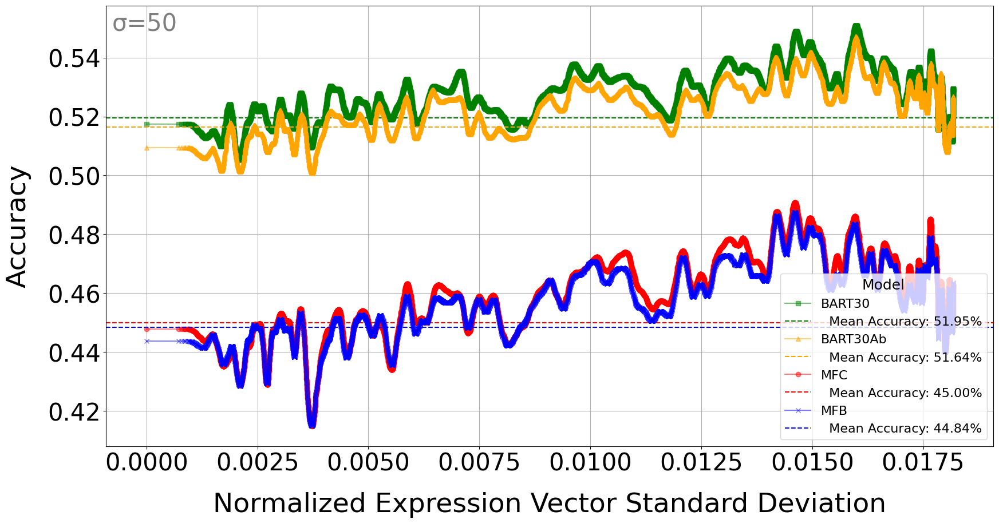

In [77]:
# Drop rows with NaN values in 'median_float'
temp_df = test_with_results.dropna(subset=['median_float']).copy()

# Calculate the standard deviation for each vector in 'median_float'
normalized_normalized_test_float_vectors = normalized_test_float_vectors / np.linalg.norm(normalized_test_float_vectors, axis=1, keepdims=True)
normalized_normalized_test_float_vectors[np.isnan(normalized_normalized_test_float_vectors)] = 0
temp_df.loc[:, 'expression_var'] = np.pow(normalized_normalized_test_float_vectors.std(axis=1), 2)

# Sort temp_df by the calculated standard deviation
sorted_df = temp_df.sort_values('expression_var')

# Group by 'expression_std' and calculate the average of the accuracy columns
grouped_by_expression_var = sorted_df.groupby('expression_var')
average_accuracies_per_expression_var = grouped_by_expression_var[['mfc_accuracy', 'mfb_accuracy', 'bart30_accuracy', 'bart30_ablation_accuracy']].mean()

# Apply Gaussian smoothing
sgma = 50

smoothed_mfc_accuracy = gaussian_filter1d(average_accuracies_per_expression_var['mfc_accuracy'], sigma=sgma)
smoothed_mfb_accuracy = gaussian_filter1d(average_accuracies_per_expression_var['mfb_accuracy'], sigma=sgma)
smoothed_bart_accuracy = gaussian_filter1d(average_accuracies_per_expression_var['bart30_accuracy'], sigma=sgma)
smoothed_bart_ablation_accuracy = gaussian_filter1d(average_accuracies_per_expression_var['bart30_ablation_accuracy'], sigma=sgma)

# Plot the accuracies vs. standard deviation
plt.figure(figsize=(20, 10))

plt.plot(average_accuracies_per_expression_var.index, smoothed_bart_accuracy, marker='s', alpha=0.5, color='green', label='BART30')
plt.axhline(avg_bart30_accuracy, color='g', linestyle='--', label=f'  Mean Accuracy: {avg_bart30_accuracy * 100:.2f}%')

plt.plot(average_accuracies_per_expression_var.index, smoothed_bart_ablation_accuracy, marker='^', alpha=0.5, color='orange', label='BART30Ab')
plt.axhline(avg_bart30_ablation_accuracy, color='orange', linestyle='--', label=f'  Mean Accuracy: {avg_bart30_ablation_accuracy * 100:.2f}%')

plt.plot(average_accuracies_per_expression_var.index, smoothed_mfc_accuracy, marker='o', alpha=0.5, color='red', label='MFC')
plt.axhline(avg_mfc_accuracy, color='r', linestyle='--', label=f'  Mean Accuracy: {avg_mfc_accuracy * 100:.2f}%')

plt.plot(average_accuracies_per_expression_var.index, smoothed_mfb_accuracy, marker='x', alpha=0.5, color='blue', label='MFB')
plt.axhline(avg_mfb_accuracy, color='b', linestyle='--', label=f'  Mean Accuracy: {avg_mfb_accuracy * 100:.2f}%')

# plt.title(f'Prediction Accuracy vs. Standard Deviation of Expression Values with Gaussian Smoothing (σ={sgma})', fontsize=20)
plt.xlabel('Normalized Expression Vector Standard Deviation', fontsize=34, labelpad=20)
plt.xticks(fontsize=30)
plt.ylabel('Accuracy', fontsize=34, labelpad=20)
plt.yticks(fontsize=30)
plt.legend(fontsize=16, title='Model', title_fontsize=18, loc='lower right')
plt.grid(True)

# Annotate sigma value in the top left corner
plt.annotate(f'σ={sgma}', xy=(0.08, 0.93), xycoords='axes fraction', fontsize=30, ha='right', va='bottom', alpha=0.5)

# plt.savefig('model_accuracies_vs_expression_std.svg', format='svg', bbox_inches='tight')

plt.show()


## Accuracy vs. Expression Max Component

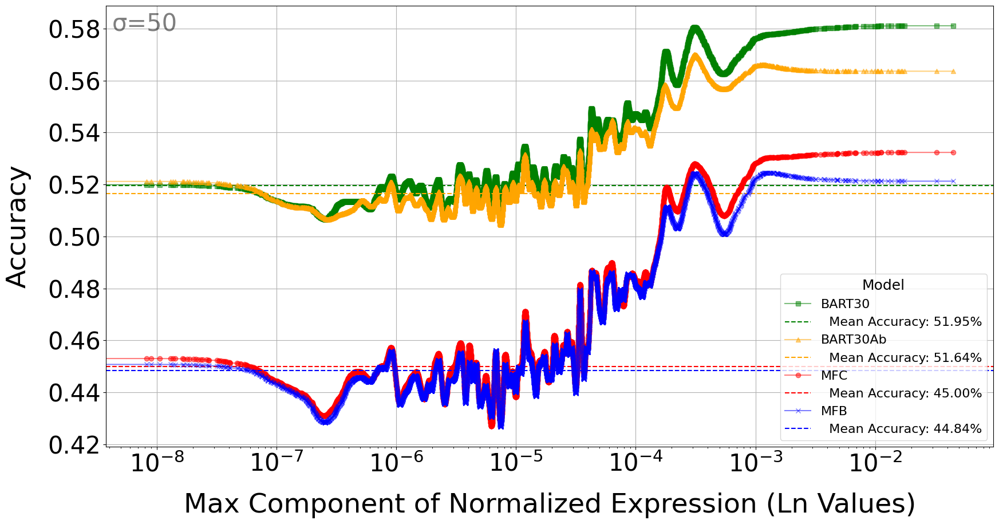

In [58]:
# Drop rows with NaN values in 'median_float'
temp_df = test_with_results.dropna(subset=['median_float']).copy()

# Mean expression values
max_normalized_test_float_vectors = np.max(normalized_test_float_vectors, axis=1)
temp_df.loc[:, 'max_expression'] = max_normalized_test_float_vectors

# Sort temp_df by mean expression
sorted_df = temp_df.sort_values('max_expression')

# Group by 'max_expression' and calculate the average of the accuracy columns
grouped_by_mean_expression = sorted_df.groupby('max_expression')
average_accuracies_per_mean_expression = grouped_by_mean_expression[['mfc_accuracy', 'mfb_accuracy', 'bart30_accuracy', 'bart30_ablation_accuracy']].mean()

# Apply Gaussian smoothing
sgma = 50

smoothed_mfc_accuracy = gaussian_filter1d(average_accuracies_per_mean_expression['mfc_accuracy'], sigma=sgma)
smoothed_mfb_accuracy = gaussian_filter1d(average_accuracies_per_mean_expression['mfb_accuracy'], sigma=sgma)
smoothed_bart_accuracy = gaussian_filter1d(average_accuracies_per_mean_expression['bart30_accuracy'], sigma=sgma)
smoothed_bart_ablation_accuracy = gaussian_filter1d(average_accuracies_per_mean_expression['bart30_ablation_accuracy'], sigma=sgma)

# Plot the accuracies vs. mean 'median_float' values
plt.figure(figsize=(20, 10))

plt.plot(average_accuracies_per_mean_expression.index, smoothed_bart_accuracy, marker='s', alpha=0.5, color='green', label='BART30')
plt.axhline(avg_bart30_accuracy, color='g', linestyle='--', label=f'  Mean Accuracy: {avg_bart30_accuracy * 100:.2f}%')

plt.plot(average_accuracies_per_mean_expression.index, smoothed_bart_ablation_accuracy, marker='^', alpha=0.5, color='orange', label='BART30Ab')
plt.axhline(avg_bart30_ablation_accuracy, color='orange', linestyle='--', label=f'  Mean Accuracy: {avg_bart30_ablation_accuracy * 100:.2f}%')

plt.plot(average_accuracies_per_mean_expression.index, smoothed_mfc_accuracy, marker='o', alpha=0.5, color='red', label='MFC')
plt.axhline(avg_mfc_accuracy, color='r', linestyle='--', label=f'  Mean Accuracy: {avg_mfc_accuracy * 100:.2f}%')

plt.plot(average_accuracies_per_mean_expression.index, smoothed_mfb_accuracy, marker='x', alpha=0.5, color='blue', label='MFB')
plt.axhline(avg_mfb_accuracy, color='b', linestyle='--', label=f'  Mean Accuracy: {avg_mfb_accuracy * 100:.2f}%')

# plt.title(f'Prediction Accuracy vs. Log-Scale Mean Expression Values with Gaussian Smoothing (σ={sgma})', fontsize=20)
plt.xlabel('Max Component of Normalized Expression (Ln Values)', fontsize=34, labelpad=20)
plt.xticks(fontsize=30)
plt.ylabel('Accuracy', fontsize=34, labelpad=20)
plt.yticks(fontsize=30)
plt.xscale('log')
plt.legend(fontsize=16, title='Model', title_fontsize=18, loc='lower right')
plt.grid(True)

# annotate sigma value in the top left corner
plt.annotate(f'σ={sgma}', xy=(0.08, 0.93), xycoords='axes fraction', fontsize=30, ha='right', va='bottom', alpha=0.5)

plt.savefig('model_accuracies_vs_max_component_expression.svg', format='svg', bbox_inches='tight')

plt.show()

## Accuracy Vs. Expression per Tissue Site

In [9]:
# Tissue Site Detail Ids
tissueSiteDetailId = ('Adipose_Subcutaneous', 'Adipose_Visceral_Omentum', 'Adrenal_Gland', 'Artery_Aorta', 'Artery_Coronary', 'Artery_Tibial', 'Bladder', 'Brain_Amygdala', 'Brain_Anterior_cingulate_cortex_BA24', 'Brain_Caudate_basal_ganglia', 'Brain_Cerebellar_Hemisphere', 'Brain_Cerebellum', 'Brain_Cortex', 'Brain_Frontal_Cortex_BA9', 'Brain_Hippocampus', 'Brain_Hypothalamus', 'Brain_Nucleus_accumbens_basal_ganglia', 'Brain_Putamen_basal_ganglia', 'Brain_Spinal_cord_cervical_c-1', 'Brain_Substantia_nigra', 'Breast_Mammary_Tissue', 'Cells_EBV-transformed_lymphocytes', 'Cells_Cultured_fibroblasts', 'Cervix_Ectocervix', 'Cervix_Endocervix', 'Colon_Sigmoid', 'Colon_Transverse', 'Esophagus_Gastroesophageal_Junction', 'Esophagus_Mucosa', 'Esophagus_Muscularis', 'Fallopian_Tube', 'Heart_Atrial_Appendage', 'Heart_Left_Ventricle', 'Kidney_Cortex', 'Kidney_Medulla', 'Liver', 'Lung', 'Minor_Salivary_Gland', 'Muscle_Skeletal', 'Nerve_Tibial', 'Ovary', 'Pancreas', 'Pituitary', 'Prostate', 'Skin_Not_Sun_Exposed_Suprapubic', 'Skin_Sun_Exposed_Lower_leg', 'Small_Intestine_Terminal_Ileum', 'Spleen', 'Stomach', 'Testis', 'Thyroid', 'Uterus', 'Vagina', 'Whole_Blood')

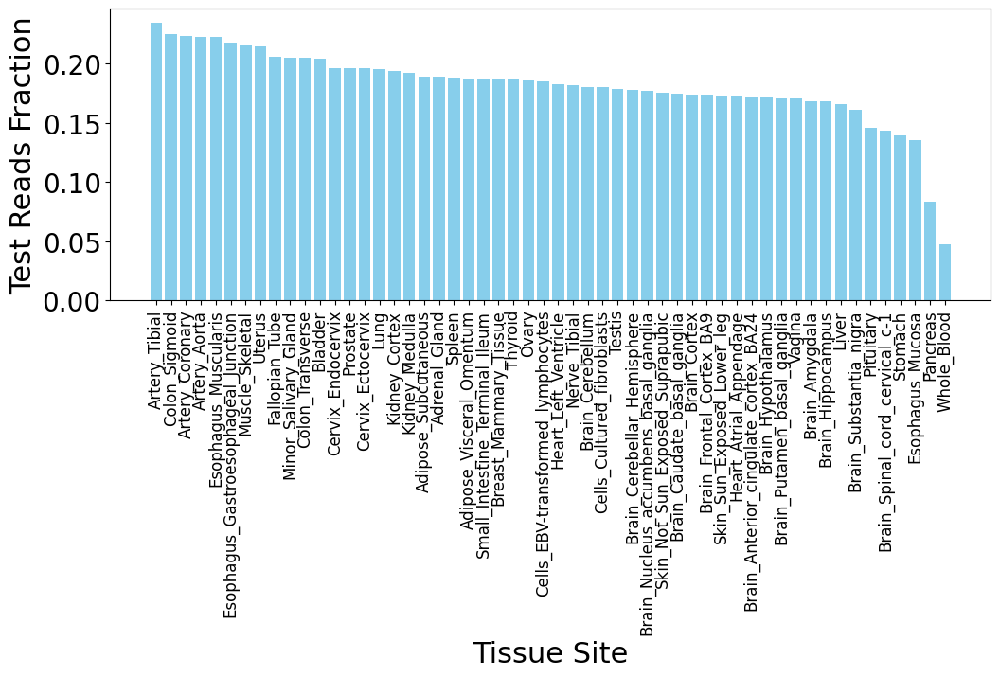

In [33]:
# Convert normalized 'median_float' tuples into separate columns
median_float_df = pd.DataFrame(normalized_test_float_vectors, columns=tissueSiteDetailId)

test_total_reads = median_float_df.sum(axis=0)

# plot barplot of test total reads per tissue
# Sort the total reads and corresponding tissue sites
sorted_total_reads = test_total_reads.sort_values(ascending=False)

# Create a colormap
# cmap = plt.get_cmap('coolwarm_r')
# Normalize the total_reads values to the range [0, 1]
# norm = mcolors.Normalize(vmin=0, vmax=len(sorted_total_reads) - 1)
# Create a list of colors based on the normalized values
# colors = [cmap(norm(i)) for i in range(len(sorted_total_reads))]

plt.figure(figsize=(12, 4))
plt.bar(sorted_total_reads.index, sorted_total_reads.values, color='skyblue')
plt.xticks(rotation=90, fontsize=12)
plt.xlabel('Tissue Site', fontsize=22)
plt.ylabel('Test Reads Fraction', fontsize=22)
plt.yticks(fontsize=20)
# plt.title('Histogram of Test Total Reads Per Tissue (Sorted by Total Reads)', fontsize=14)
# plt.tight_layout()

plt.savefig('fraction_test_total_reads_per_tissue.svg', format='svg', bbox_inches='tight')

plt.show()

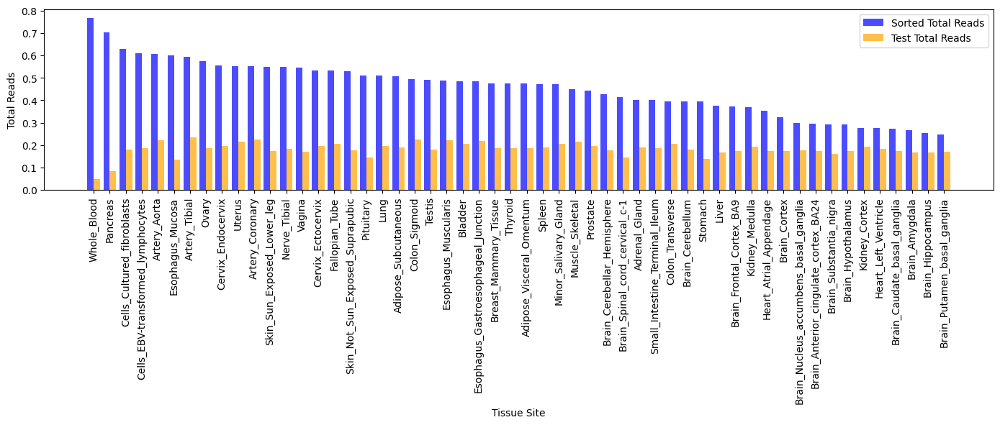

In [17]:
# Sort test_total_reads by the same order as sorted_total_reads
sorted_test_total_reads = [test_total_reads[tissue] for tissue in sorted_tissues]

# Create a grouped barplot
x = range(len(sorted_tissues))  # X-axis positions
width = 0.4  # Width of each bar

plt.figure(figsize=(14, 6))

# Bar for sorted_total_reads
plt.bar(x, np.array(sorted_total_reads) / 1e6, width=width, label='Sorted Total Reads', color='blue', alpha=0.7)

# Bar for test_total_reads, shifted by bar width
plt.bar([pos + width for pos in x], sorted_test_total_reads, width=width, label='Test Total Reads', color='orange', alpha=0.7)

# Add labels and legend
plt.xticks([pos + width / 2 for pos in x], sorted_tissues, rotation=90)
plt.ylabel('Total Reads')
plt.xlabel('Tissue Site')
plt.legend()

# Save the figure as an SVG file
# plt.savefig('two_hued_total_reads_per_tissue.svg', format='svg', transparent=True, bbox_inches='tight')

plt.tight_layout()
plt.show()

### Correlation Heatmaps

#### not normalized

In [165]:
# Drop rows with NaN values in 'median_float'
temp_df = test_with_results.dropna(subset=['median_float'])[['bart30_accuracy', 'mfc_accuracy', 'mfb_accuracy', 'median_float']]

# Convert 'median_float' tuples into separate columns
median_float_df = temp_df['median_float'].apply(pd.Series)

# Rename the columns for clarity
median_float_df.columns = [f'tissue_position_{i}' for i in range(median_float_df.shape[1])]

# Concatenate the new columns with the original DataFrame
temp_df = pd.concat([temp_df, median_float_df], axis=1)

# Calculate correlations between each tissue position and the accuracy columns
correlations = {}
for col in median_float_df.columns:
    correlations[col] = {
        'bart30_accuracy': temp_df[col].corr(temp_df['bart30_accuracy'], method='spearman'),
        'mfc_accuracy': temp_df[col].corr(temp_df['mfc_accuracy'], method='spearman'),
        'mfb_accuracy': temp_df[col].corr(temp_df['mfb_accuracy'], method='spearman'),
    }

# Create a DataFrame from the correlations dictionary
correlations_df = pd.DataFrame(correlations)

In [182]:
# Drop rows with NaN values in 'median_float'
temp_df = test_with_results.dropna(subset=['median_float'])[['bart30_accuracy', 'mfc_accuracy', 'mfb_accuracy']]

# Convert 'median_float' tuples into separate columns
median_float_df = pd.DataFrame(test_with_results['median_float'].dropna().tolist(), columns=tissueSiteDetailId)
median_float_df.set_index(temp_df.index, inplace=True)

# Concatenate the new columns with the original DataFrame
temp_df = pd.concat([temp_df, median_float_df], axis=1)

# Calculate correlations between each tissue position and the accuracy columns
correlations = {}
for col in median_float_df.columns:
    correlations[col] = {
        'bart30_accuracy': temp_df[col].corr(temp_df['bart30_accuracy'], method='spearman'),
        'mfc_accuracy': temp_df[col].corr(temp_df['mfc_accuracy'], method='spearman'),
        'mfb_accuracy': temp_df[col].corr(temp_df['mfb_accuracy'], method='spearman'),
    }

# Create a DataFrame from the correlations dictionary
correlations_df = pd.DataFrame(correlations)

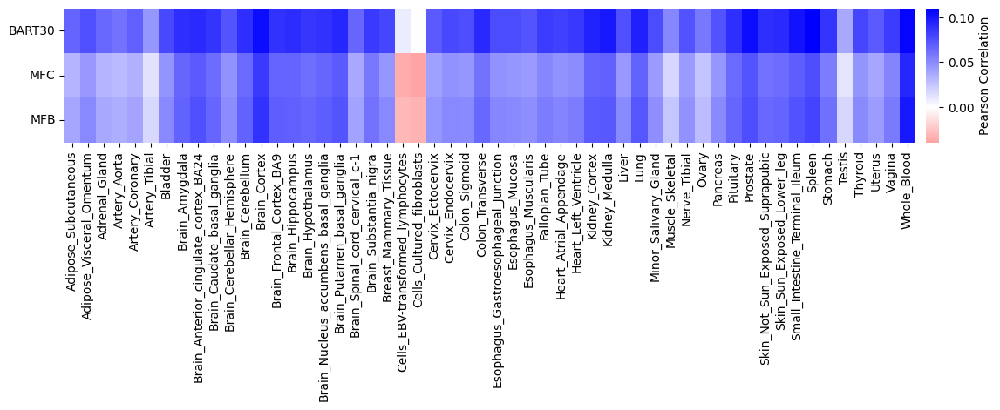

In [183]:
# Plot the correlations in a heatmap with swapped x and y axes
plt.figure(figsize=(15, 2))
sns.heatmap(correlations_df, annot=False, cmap='bwr_r', center=0, yticklabels=['BART30', 'MFC', 'MFB'], xticklabels=tissueSiteDetailId, cbar_kws={'label': 'Pearson Correlation', 'aspect': 10, 'pad': 0.01})
plt.yticks(rotation=0)
# plt.title('Correlations between Model Accuracies and Tissue Positions\n', fontsize=20)
plt.show()

#### normalized

In [191]:
# Drop rows with NaN values in 'median_float'
temp_df = test_with_results.dropna(subset=['median_float'])[['bart30_accuracy', 'bart30_ablation_accuracy', 'mfc_accuracy', 'mfb_accuracy', 'median_float']]

# Convert normalized 'median_float' tuples into separate columns
median_float_df = pd.DataFrame(normalized_test_float_vectors, columns=tissueSiteDetailId, index=test_median_float_indices)
# Add mean expression column
median_float_df['Mean of all Tissues'] = median_float_df.mean(axis=1)

# Concatenate the new columns with the original DataFrame
temp_df = pd.concat([temp_df, median_float_df], axis=1)

# Calculate correlations and p-values between each tissue position and the accuracy columns
correlations = {}
p_values = {}

for col in median_float_df.columns:
    correlations[col] = {}
    p_values[col] = {}
    for metric in ['bart30_accuracy', 'bart30_ablation_accuracy', 'mfc_accuracy', 'mfb_accuracy']:
        corr, p_val = spearmanr(temp_df[col], temp_df[metric], nan_policy='omit')
        correlations[col][metric] = corr
        p_values[col][metric] = p_val

# Create DataFrames from the correlations and p-values dictionaries
correlations_df = pd.DataFrame(correlations)
p_values_df = pd.DataFrame(p_values)

# Flatten the p-values DataFrame for adjustment
flattened_p_values = p_values_df.values.flatten()

# Perform Benjamini-Hochberg correction
_, adjusted_p_values, _, _ = multipletests(flattened_p_values, method='bonferroni')

# Reshape adjusted p-values back to the original DataFrame shape
adjusted_p_values_df = pd.DataFrame(adjusted_p_values.reshape(p_values_df.shape), 
                                    index=p_values_df.index, 
                                    columns=p_values_df.columns)

# Sort the correlations DataFrame by 'mfc_accuracy' in descending order
sorted_correlations_df = correlations_df.T.sort_values(['mfc_accuracy', 'bart30_accuracy'], ascending=False).T

# Sort the adjusted p-values DataFrame using the same order as sorted correlations
sorted_adjusted_p_values_df = adjusted_p_values_df.T.loc[sorted_correlations_df.columns].T

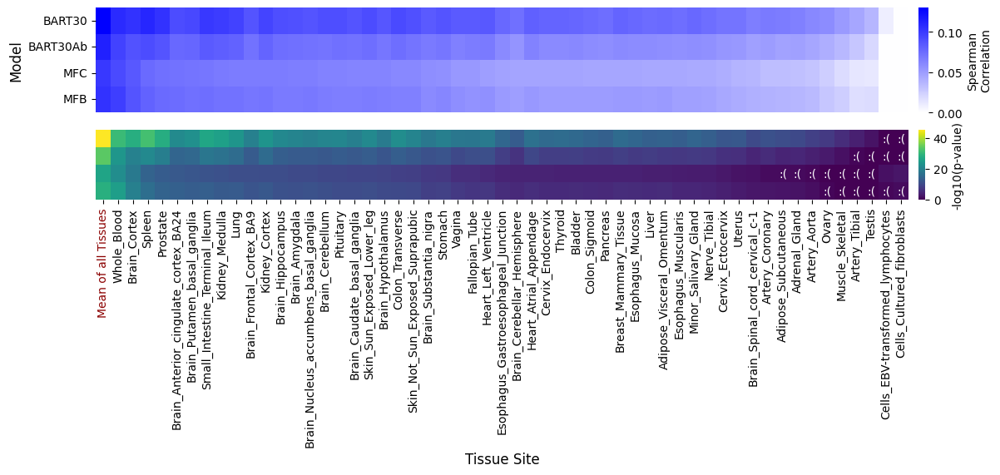

In [194]:
# Plot the correlations in a heatmap with swapped x and y axes
fig, axes = plt.subplots(2, 1, figsize=(15, 3), gridspec_kw={'height_ratios': [1.5, 1]})

# Correlation heatmap
sns.heatmap(sorted_correlations_df, annot=False, cmap='bwr_r', center=0, yticklabels=['BART30', 'BART30Ab', 'MFC', 'MFB'], 
            cbar_kws={'label': 'Spearman\nCorrelation', 'aspect': 10, 'pad': 0.01}, vmin=0, ax=axes[0])
axes[0].set_yticks([0.5, 1.5, 2.5, 3.5])
axes[0].set_yticklabels(['BART30', 'BART30Ab', 'MFC', 'MFB'], rotation=0)
axes[0].set_xticks([])
axes[0].set_xlabel('')
axes[0].set_ylabel('Model', fontsize=12)

# Statistical significance heatmap
sns.heatmap(-np.log10(sorted_adjusted_p_values_df), annot=False, cmap='viridis', cbar_kws={'label': '-log10(p-value)', 'aspect': 10, 'pad': 0.01}, 
            ax=axes[1])

# Annotate squares with p-values > 0.05
for i in range(sorted_adjusted_p_values_df.shape[0]):
    for j in range(sorted_adjusted_p_values_df.shape[1]):
        if sorted_adjusted_p_values_df.iloc[i, j] >= 0.05:
            axes[1].text(j + 0.5, i + 0.5, ":(", ha='center', va='center', color='white', fontsize=10)

axes[1].set_xlabel('Tissue Site', fontsize=12)
axes[1].set_xticklabels(sorted_adjusted_p_values_df.columns, rotation=90, fontsize=10)
axes[1].get_xticklabels()[0].set_color('darkred')

axes[1].set_yticks([])
axes[1].set_ylabel('')

# Adjust layout to prevent truncation
# plt.tight_layout()

# Save the figure
plt.savefig('model_accuracies_vs_normalized_tissue_expression_correlation_with_pvalues.svg', format='svg', bbox_inches='tight')

plt.show()

#### Integer Category Correlations

In [175]:
# Drop rows with NaN values in 'median_float'
temp_df = test_with_results.dropna(subset=['median'])[['bart30_accuracy', 'mfc_accuracy', 'mfb_accuracy', 'median']].copy()

# Replace 'median' string values with their index integer values
expr_labels = ['expr_low25', 'expr_pre25_50', 'expr_pre50_75', 'expr_pre75_90', 'expr_top10']
temp_df.loc[:, 'median'] = temp_df['median'].apply(lambda x: [expr_labels.index(v) for v in x] if isinstance(x, tuple) else x)

# Convert normalized 'median_float' tuples into separate columns
median_int_df = pd.DataFrame(temp_df['median'].tolist(), columns=tissueSiteDetailId, index=temp_df.index)

# Concatenate the new columns with the original DataFrame
temp_df = pd.concat([temp_df, median_int_df], axis=1)

# Calculate correlations between each tissue position and the accuracy columns
int_correlations = {}
for col in median_int_df.columns:
    int_correlations[col] = {
        'bart30_accuracy': temp_df[col].corr(temp_df['bart30_accuracy'], method='spearman'),
        'mfc_accuracy': temp_df[col].corr(temp_df['mfc_accuracy'], method='spearman'),
        'mfb_accuracy': temp_df[col].corr(temp_df['mfb_accuracy'], method='spearman'),
    }

# Create a DataFrame from the correlations dictionary
int_correlations_df = pd.DataFrame(int_correlations)

sorted_int_correlations_df = int_correlations_df.T.sort_values('mfc_accuracy', ascending=False).T

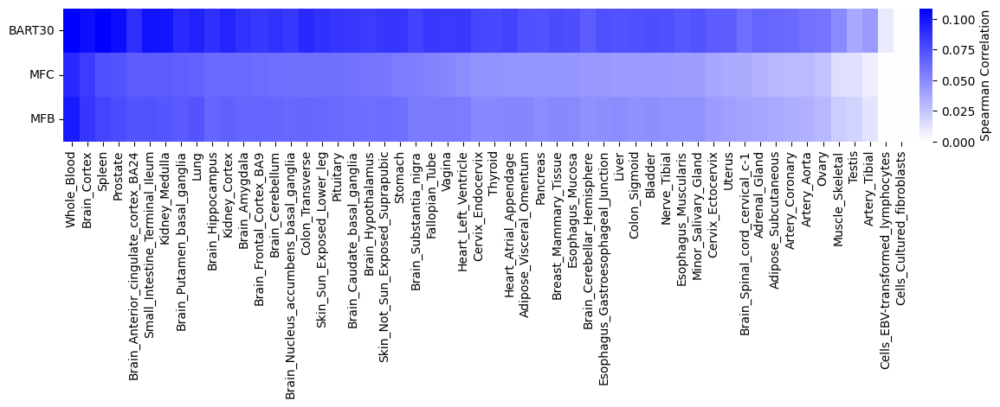

In [176]:
# Plot the correlations in a heatmap with swapped x and y axes
plt.figure(figsize=(15, 2))
# cet cbar lower limit to 0
sns.heatmap(sorted_int_correlations_df, annot=False, cmap='bwr_r', center=0, yticklabels=['BART30', 'MFC', 'MFB'], cbar_kws={'label': 'Spearman Correlation', 'aspect': 10, 'pad': 0.01}, vmin=0)
plt.yticks(rotation=0)
# plt.title('Correlations between Model Accuracies and Tissue Positions\n', fontsize=20)

plt.savefig('model_accuracies_vs_category_tissue_expression_correlation.svg', format='svg', bbox_inches='tight')

plt.show()

#### Average Across Tissues

In [177]:
# Drop rows with NaN values in 'median_float'
temp_df = test_with_results.dropna(subset=['median_float'])[['bart30_accuracy', 'mfc_accuracy', 'mfb_accuracy']]

# Convert normalized 'median_float' tuples into separate columns
median_float_df = pd.DataFrame(normalized_test_float_vectors, columns=tissueSiteDetailId, index=test_median_float_indices)
median_float_df = median_float_df.mean(axis=1)

# Concatenate the new columns with the original DataFrame
temp_df = pd.concat([temp_df, median_float_df], axis=1)

# Calculate correlations between each tissue position and the accuracy columns
mean_correlations = {}
mean_correlations = {
    'bart30_accuracy': temp_df[0].corr(temp_df['bart30_accuracy'], method='spearman'),
    'mfc_accuracy': temp_df[0].corr(temp_df['mfc_accuracy'], method='spearman'),
    'mfb_accuracy': temp_df[0].corr(temp_df['mfb_accuracy'], method='spearman'),
}

# Create a DataFrame from the correlations dictionary
mean_correlations_df = pd.DataFrame([
    ['BART30', mean_correlations['bart30_accuracy']],
    ['MFC', mean_correlations['mfc_accuracy']],
    ['MFB', mean_correlations['mfb_accuracy']]
], columns=['Model', 'Spearman Correlation'])

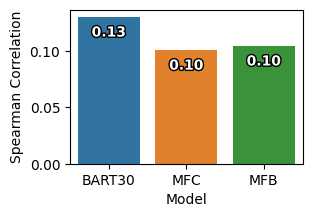

In [178]:
# Plot the correlation in a barplot
plt.figure(figsize=(3, 2))

sns.barplot(data=mean_correlations_df, x='Model', y='Spearman Correlation', hue='Model', palette='tab10', legend=False)

# Annotate the values on the plot
for i, value in enumerate(mean_correlations_df['Spearman Correlation']):
    # add color and stroke to text
    plt.text(i, value - 0.02, f'{value:.2f}', ha='center', va='bottom', color='white', fontsize=10, fontweight='bold', path_effects=[pe.withStroke(linewidth=2, foreground='black')])

# plt.title('Mean Expression x Model Accuracies Correlation\n', fontsize=20)
# plt.xlabel('Model', fontsize=12)
plt.ylabel('Spearman Correlation')

# Save the plot to svg file
plt.savefig('model_accuracies_vs_mean_normalized_tissue_expression_correlation.svg', format='svg', bbox_inches='tight')

plt.show()


In [179]:
# Drop rows with NaN values in 'median_float'
temp_df = test_with_results.dropna(subset=['median'])[['bart30_accuracy', 'mfc_accuracy', 'mfb_accuracy', 'median']].copy()

# Replace 'median' string values with their index integer values
expr_labels = ['expr_low25', 'expr_pre25_50', 'expr_pre50_75', 'expr_pre75_90', 'expr_top10']
temp_df.loc[:, 'median'] = temp_df['median'].apply(lambda x: [expr_labels.index(v) for v in x] if isinstance(x, tuple) else x)
median_int_df = pd.DataFrame(temp_df['median'].tolist(), columns=tissueSiteDetailId, index=temp_df.index)
median_int_df = median_int_df.mean(axis=1)

# Concatenate the new columns with the original DataFrame
temp_df = pd.concat([temp_df, median_int_df], axis=1)

# Calculate correlations between each tissue position and the accuracy columns
mean_correlations = {}
mean_correlations = {
    'bart30_accuracy': temp_df[0].corr(temp_df['bart30_accuracy'], method='spearman'),
    'mfc_accuracy': temp_df[0].corr(temp_df['mfc_accuracy'], method='spearman'),
    'mfb_accuracy': temp_df[0].corr(temp_df['mfb_accuracy'], method='spearman'),
}

# Create a DataFrame from the correlations dictionary
mean_correlations_df = pd.DataFrame([
    ['BART30', mean_correlations['bart30_accuracy']],
    ['MFC', mean_correlations['mfc_accuracy']],
    ['MFB', mean_correlations['mfb_accuracy']]
], columns=['Model', 'Spearman Correlation'])

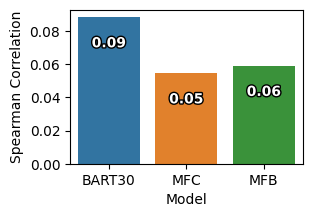

In [180]:
# Plot the correlation in a barplot
plt.figure(figsize=(3, 2))

sns.barplot(data=mean_correlations_df, x='Model', y='Spearman Correlation', hue='Model', palette='tab10', legend=False)

# Annotate the values on the plot
for i, value in enumerate(mean_correlations_df['Spearman Correlation']):
    # add color and stroke to text
    plt.text(i, value - 0.02, f'{value:.2f}', ha='center', va='bottom', color='white', fontsize=10, fontweight='bold', path_effects=[pe.withStroke(linewidth=2, foreground='black')])

# plt.title('Mean Expression x Model Accuracies Correlation\n', fontsize=20)
# plt.xlabel('Model', fontsize=12)
plt.ylabel('Spearman Correlation')

# Save the plot to svg file
plt.savefig('model_accuracies_vs_mean_category_tissue_expression_correlation.svg', format='svg', bbox_inches='tight')

plt.show()


### Accuracy vs. Mean Tissue Expression

#### Normalized Testset Fraction

In [153]:
# Drop rows with NaN values in 'median_float'
temp_df = test_with_results.dropna(subset=['median_float']).copy()

# normalize 'normalized_test_float_vectors' by dividing by the sum of each row
normalized_normalized_test_float_vectors = normalized_test_float_vectors / np.array(test_total_reads)

# Convert normalized 'median_float' tuples into separate columns
median_float_df = pd.DataFrame(normalized_normalized_test_float_vectors, columns=tissueSiteDetailId, index=test_median_float_indices)

# Concatenate the new columns with the original DataFrame
temp_df = pd.concat([temp_df, median_float_df], axis=1)

In [154]:
# For each tissue expression column in tissueSiteDetailId, calculate the average accuracy for each model and expression value
average_accuracies = {}

for tissue in tissueSiteDetailId:
    average_accuracies[tissue] = {
        'bart30_accuracy': temp_df.groupby(tissue)['bart30_accuracy'].mean(),
        'bart30_ablation_accuracy': temp_df.groupby(tissue)['bart30_ablation_accuracy'].mean(),
        'mfc_accuracy': temp_df.groupby(tissue)['mfc_accuracy'].mean(),
        'mfb_accuracy': temp_df.groupby(tissue)['mfb_accuracy'].mean()
    }

# Create a DataFrame from the average accuracies dictionary
average_accuracies_df = pd.DataFrame(average_accuracies)

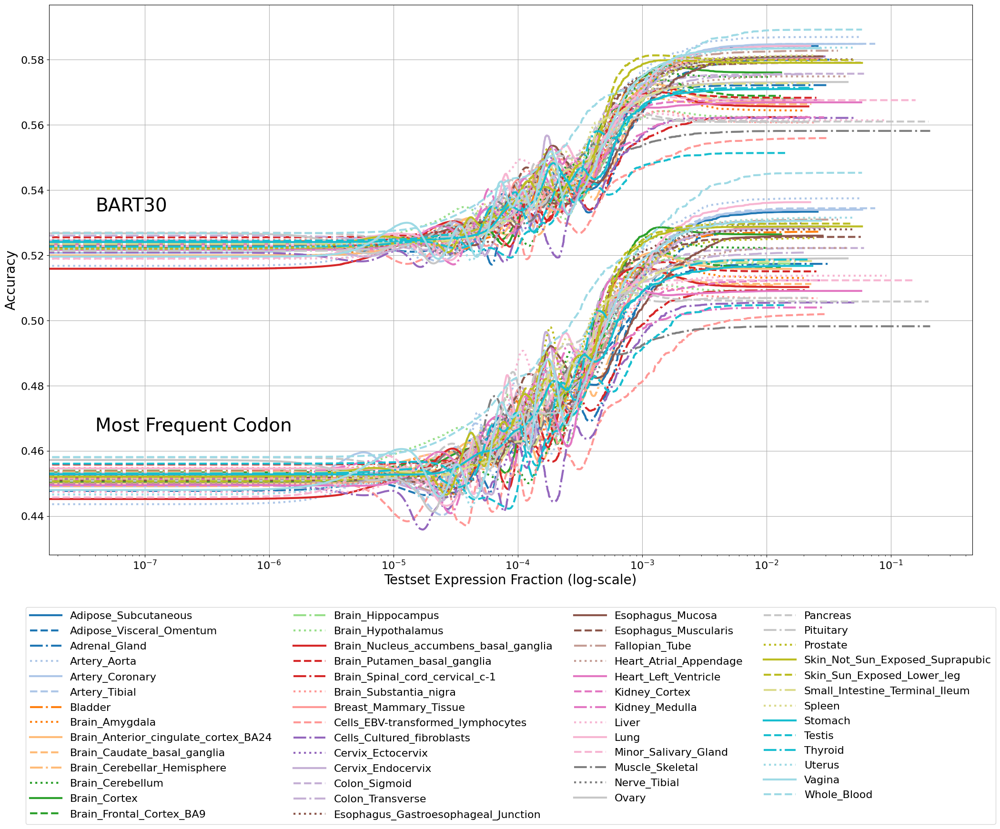

In [ ]:
# Plot the graph for the exploded values with Gaussian smoothing
plt.figure(figsize=(25, 15))
sgma = 70  # Standard deviation for Gaussian kernel

# Get a colormap with a sufficient number of unique colors
cmap = plt.get_cmap('tab20', len(tissueSiteDetailId))

# Line styles
line_styles = ['solid', 'dashed', 'dashdot', 'dotted']

for idx, tissue in enumerate(tissueSiteDetailId):
    subset = average_accuracies_df[tissue]
    smoothed_mfc_accuracy = gaussian_filter1d(subset.loc['mfc_accuracy'], sigma=sgma)
    smoothed_bart30_accuracy = gaussian_filter1d(subset.loc['bart30_accuracy'], sigma=sgma)
    line_style = line_styles[idx % len(line_styles)]

    plt.plot(subset['bart30_accuracy'].index, smoothed_bart30_accuracy, alpha=1, label=tissue, color=cmap(idx), linestyle=line_style, linewidth=3)
    plt.plot(subset['mfc_accuracy'].index, smoothed_mfc_accuracy, alpha=1, color=cmap(idx), linestyle=line_style, linewidth=3)

plt.text(0.05, 0.65, 'BART30', transform=plt.gca().transAxes, fontsize=28, verticalalignment='top', bbox=None)
plt.text(0.05, 0.25, 'Most Frequent Codon', transform=plt.gca().transAxes, fontsize=28, verticalalignment='top', bbox=None)

plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.5), ncol=4, handlelength=3, fontsize=16)
# plt.title(f'Accuracy vs. Log-Scale Expression Values per Tissue Site with Gaussian Smoothing (σ={sgma})', fontsize=24)
plt.xlabel('Testset Expression Fraction (log-scale)', fontsize=20)
plt.xticks(fontsize=16)
plt.xscale('log')
plt.ylabel('Accuracy', fontsize=20)
plt.yticks(fontsize=16)
plt.grid(True)

plt.savefig('model_accuracies_per_testset_tissue_expression_fraction.svg', format='svg', bbox_inches='tight')

plt.show()

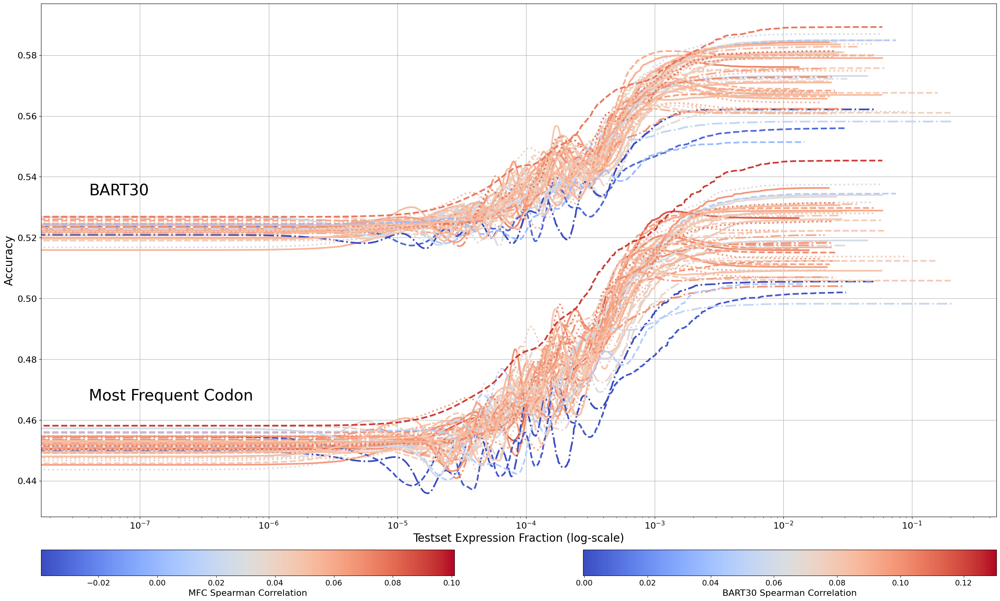

In [198]:
fig = plt.figure(figsize=(25, 15), constrained_layout=True)

gs = fig.add_gridspec(2, 3, height_ratios=[1, 0.05], width_ratios=[1, 0.2, 1])

ax = fig.add_subplot(gs[0, :])

# -------------------------------

sgma = 70  # Standard deviation for Gaussian kernel

# Get a non-diverging colormap to color lines with correlations
cmap_names = ['viridis', 'plasma', 'inferno', 'magma', 'cividis', 'twilight', 'twilight_shifted', 'turbo', 'nipy_spectral', 'gist_ncar', 'gist_rainbow', 'hsv', 'tab10', 'tab20', 'tab20b', 'tab20c']
cmap = plt.get_cmap('coolwarm')

# Line styles
line_styles = ['solid', 'dashed', 'dashdot', 'dotted']

# Create ScalarMappable objects for colorbars
norm_bart30 = mcolors.Normalize(vmin=correlations_df.loc['bart30_accuracy'].min(), vmax=correlations_df.loc['bart30_accuracy'].max())
norm_mfc = mcolors.Normalize(vmin=correlations_df.loc['mfc_accuracy'].min(), vmax=correlations_df.loc['mfc_accuracy'].max())
sm_bart30 = cm.ScalarMappable(cmap=cmap, norm=norm_bart30)
sm_mfc = cm.ScalarMappable(cmap=cmap, norm=norm_mfc)

for idx, tissue in enumerate(tissueSiteDetailId):
    subset = average_accuracies_df[tissue]
    smoothed_mfc_accuracy = gaussian_filter1d(subset.loc['mfc_accuracy'], sigma=sgma)
    smoothed_bart30_accuracy = gaussian_filter1d(subset.loc['bart30_accuracy'], sigma=sgma)
    line_style = line_styles[idx % len(line_styles)]

    ax.plot(subset['bart30_accuracy'].index, smoothed_bart30_accuracy, alpha=1, linestyle=line_style, linewidth=3,
             color=cmap(norm_bart30(correlations_df.loc['bart30_accuracy', tissue])))
    ax.plot(subset['mfc_accuracy'].index, smoothed_mfc_accuracy, alpha=1, linestyle=line_style, linewidth=3,
             color=cmap(norm_mfc(correlations_df.loc['mfc_accuracy', tissue])))

ax.text(0.05, 0.65, 'BART30', transform=plt.gca().transAxes, fontsize=28, verticalalignment='top', bbox=None)
ax.text(0.05, 0.25, 'Most Frequent Codon', transform=plt.gca().transAxes, fontsize=28, verticalalignment='top', bbox=None)

ax.set_xlabel('Testset Expression Fraction (log-scale)', fontsize=20)
ax.tick_params(axis='x', labelsize=16)
ax.set_xscale('log')
ax.set_ylabel('Accuracy', fontsize=20)
ax.tick_params(axis='y', labelsize=16)
ax.grid(True)

# -------------------------------

cax1 = fig.add_subplot(gs[1, 0])
cbar_mfc = fig.colorbar(sm_mfc, cax=cax1, orientation='horizontal')
cbar_mfc.set_label('MFC Spearman Correlation', fontsize=16)
cbar_mfc.ax.tick_params(labelsize=14)

cax2 = fig.add_subplot(gs[1, -1])
cbar_bart30 = fig.colorbar(sm_bart30, cax=cax2, orientation='horizontal')
cbar_bart30.set_label('BART30 Spearman Correlation', fontsize=16)
cbar_bart30.ax.tick_params(labelsize=14)

plt.savefig('model_accuracies_per_testset_tissue_expression_fraction_with_correlation.svg', format='svg', bbox_inches='tight')

plt.show()

#### Log STD

**Center and Standardize Median Float Values, Replace Median Percentile Strings with Integers.**

In [51]:
# Drop rows with NaN values in 'median_float'
temp_df = test_with_results.dropna(subset=['median_float']).copy()

# Convert normalized 'median_float' tuples into separate columns
median_float_df = pd.DataFrame(normalized_test_float_vectors, columns=tissueSiteDetailId, index=test_median_float_indices)
mean_values = median_float_df.mean()
std_values = median_float_df.std()

# Center and Standardize the median_float values
median_float_df = (median_float_df -
                   mean_values) / std_values

# Concatenate the new columns with the original DataFrame
temp_df = pd.concat([temp_df, median_float_df], axis=1)

In [52]:
# For each tissue expression column in tissueSiteDetailId, calculate the average accuracy for each model and expression value
average_accuracies = {}

for tissue in tissueSiteDetailId:
    average_accuracies[tissue] = {
        'bart30_accuracy': temp_df.groupby(tissue)['bart30_accuracy'].mean(),
        'mfc_accuracy': temp_df.groupby(tissue)['mfc_accuracy'].mean(),
        'mfb_accuracy': temp_df.groupby(tissue)['mfb_accuracy'].mean()
    }

# Create a DataFrame from the average accuracies dictionary
average_accuracies_df = pd.DataFrame(average_accuracies)

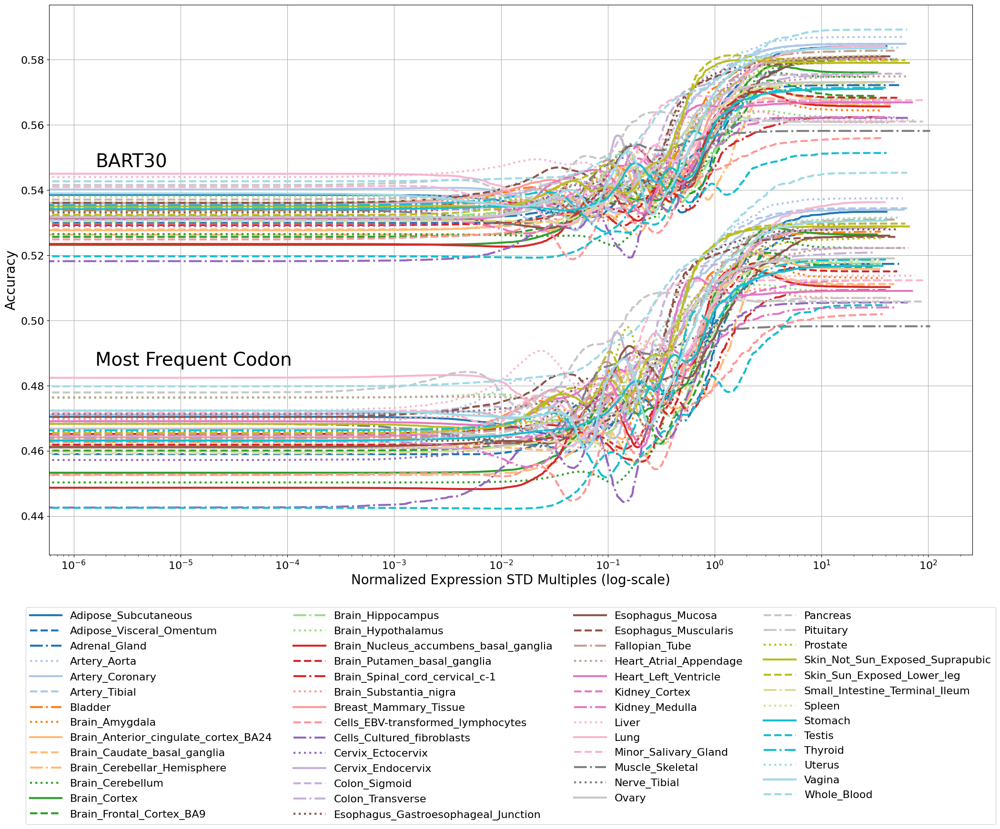

In [41]:
# Plot the graph for the exploded values with Gaussian smoothing
plt.figure(figsize=(25, 15))
sgma = 70  # Standard deviation for Gaussian kernel

# Get a colormap with a sufficient number of unique colors
cmap = plt.get_cmap('tab20', len(tissueSiteDetailId))

# Line styles
line_styles = ['solid', 'dashed', 'dashdot', 'dotted']

for idx, tissue in enumerate(tissueSiteDetailId):
    subset = average_accuracies_df[tissue]
    smoothed_mfc_accuracy = gaussian_filter1d(subset.loc['mfc_accuracy'], sigma=sgma)
    smoothed_bart30_accuracy = gaussian_filter1d(subset.loc['bart30_accuracy'], sigma=sgma)
    line_style = line_styles[idx % len(line_styles)]

    plt.plot(subset['bart30_accuracy'].index, smoothed_bart30_accuracy, alpha=1, label=tissue, color=cmap(idx), linestyle=line_style, linewidth=3)
    plt.plot(subset['mfc_accuracy'].index, smoothed_mfc_accuracy, alpha=1, color=cmap(idx), linestyle=line_style, linewidth=3)

plt.text(0.05, 0.73, 'BART30', transform=plt.gca().transAxes, fontsize=28, verticalalignment='top', bbox=None)
plt.text(0.05, 0.37, 'Most Frequent Codon', transform=plt.gca().transAxes, fontsize=28, verticalalignment='top', bbox=None)

plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.5), ncol=4, handlelength=3, fontsize=16)
# plt.title(f'Accuracy vs. Log-Scale Expression Values per Tissue Site with Gaussian Smoothing (σ={sgma})', fontsize=24)
plt.xlabel('Normalized Expression STD Multiples (log-scale)', fontsize=20)
plt.xticks(fontsize=16)
plt.xscale('log')
plt.ylabel('Accuracy', fontsize=20)
plt.yticks(fontsize=16)
plt.grid(True)

plt.savefig('model_accuracies_per_tissue_expression_std.svg', format='svg', bbox_inches='tight')

plt.show()

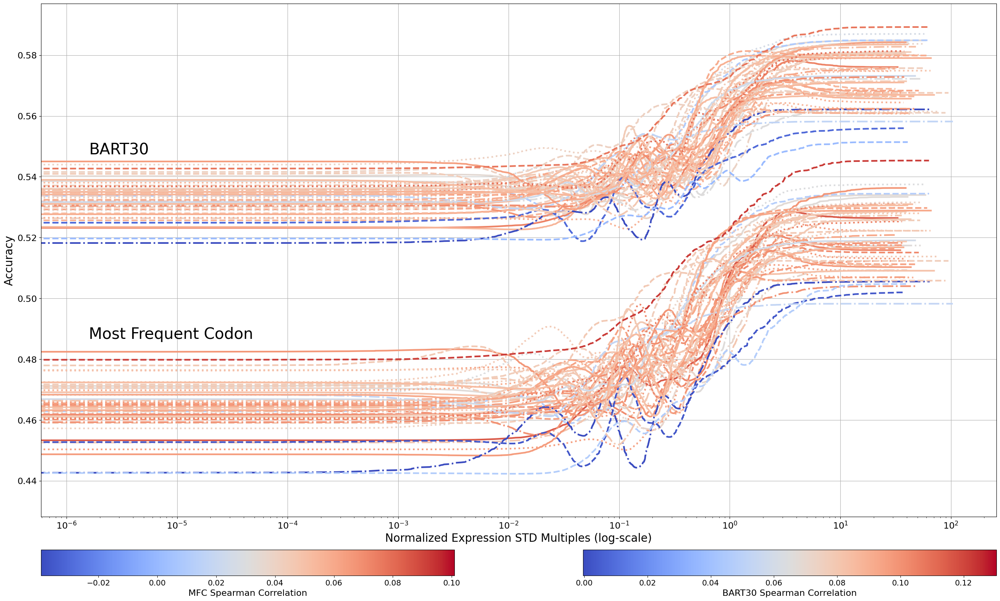

In [53]:
fig = plt.figure(figsize=(25, 15), constrained_layout=True)

gs = fig.add_gridspec(2, 3, height_ratios=[1, 0.05], width_ratios=[1, 0.2, 1])

ax = fig.add_subplot(gs[0, :])

# -------------------------------

sgma = 70  # Standard deviation for Gaussian kernel

# Get a non-diverging colormap to color lines with correlations
cmap_names = ['viridis', 'plasma', 'inferno', 'magma', 'cividis', 'twilight', 'twilight_shifted', 'turbo', 'nipy_spectral', 'gist_ncar', 'gist_rainbow', 'hsv', 'tab10', 'tab20', 'tab20b', 'tab20c']
cmap = plt.get_cmap('coolwarm')

# Line styles
line_styles = ['solid', 'dashed', 'dashdot', 'dotted']

# Create ScalarMappable objects for colorbars
norm_bart30 = mcolors.Normalize(vmin=correlations_df.loc['bart30_accuracy'].min(), vmax=correlations_df.loc['bart30_accuracy'].max())
norm_mfc = mcolors.Normalize(vmin=correlations_df.loc['mfc_accuracy'].min(), vmax=correlations_df.loc['mfc_accuracy'].max())
sm_bart30 = cm.ScalarMappable(cmap=cmap, norm=norm_bart30)
sm_mfc = cm.ScalarMappable(cmap=cmap, norm=norm_mfc)

for idx, tissue in enumerate(tissueSiteDetailId):
    subset = average_accuracies_df[tissue]
    smoothed_mfc_accuracy = gaussian_filter1d(subset.loc['mfc_accuracy'], sigma=sgma)
    smoothed_bart30_accuracy = gaussian_filter1d(subset.loc['bart30_accuracy'], sigma=sgma)
    line_style = line_styles[idx % len(line_styles)]

    ax.plot(subset['bart30_accuracy'].index, smoothed_bart30_accuracy, alpha=1, linestyle=line_style, linewidth=3,
             color=cmap(norm_bart30(correlations_df.loc['bart30_accuracy', tissue])))
    ax.plot(subset['mfc_accuracy'].index, smoothed_mfc_accuracy, alpha=1, linestyle=line_style, linewidth=3,
             color=cmap(norm_mfc(correlations_df.loc['mfc_accuracy', tissue])))

ax.text(0.05, 0.73, 'BART30', transform=plt.gca().transAxes, fontsize=28, verticalalignment='top', bbox=None)
ax.text(0.05, 0.37, 'Most Frequent Codon', transform=plt.gca().transAxes, fontsize=28, verticalalignment='top', bbox=None)

ax.set_xlabel('Normalized Expression STD Multiples (log-scale)', fontsize=20)
ax.tick_params(axis='x', labelsize=16)
ax.set_xscale('log')
ax.set_ylabel('Accuracy', fontsize=20)
ax.tick_params(axis='y', labelsize=16)
ax.grid(True)

# -------------------------------

cax1 = fig.add_subplot(gs[1, 0])
cbar_mfc = fig.colorbar(sm_mfc, cax=cax1, orientation='horizontal')
cbar_mfc.set_label('MFC Spearman Correlation', fontsize=16)
cbar_mfc.ax.tick_params(labelsize=14)

cax2 = fig.add_subplot(gs[1, -1])
cbar_bart30 = fig.colorbar(sm_bart30, cax=cax2, orientation='horizontal')
cbar_bart30.set_label('BART30 Spearman Correlation', fontsize=16)
cbar_bart30.ax.tick_params(labelsize=14)

plt.savefig('model_accuracies_per_tissue_expression_std_with_correlation.svg', format='svg', bbox_inches='tight')

plt.show()

#### Categorical

In [132]:
# Drop rows with NaN values in 'median_float'
temp_df = test_with_results.dropna(subset=['median']).copy()
temp_df = temp_df  # TODO: For testing purposes

# Replace 'median' string values with their index integer values
expr_labels = ['expr_low25', 'expr_pre25_50', 'expr_pre50_75', 'expr_pre75_90', 'expr_top10']
temp_df.loc[:, 'median'] = temp_df['median'].apply(lambda x: [expr_labels.index(v) for v in x] if isinstance(x, tuple) else x)

# Convert normalized 'median_float' tuples into separate columns
median_int_df = pd.DataFrame(temp_df['median'].tolist(), columns=tissueSiteDetailId, index=temp_df.index)
median_int_df = median_int_df # TODO: For testing purposes

# Concatenate the new columns with the original DataFrame
temp_df = pd.concat([temp_df, median_int_df], axis=1)

In [133]:
# For each tissue expression column in tissueSiteDetailId, calculate the average accuracy for each model and expression value
average_accuracies = {}

for tissue in tissueSiteDetailId:  # TODO: For testing purposes
    average_accuracies[tissue] = {
        'bart30_accuracy': temp_df.groupby(tissue)['bart30_accuracy'].mean(),
        'mfc_accuracy': temp_df.groupby(tissue)['mfc_accuracy'].mean(),
        'mfb_accuracy': temp_df.groupby(tissue)['mfb_accuracy'].mean()
    }

# Create a DataFrame from the average accuracies dictionary
average_accuracies_df = pd.DataFrame(average_accuracies)

In [114]:
average_accuracies_df_mean = average_accuracies_df.map(lambda x: x.mean() if isinstance(x, pd.Series) else x)

In [101]:
average_accuracies_df_mean

,Adipose_Subcutaneous,Adipose_Visceral_Omentum
bart30_accuracy,0.528049,0.528074
mfc_accuracy,0.459339,0.459923
mfb_accuracy,0.457464,0.458046


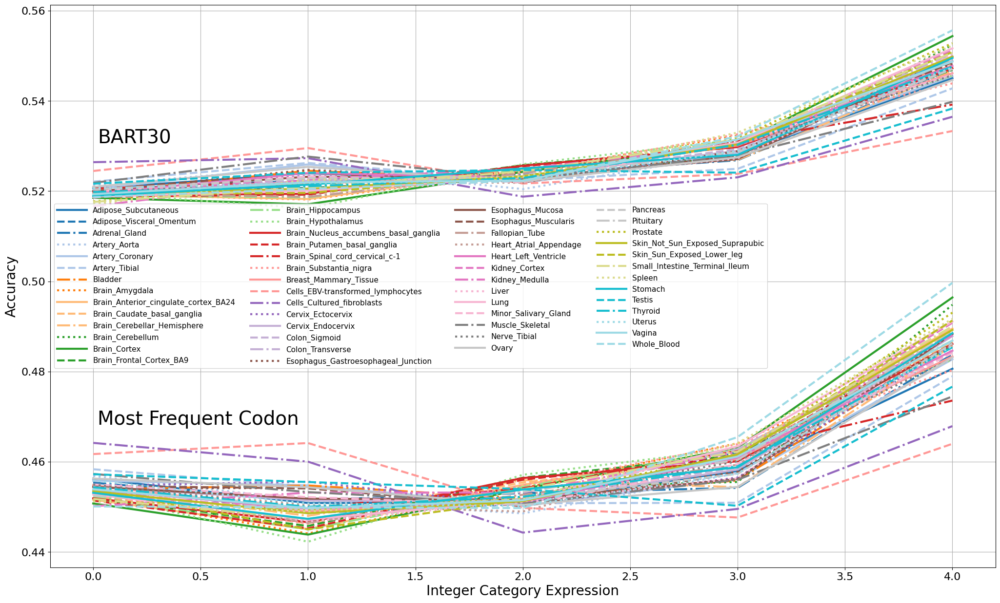

In [135]:
# Plot the graph for the exploded values with Gaussian smoothing
plt.figure(figsize=(25, 15))

# Get a colormap with a sufficient number of unique colors
cmap = plt.get_cmap('tab20', len(tissueSiteDetailId))  # TODO: For testing purposes

# Line styles
line_styles = ['solid', 'dashed', 'dashdot', 'dotted']

for idx, tissue in enumerate(tissueSiteDetailId):  # TODO: For testing purposes
    subset = average_accuracies_df[tissue]
    line_style = line_styles[idx % len(line_styles)]

    plt.plot(subset['bart30_accuracy'].index, subset['bart30_accuracy'], alpha=1, label=tissue, color=cmap(idx), linestyle=line_style, linewidth=3)
    plt.plot(subset['mfc_accuracy'].index, subset['mfc_accuracy'], alpha=1, color=cmap(idx), linestyle=line_style, linewidth=3)
    # add mean accuracy horizontal line
    # plt.axhline(y=subset['bart30_accuracy'].mean(), color=cmap(idx), linestyle='--', linewidth=1, alpha=1)
    # plt.axhline(y=subset['mfc_accuracy'].mean(), color=cmap(idx), linestyle='--', linewidth=1, alpha=1)

plt.text(0.05, 0.78, 'BART30', transform=plt.gca().transAxes, fontsize=28, verticalalignment='top', bbox=None)
plt.text(0.05, 0.28, 'Most Frequent Codon', transform=plt.gca().transAxes, fontsize=28, verticalalignment='top', bbox=None)

plt.legend(loc='best', ncol=4, handlelength=4, fontsize=11)
# plt.title(f'Accuracy vs. Log-Scale Expression Values per Tissue Site with Gaussian Smoothing (σ={sgma})', fontsize=24)
plt.xlabel('Integer Category Expression', fontsize=20)
plt.xticks(fontsize=16)
# plt.xscale('log')
plt.ylabel('Accuracy', fontsize=20)
plt.yticks(fontsize=16)
plt.grid(True)

plt.savefig('model_accuracies_per_categorical_tissue_expression.svg', format='svg', bbox_inches='tight')

plt.show()

In [125]:
# count the number of unique values in each column of median_int_df
unique_counts = median_int_df.value_counts()

In [130]:
median_int_df['Whole_Blood'].value_counts()

Whole_Blood
0    6394
2    2991
3    1860
4    1169
Name: count, dtype: int64

In [136]:
median_int_df['Vagina'].value_counts()

Vagina
0    4635
2    3126
3    1859
1    1607
4    1187
Name: count, dtype: int64

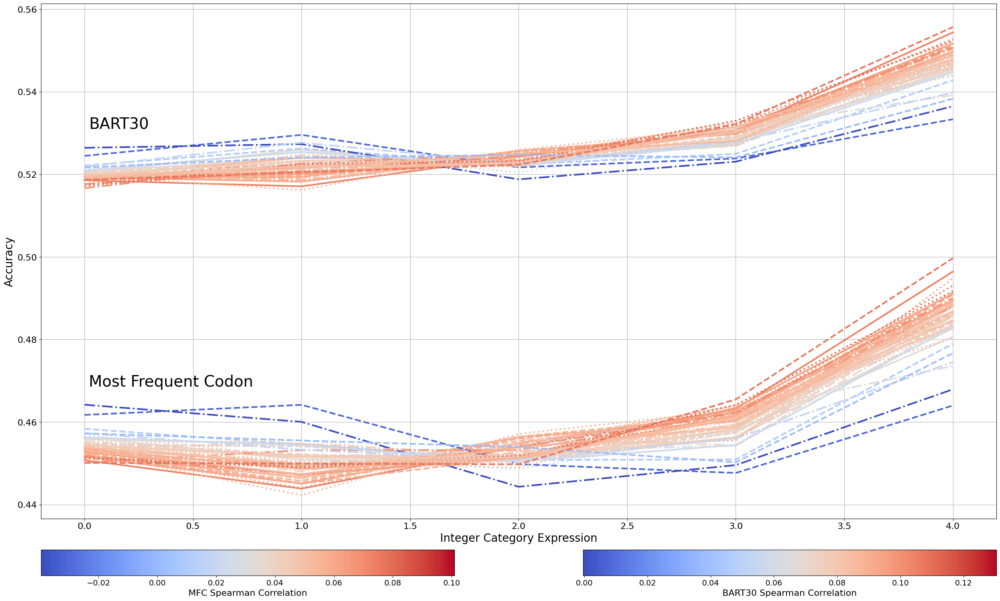

In [180]:
fig = plt.figure(figsize=(25, 15), constrained_layout=True)

gs = fig.add_gridspec(2, 3, height_ratios=[1, 0.05], width_ratios=[1, 0.2, 1])

ax = fig.add_subplot(gs[0, :])

# -------------------------------

cmap = plt.get_cmap('coolwarm')

# Line styles
line_styles = ['solid', 'dashed', 'dashdot', 'dotted']

# Create ScalarMappable objects for colorbars
norm_bart30 = mcolors.Normalize(vmin=correlations_df.loc['bart30_accuracy'].min(), vmax=correlations_df.loc['bart30_accuracy'].max())
norm_mfc = mcolors.Normalize(vmin=correlations_df.loc['mfc_accuracy'].min(), vmax=correlations_df.loc['mfc_accuracy'].max())
sm_bart30 = cm.ScalarMappable(cmap=cmap, norm=norm_bart30)
sm_mfc = cm.ScalarMappable(cmap=cmap, norm=norm_mfc)

for idx, tissue in enumerate(tissueSiteDetailId):
    subset = average_accuracies_df[tissue]
    line_style = line_styles[idx % len(line_styles)]

    plt.plot(subset['bart30_accuracy'].index, subset['bart30_accuracy'], alpha=1, linestyle=line_style, linewidth=3,
             color=cmap(norm_bart30(correlations_df.loc['bart30_accuracy', tissue])))
    plt.plot(subset['mfc_accuracy'].index, subset['mfc_accuracy'], alpha=1, linestyle=line_style, linewidth=3,
             color=cmap(norm_bart30(correlations_df.loc['bart30_accuracy', tissue])))

plt.text(0.05, 0.78, 'BART30', transform=plt.gca().transAxes, fontsize=28, verticalalignment='top', bbox=None)
plt.text(0.05, 0.28, 'Most Frequent Codon', transform=plt.gca().transAxes, fontsize=28, verticalalignment='top', bbox=None)

# plt.title(f'Accuracy vs. Log-Scale Expression Values per Tissue Site with Gaussian Smoothing (σ={sgma})', fontsize=24)
plt.xlabel('Integer Category Expression', fontsize=20)
plt.xticks(fontsize=16)
# plt.xscale('log')
plt.ylabel('Accuracy', fontsize=20)
plt.yticks(fontsize=16)
plt.grid(True)

# -------------------------------

cax1 = fig.add_subplot(gs[1, 0])
cbar_mfc = fig.colorbar(sm_mfc, cax=cax1, orientation='horizontal')
cbar_mfc.set_label('MFC Spearman Correlation', fontsize=16)
cbar_mfc.ax.tick_params(labelsize=14)

cax2 = fig.add_subplot(gs[1, -1])
cbar_bart30 = fig.colorbar(sm_bart30, cax=cax2, orientation='horizontal')
cbar_bart30.set_label('BART30 Spearman Correlation', fontsize=16)
cbar_bart30.ax.tick_params(labelsize=14)

plt.savefig('model_accuracies_per_category_tissue_expression_with_correlation.svg', format='svg', bbox_inches='tight')

plt.show()

#### Ranked

In [54]:
# Drop rows with NaN values in 'median_float'
temp_df = test_with_results.dropna(subset=['median_float']).copy()

# Convert normalized 'median_float' tuples into separate columns
median_float_df = pd.DataFrame(normalized_test_float_vectors, columns=tissueSiteDetailId, index=test_median_float_indices)

# Convert the median_float values to percentiles
median_float_df = median_float_df.rank(pct=True)

# Concatenate the new columns with the original DataFrame
temp_df = pd.concat([temp_df, median_float_df], axis=1)

In [55]:
# For each tissue expression column in tissueSiteDetailId, calculate the average accuracy for each model and expression value
average_accuracies = {}

for tissue in tissueSiteDetailId:
    average_accuracies[tissue] = {
        'bart30_accuracy': temp_df.groupby(tissue)['bart30_accuracy'].mean(),
        'mfc_accuracy': temp_df.groupby(tissue)['mfc_accuracy'].mean(),
        'mfb_accuracy': temp_df.groupby(tissue)['mfb_accuracy'].mean()
    }

# Create a DataFrame from the average accuracies dictionary
average_accuracies_df = pd.DataFrame(average_accuracies)

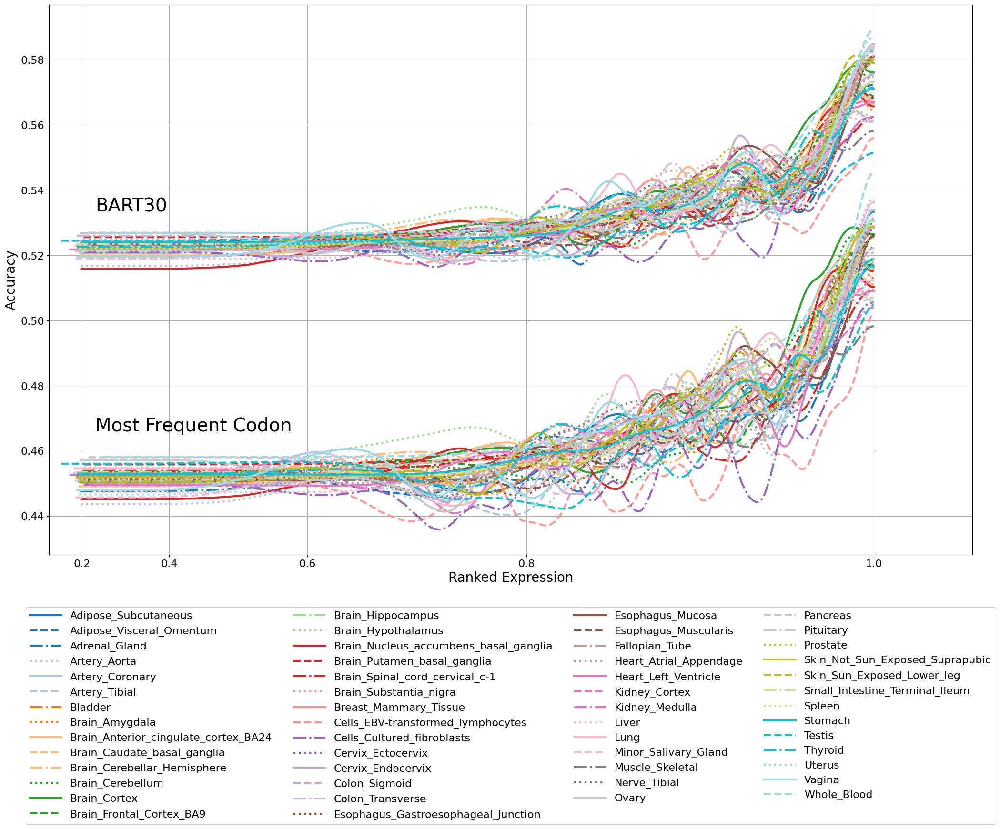

In [57]:
# Plot the graph for the exploded values with Gaussian smoothing
plt.figure(figsize=(25, 15))
sgma = 70  # Standard deviation for Gaussian kernel

# Get a colormap with a sufficient number of unique colors
cmap = plt.get_cmap('tab20', len(tissueSiteDetailId))

# Line styles
line_styles = ['solid', 'dashed', 'dashdot', 'dotted']

for idx, tissue in enumerate(tissueSiteDetailId):
    subset = average_accuracies_df[tissue]
    smoothed_mfc_accuracy = gaussian_filter1d(subset.loc['mfc_accuracy'], sigma=sgma)
    smoothed_bart30_accuracy = gaussian_filter1d(subset.loc['bart30_accuracy'], sigma=sgma)
    line_style = line_styles[idx % len(line_styles)]

    plt.plot(subset['bart30_accuracy'].index, smoothed_bart30_accuracy, alpha=1, label=tissue, color=cmap(idx), linestyle=line_style, linewidth=3)
    plt.plot(subset['mfc_accuracy'].index, smoothed_mfc_accuracy, alpha=1, color=cmap(idx), linestyle=line_style, linewidth=3)

plt.text(0.05, 0.65, 'BART30', transform=plt.gca().transAxes, fontsize=28, verticalalignment='top', bbox=None)
plt.text(0.05, 0.25, 'Most Frequent Codon', transform=plt.gca().transAxes, fontsize=28, verticalalignment='top', bbox=None)

plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.5), ncol=4, handlelength=3, fontsize=16)
# plt.title(f'Accuracy vs. Log-Scale Expression Values per Tissue Site with Gaussian Smoothing (σ={sgma})', fontsize=24)
plt.xlabel('Ranked Expression', fontsize=20)
plt.xticks(fontsize=16)
plt.xscale('linear')
plt.xscale('function', functions=(lambda x: 10**x, np.log10))
plt.ylabel('Accuracy', fontsize=20)
plt.yticks(fontsize=16)
plt.grid(True)

plt.savefig('model_accuracies_per_ranked_tissue_expression.svg', format='svg', bbox_inches='tight')

plt.show()

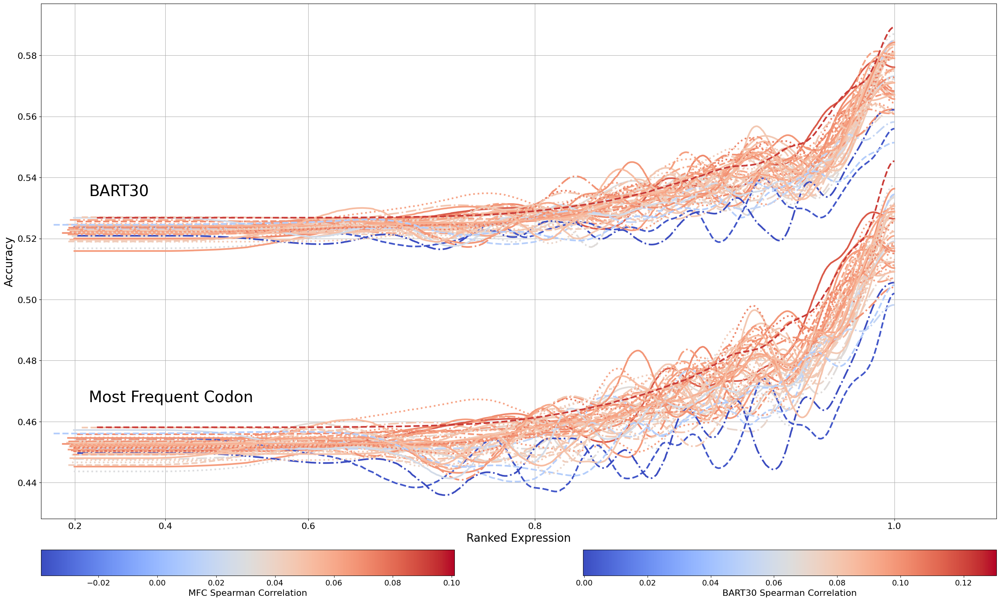

In [50]:
fig = plt.figure(figsize=(25, 15), constrained_layout=True)

gs = fig.add_gridspec(2, 3, height_ratios=[1, 0.05], width_ratios=[1, 0.2, 1])

ax = fig.add_subplot(gs[0, :])

# -------------------------------

sgma = 70  # Standard deviation for Gaussian kernel

# Get a non-diverging colormap to color lines with correlations
# cmap_names = ['viridis', 'plasma', 'inferno', 'magma', 'cividis', 'twilight', 'twilight_shifted', 'turbo', 'nipy_spectral', 'gist_ncar', 'gist_rainbow', 'hsv', 'tab10', 'tab20', 'tab20b', 'tab20c']
cmap = plt.get_cmap('coolwarm')

# Line styles
line_styles = ['solid', 'dashed', 'dashdot', 'dotted']

# Create ScalarMappable objects for colorbars
norm_bart30 = mcolors.Normalize(vmin=correlations_df.loc['bart30_accuracy'].min(), vmax=correlations_df.loc['bart30_accuracy'].max())
norm_mfc = mcolors.Normalize(vmin=correlations_df.loc['mfc_accuracy'].min(), vmax=correlations_df.loc['mfc_accuracy'].max())
sm_bart30 = cm.ScalarMappable(cmap=cmap, norm=norm_bart30)
sm_mfc = cm.ScalarMappable(cmap=cmap, norm=norm_mfc)

for idx, tissue in enumerate(tissueSiteDetailId):
    subset = average_accuracies_df[tissue]
    smoothed_mfc_accuracy = gaussian_filter1d(subset.loc['mfc_accuracy'], sigma=sgma)
    smoothed_bart30_accuracy = gaussian_filter1d(subset.loc['bart30_accuracy'], sigma=sgma)
    line_style = line_styles[idx % len(line_styles)]

    plt.plot(subset['bart30_accuracy'].index, smoothed_bart30_accuracy, alpha=1, linestyle=line_style, linewidth=3,
             color=cmap(norm_mfc(correlations_df.loc['mfc_accuracy', tissue])))
    plt.plot(subset['mfc_accuracy'].index, smoothed_mfc_accuracy, alpha=1, linestyle=line_style, linewidth=3,
             color=cmap(norm_mfc(correlations_df.loc['mfc_accuracy', tissue])))

plt.text(0.05, 0.65, 'BART30', transform=plt.gca().transAxes, fontsize=28, verticalalignment='top', bbox=None)
plt.text(0.05, 0.25, 'Most Frequent Codon', transform=plt.gca().transAxes, fontsize=28, verticalalignment='top', bbox=None)

# plt.title(f'Accuracy vs. Log-Scale Expression Values per Tissue Site with Gaussian Smoothing (σ={sgma})', fontsize=24)
plt.xlabel('Ranked Expression', fontsize=20)
plt.xticks(fontsize=16)
plt.xscale('linear')
plt.xscale('function', functions=(lambda x: 10**x, np.log10))
plt.ylabel('Accuracy', fontsize=20)
plt.yticks(fontsize=16)
plt.grid(True)

# -------------------------------

cax1 = fig.add_subplot(gs[1, 0])
cbar_mfc = fig.colorbar(sm_mfc, cax=cax1, orientation='horizontal')
cbar_mfc.set_label('MFC Spearman Correlation', fontsize=16)
cbar_mfc.ax.tick_params(labelsize=14)

cax2 = fig.add_subplot(gs[1, -1])
cbar_bart30 = fig.colorbar(sm_bart30, cax=cax2, orientation='horizontal')
cbar_bart30.set_label('BART30 Spearman Correlation', fontsize=16)
cbar_bart30.ax.tick_params(labelsize=14)

plt.savefig('model_accuracies_per_ranked_tissue_expression_with_correlation.svg', format='svg', bbox_inches='tight')

plt.show()

#### Subtract Models

In [161]:
# Drop rows with NaN values in 'median_float'
temp_df = test_with_results.dropna(subset=['median_float']).copy()

# Convert normalized 'median_float' tuples into separate columns
median_float_df = pd.DataFrame(normalized_normalized_test_float_vectors, columns=tissueSiteDetailId, index=test_median_float_indices)

# Concatenate the new columns with the original DataFrame
temp_df = pd.concat([temp_df, median_float_df], axis=1)

temp_df['bart30 - mfc'] = temp_df['bart30_accuracy'] - temp_df['mfc_accuracy']
temp_df['bart30 - bart30_ablation'] = temp_df['bart30_accuracy'] - temp_df['bart30_ablation_accuracy']

In [162]:
# For each tissue expression column in tissueSiteDetailId, calculate the average accuracy for each model and expression value
average_accuracies = {}

for tissue in tissueSiteDetailId:
    average_accuracies[tissue] = {
        'bart30 - mfc': temp_df.groupby(tissue)['bart30 - mfc'].mean(),
        'bart30 - bart30_ablation': temp_df.groupby(tissue)['bart30 - bart30_ablation'].mean()
    }

# Create a DataFrame from the average accuracies dictionary
average_accuracies_df = pd.DataFrame(average_accuracies)

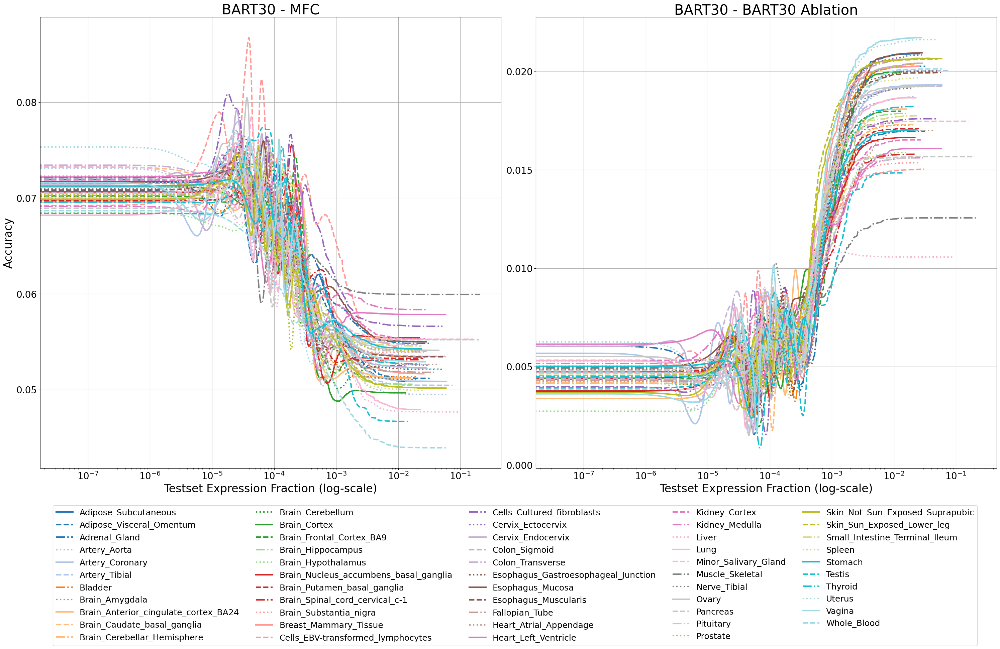

In [189]:
# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(30, 15))

sgma = 70  # Standard deviation for Gaussian kernel

# Get a colormap with a sufficient number of unique colors
cmap = plt.get_cmap('tab20', len(tissueSiteDetailId))

# Line styles
line_styles = ['solid', 'dashed', 'dashdot', 'dotted']

# Plot for 'bart30 - mfc'
for idx, tissue in enumerate(tissueSiteDetailId):
    subset = average_accuracies_df[tissue]
    smoothed_bart30_minus_mfc_accuracy = gaussian_filter1d(subset.loc['bart30 - mfc'], sigma=sgma)
    line_style = line_styles[idx % len(line_styles)]

    axes[0].plot(subset['bart30 - mfc'].index, smoothed_bart30_minus_mfc_accuracy, alpha=1, label=tissue, color=cmap(idx), linestyle=line_style, linewidth=3)

axes[0].set_xlabel('Testset Expression Fraction (log-scale)', fontsize=24)
axes[0].set_ylabel('Accuracy', fontsize=24)
axes[0].tick_params(axis='x', labelsize=20)
axes[0].tick_params(axis='y', labelsize=20)
axes[0].set_xscale('log')
axes[0].grid(True)
axes[0].set_title('BART30 - MFC', fontsize=30)

# Plot for 'bart30 - bart30_ablation'
for idx, tissue in enumerate(tissueSiteDetailId):
    subset = average_accuracies_df[tissue]
    smoothed_bart30_minus_bart30_ablation_accuracy = gaussian_filter1d(subset.loc['bart30 - bart30_ablation'], sigma=sgma)
    line_style = line_styles[idx % len(line_styles)]

    axes[1].plot(subset['bart30 - bart30_ablation'].index, smoothed_bart30_minus_bart30_ablation_accuracy, alpha=1, label=tissue, color=cmap(idx), linestyle=line_style, linewidth=3)

axes[1].set_xlabel('Testset Expression Fraction (log-scale)', fontsize=24)
# axes[1].set_ylabel('BART30 - BART30 Ablation Accuracy', fontsize=20)
axes[1].tick_params(axis='x', labelsize=20)
axes[1].tick_params(axis='y', labelsize=20)
axes[1].set_xscale('log')
axes[1].grid(True)
axes[1].set_title('BART30 - BART30 Ablation', fontsize=30)

# Add a shared legend below the two subplots
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.515, -0.3), ncol=5, fontsize=18)

plt.tight_layout()
plt.savefig('model_accuracy_differences_subplots.svg', format='svg', bbox_inches='tight')
plt.show()

## Accuracy on Canonical / Non-Canonical Genes

In [8]:
temp_data = pd.read_csv(os.path.join(whole_dataset_path, 'genes_human.csv'), delimiter='\t')[['transcript', 'canonical', 'coord_start', 'coord_end', 'exp_T', 'exp_HEK293', 'exp_U2OS', 'cARS_T', 'cARS_HEK293', 'cARS_U2OS']]
test_with_results = pd.read_pickle(os.path.join(results_path, '2_test_with_bart30.pkl'))

merged_data = pd.merge(test_with_results, temp_data, right_on='transcript', left_on='query_transcript', how='left')

test_with_results = merged_data

P-value for difference between means of BART30 model: 9.765599474527852e-46
P-value for difference between means of BART30 ablation model: 4.0103522142919655e-30
P-value for difference between means of MFC model: 4.248531575140447e-21
P-value for difference between means of MFB model: 5.091485075708966e-20


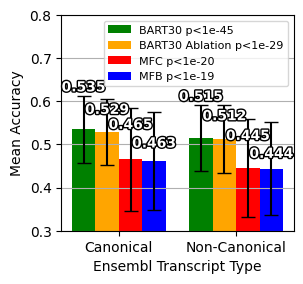

In [17]:
# Calculate mean accuracies for canonic and non-canonic rows
mean_accuracy_canonic_bart30 = test_with_results[test_with_results['canonical'] == True]['bart30_accuracy'].mean()
mean_accuracy_non_canonic_bart30 = test_with_results[test_with_results['canonical'] == False]['bart30_accuracy'].mean()

mean_accuracy_canonic_bart30_ablation = test_with_results[test_with_results['canonical'] == True]['bart30_ablation_accuracy'].mean()
mean_accuracy_non_canonic_bart30_ablation = test_with_results[test_with_results['canonical'] == False]['bart30_ablation_accuracy'].mean()

mean_accuracy_canonic_mfc = test_with_results[test_with_results['canonical'] == True]['mfc_accuracy'].mean()
mean_accuracy_non_canonic_mfc = test_with_results[test_with_results['canonical'] == False]['mfc_accuracy'].mean()

mean_accuracy_canonic_mfb = test_with_results[test_with_results['canonical'] == True]['mfb_accuracy'].mean()
mean_accuracy_non_canonic_mfb = test_with_results[test_with_results['canonical'] == False]['mfb_accuracy'].mean()

# Calculate standard deviations for canonic and non-canonic rows
std_accuracy_canonic_bart30 = test_with_results[test_with_results['canonical'] == True]['bart30_accuracy'].std()
std_accuracy_non_canonic_bart30 = test_with_results[test_with_results['canonical'] == False]['bart30_accuracy'].std()

std_accuracy_canonic_bart30_ablation = test_with_results[test_with_results['canonical'] == True]['bart30_ablation_accuracy'].std()
std_accuracy_non_canonic_bart30_ablation = test_with_results[test_with_results['canonical'] == False]['bart30_ablation_accuracy'].std()

std_accuracy_canonic_mfc = test_with_results[test_with_results['canonical'] == True]['mfc_accuracy'].std()
std_accuracy_non_canonic_mfc = test_with_results[test_with_results['canonical'] == False]['mfc_accuracy'].std()

std_accuracy_canonic_mfb = test_with_results[test_with_results['canonical'] == True]['mfb_accuracy'].std()
std_accuracy_non_canonic_mfb = test_with_results[test_with_results['canonical'] == False]['mfb_accuracy'].std()

# Perform t-test for BART30 model
canonic_bart30 = test_with_results[test_with_results['canonical'] == True]['bart30_accuracy']
non_canonic_bart30 = test_with_results[test_with_results['canonical'] == False]['bart30_accuracy']
bart30_t_stat, bart30_p_value = ttest_ind(canonic_bart30, non_canonic_bart30)

canonic_bart30_ablation = test_with_results[test_with_results['canonical'] == True]['bart30_ablation_accuracy']
non_canonic_bart30_ablation = test_with_results[test_with_results['canonical'] == False]['bart30_ablation_accuracy']
bart30_ablation_t_stat, bart30_ablation_p_value = ttest_ind(canonic_bart30_ablation, non_canonic_bart30_ablation)

canonic_mfc = test_with_results[test_with_results['canonical'] == True]['mfc_accuracy']
non_canonic_mfc = test_with_results[test_with_results['canonical'] == False]['mfc_accuracy']
mfc_t_stat, mfc_p_value = ttest_ind(canonic_mfc, non_canonic_mfc)

canonic_mfb = test_with_results[test_with_results['canonical'] == True]['mfb_accuracy']
non_canonic_mfb = test_with_results[test_with_results['canonical'] == False]['mfb_accuracy']
mfb_t_stat, mfb_p_value = ttest_ind(canonic_mfb, non_canonic_mfb)

print(f"P-value for difference between means of BART30 model: {bart30_p_value}")
print(f"P-value for difference between means of BART30 ablation model: {bart30_ablation_p_value}")
print(f"P-value for difference between means of MFC model: {mfc_p_value}")
print(f"P-value for difference between means of MFB model: {mfb_p_value}")

# Create a bar plot with error bars and hue based on the model
labels = ['Canonical', 'Non-Canonical']
x = np.arange(len(labels)) / 4  # the label locations
width = 0.05  # the width of the bars

fig, ax = plt.subplots(figsize=(3, 2.8))

# Plot for BART30 model
rects1 = ax.bar(x - 1.5 * width, 
                [mean_accuracy_canonic_bart30, mean_accuracy_non_canonic_bart30], 
                width, 
                yerr=[std_accuracy_canonic_bart30, std_accuracy_non_canonic_bart30], 
                label='BART30 p<1e-45', 
                color='green', 
                capsize=5)

# Plot for BART30 ablation model
rects2 = ax.bar(x - width/2, 
                [mean_accuracy_canonic_bart30_ablation, mean_accuracy_non_canonic_bart30_ablation], 
                width, 
                yerr=[std_accuracy_canonic_bart30_ablation, std_accuracy_non_canonic_bart30_ablation], 
                label='BART30 Ablation p<1e-29', 
                color='orange', 
                capsize=5)

# Plot for MFC model
rects3 = ax.bar(x + width/2, 
                [mean_accuracy_canonic_mfc, mean_accuracy_non_canonic_mfc], 
                width, 
                yerr=[std_accuracy_canonic_mfc, std_accuracy_non_canonic_mfc], 
                label='MFC p<1e-20', 
                color='red', 
                capsize=5)

# Plot for MFB model
rects4 = ax.bar(x + 1.5 * width, 
                [mean_accuracy_canonic_mfb, mean_accuracy_non_canonic_mfb], 
                width, 
                yerr=[std_accuracy_canonic_mfb, std_accuracy_non_canonic_mfb], 
                label='MFB p<1e-19', 
                color='blue', 
                capsize=5)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_xlabel('Ensembl Transcript Type')
ax.set_ylabel('Mean Accuracy')
# ax.set_title('Mean Accuracy for Canonic vs Non-Canonic Genes')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend(fontsize=8)

ax.bar_label(rects1, padding=1, fmt='%.3f', color='white', fontsize=10, fontweight='bold', path_effects=[pe.withStroke(linewidth=2, foreground='black')])
ax.bar_label(rects2, padding=-13, fmt='%.3f', color='white', fontsize=10, fontweight='bold', path_effects=[pe.withStroke(linewidth=2, foreground='black')])
ax.bar_label(rects3, padding=-17, fmt='%.3f', color='white', fontsize=10, fontweight='bold', path_effects=[pe.withStroke(linewidth=2, foreground='black')])
ax.bar_label(rects4, padding=-28, fmt='%.3f', color='white', fontsize=10, fontweight='bold', path_effects=[pe.withStroke(linewidth=2, foreground='black')])

plt.ylim(0.3, 0.8)
plt.grid(axis='y')

plt.savefig('mean_accuracy_canonical_vs_non_canonical.svg', format='svg', bbox_inches='tight')

plt.show()

In [313]:
# Calculate average expression of canonic genes and of non-canonic genes
expression_canonic = test_with_results[test_with_results['canonical'] == True]['median_float']
expression_non_canonic = test_with_results[test_with_results['canonical'] == False]['median_float']

mean_expression_canonic = expression_canonic.apply(lambda x: np.mean([float(v) for v in x]) if isinstance(x, tuple) else x).mean()
mean_expression_non_canonic = expression_non_canonic.apply(lambda x: np.mean([float(v) for v in x]) if isinstance(x, tuple) else x).mean()

print(mean_expression_canonic)
print(mean_expression_non_canonic)

14.685694177770667
3.4829098457457777


## Accuracy Vs. Cancer Expression

In [322]:
test_with_results.columns

Index(['cluster', 'length (aa)', 'query_gene', 'query_transcript', 'seq',
       'amino_acid_seq', 'median', 'subject_transcript', 'average_pident',
       'gene', 'transcript_x', 'median_float', 'mfc_prediction',
       'mfc_accuracy', 'mfb_prediction', 'mfb_accuracy',
       'exp_harmonized_prediction', 'exp_harmonized_accuracy', 'transcript_y',
       'bart30_prediction', 'bart30_entropy',
       'bart30_num_of_correct_predicted_codons', 'bart30_cross_entropy_loss',
       'bart30_perplexity', 'bart30_accuracy', 'bart30_ablation_prediction',
       'bart30_ablation_entropy',
       'bart30_ablation_num_of_correct_predicted_codons',
       'bart30_ablation_cross_entropy_loss', 'bart30_ablation_perplexity',
       'bart30_ablation_accuracy', 'transcript', 'canonical', 'coord_start',
       'coord_end', 'exp_T', 'exp_HEK293', 'exp_U2OS', 'cARS_T', 'cARS_HEK293',
       'cARS_U2OS'],
      dtype='object')

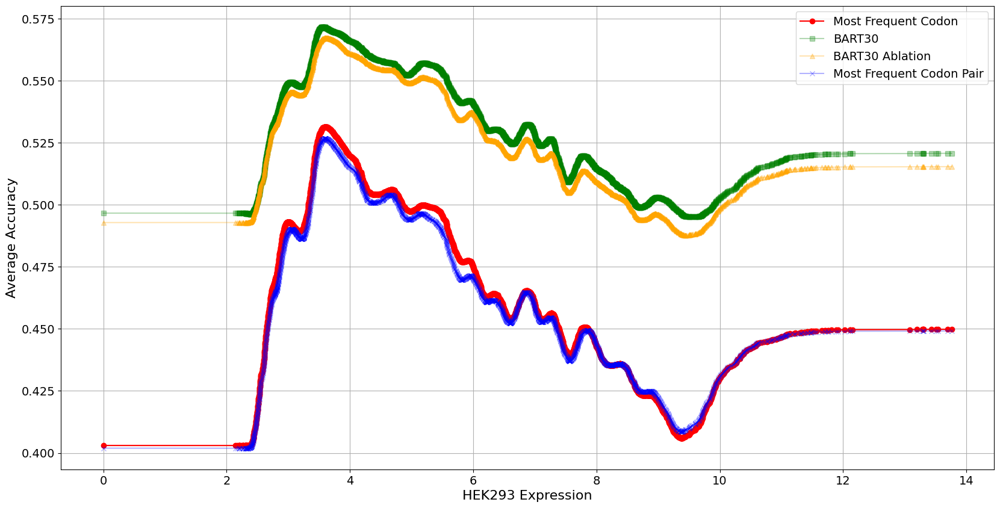

In [325]:
# sort by sequence average pident
sorted_df = test_with_results.sort_values(by='exp_HEK293')

HEK293_expression = sorted_df['exp_HEK293']

# group by sequence lengths and calculate the average of the accuracy columns
grouped = sorted_df.groupby(HEK293_expression)
average_accuracies_per_exp = grouped[['mfc_accuracy', 'mfb_accuracy', 'bart30_accuracy', 'bart30_ablation_accuracy']].mean()

# Apply Gaussian smoothing
sgma = 50

smoothed_mfc_accuracy = gaussian_filter1d(average_accuracies_per_exp['mfc_accuracy'], sigma=sgma)
smoothed_mfb_accuracy = gaussian_filter1d(average_accuracies_per_exp['mfb_accuracy'], sigma=sgma)
smoothed_bart_accuracy = gaussian_filter1d(average_accuracies_per_exp['bart30_accuracy'], sigma=sgma)
smoothed_bart_ablation_accuracy = gaussian_filter1d(average_accuracies_per_exp['bart30_ablation_accuracy'], sigma=sgma)

plt.figure(figsize=(20, 10))

plt.plot(average_accuracies_per_exp.index, smoothed_mfc_accuracy, marker='o', alpha=1, color='red', label='Most Frequent Codon')
plt.plot(average_accuracies_per_exp.index, smoothed_bart_accuracy, marker='s', alpha=0.3, color='green', label='BART30')
plt.plot(average_accuracies_per_exp.index, smoothed_bart_ablation_accuracy, marker='^', alpha=0.3, color='orange', label='BART30 Ablation')
plt.plot(average_accuracies_per_exp.index, smoothed_mfb_accuracy, marker='x', alpha=0.3, color='blue', label='Most Frequent Codon Pair')

# plt.title(f"Model Accuracies vs. HEK293 Expression with Gaussian Smoothing (sigma={sgma})", fontsize=20)
plt.xlabel('HEK293 Expression', fontsize=16)
plt.xticks(fontsize=14)
plt.xscale('linear')
plt.ylabel('Average Accuracy', fontsize=16)
plt.yticks(fontsize=14)
plt.legend(fontsize=14)
plt.grid(True)

plt.savefig('model_accuracies_vs_HEK293_expression.svg', format='svg', bbox_inches='tight')

plt.show()

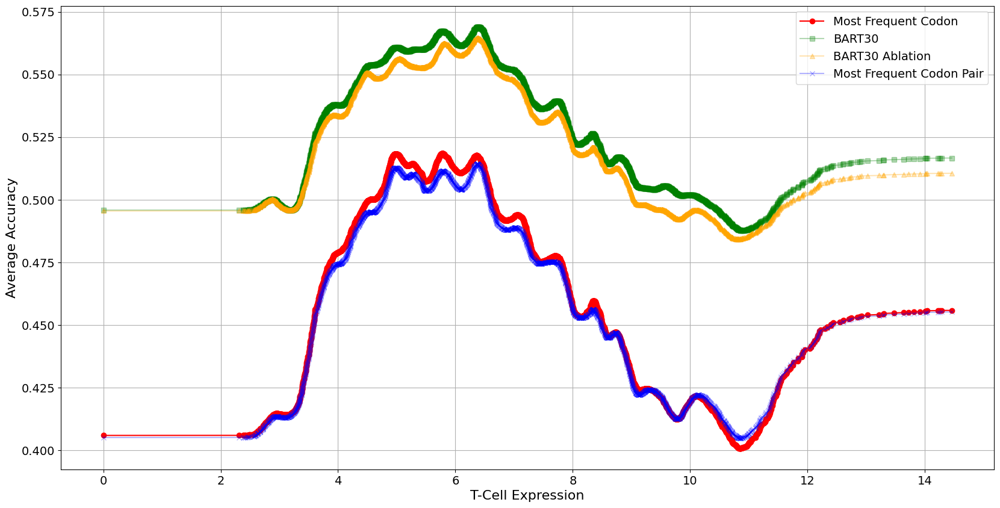

In [326]:
# sort by sequence average pident
sorted_df = test_with_results.sort_values(by='exp_T')

T_expression = sorted_df['exp_T']

# group by sequence lengths and calculate the average of the accuracy columns
grouped = sorted_df.groupby(T_expression)
average_accuracies_per_exp = grouped[['mfc_accuracy', 'mfb_accuracy', 'bart30_accuracy', 'bart30_ablation_accuracy']].mean()

# Apply Gaussian smoothing
sgma = 50

smoothed_mfc_accuracy = gaussian_filter1d(average_accuracies_per_exp['mfc_accuracy'], sigma=sgma)
smoothed_mfb_accuracy = gaussian_filter1d(average_accuracies_per_exp['mfb_accuracy'], sigma=sgma)
smoothed_bart_accuracy = gaussian_filter1d(average_accuracies_per_exp['bart30_accuracy'], sigma=sgma)
smoothed_bart_ablation_accuracy = gaussian_filter1d(average_accuracies_per_exp['bart30_ablation_accuracy'], sigma=sgma)

plt.figure(figsize=(20, 10))

plt.plot(average_accuracies_per_exp.index, smoothed_mfc_accuracy, marker='o', alpha=1, color='red', label='Most Frequent Codon')
plt.plot(average_accuracies_per_exp.index, smoothed_bart_accuracy, marker='s', alpha=0.3, color='green', label='BART30')
plt.plot(average_accuracies_per_exp.index, smoothed_bart_ablation_accuracy, marker='^', alpha=0.3, color='orange', label='BART30 Ablation')
plt.plot(average_accuracies_per_exp.index, smoothed_mfb_accuracy, marker='x', alpha=0.3, color='blue', label='Most Frequent Codon Pair')

# plt.title(f"Model Accuracies vs. Log-Scale T-Cell Expression with Gaussian Smoothing (sigma={sgma})", fontsize=20)
plt.xlabel('T-Cell Expression', fontsize=16)
plt.xticks(fontsize=14)
plt.xscale('linear')
plt.ylabel('Average Accuracy', fontsize=16)
plt.yticks(fontsize=14)
plt.legend(fontsize=14)
plt.grid(True)

plt.savefig('model_accuracies_vs_T_expression.svg', format='svg', bbox_inches='tight')

plt.show()

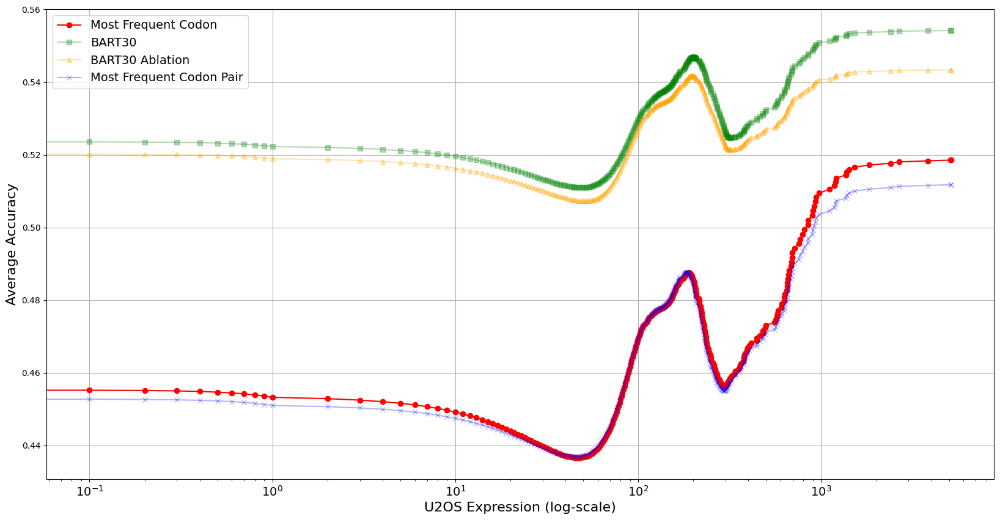

In [328]:
# sort by sequence average pident
sorted_df = test_with_results.sort_values(by='exp_U2OS')

U2OS_expression = sorted_df['exp_U2OS']

# group by sequence lengths and calculate the average of the accuracy columns
grouped = sorted_df.groupby(U2OS_expression)
average_accuracies_per_exp = grouped[['mfc_accuracy', 'mfb_accuracy', 'bart30_accuracy', 'bart30_ablation_accuracy']].mean()

# Apply Gaussian smoothing
sgma = 20

smoothed_mfc_accuracy = gaussian_filter1d(average_accuracies_per_exp['mfc_accuracy'], sigma=sgma)
smoothed_mfb_accuracy = gaussian_filter1d(average_accuracies_per_exp['mfb_accuracy'], sigma=sgma)
smoothed_bart_accuracy = gaussian_filter1d(average_accuracies_per_exp['bart30_accuracy'], sigma=sgma)
smoothed_bart_ablation_accuracy = gaussian_filter1d(average_accuracies_per_exp['bart30_ablation_accuracy'], sigma=sgma)

plt.figure(figsize=(20, 10))

plt.plot(average_accuracies_per_exp.index, smoothed_mfc_accuracy, marker='o', alpha=1, color='red', label='Most Frequent Codon')
plt.plot(average_accuracies_per_exp.index, smoothed_bart_accuracy, marker='s', alpha=0.3, color='green', label='BART30')
plt.plot(average_accuracies_per_exp.index, smoothed_bart_ablation_accuracy, marker='^', alpha=0.3, color='orange', label='BART30 Ablation')
plt.plot(average_accuracies_per_exp.index, smoothed_mfb_accuracy, marker='x', alpha=0.3, color='blue', label='Most Frequent Codon Pair')

# plt.title(f"Model Accuracies vs. Log-Scale U2OS Expression with Gaussian Smoothing (sigma={sgma})", fontsize=20)
plt.xlabel('U2OS Expression (log-scale)', fontsize=16)
plt.xticks(fontsize=14)
plt.xscale('log')
plt.ylabel('Average Accuracy', fontsize=16)
plt.xticks(fontsize=14)
plt.legend(fontsize=14)
plt.grid(True)

plt.savefig('model_accuracies_vs_U2OS_expression.svg', format='svg', bbox_inches='tight')

plt.show()

## Bicodon Accuracy

In [18]:
def bicodon_accuracy(row, model_name):
    model_prediction_column = f'{model_name}_prediction'
    seq = row['seq']
    prediction = row[model_prediction_column]
    
    correct_bigrams = 0
    total_bigrams = len(seq) - 2
    
    for i in range(total_bigrams):
        if seq[i:i+6] == prediction[i:i+6]:
            correct_bigrams += 1
    
    return correct_bigrams / total_bigrams if total_bigrams > 0 else 0

# Calculate bicodon accuracy for each model
test_with_results['mfc_bicodon_accuracy'] = test_with_results.apply(lambda x: bicodon_accuracy(x, 'mfc'), axis=1)
test_with_results['mfb_bicodon_accuracy'] = test_with_results.apply(lambda x: bicodon_accuracy(x, 'mfb'), axis=1)
test_with_results['bart30_bicodon_accuracy'] = test_with_results.apply(lambda x: bicodon_accuracy(x, 'bart30'), axis=1)

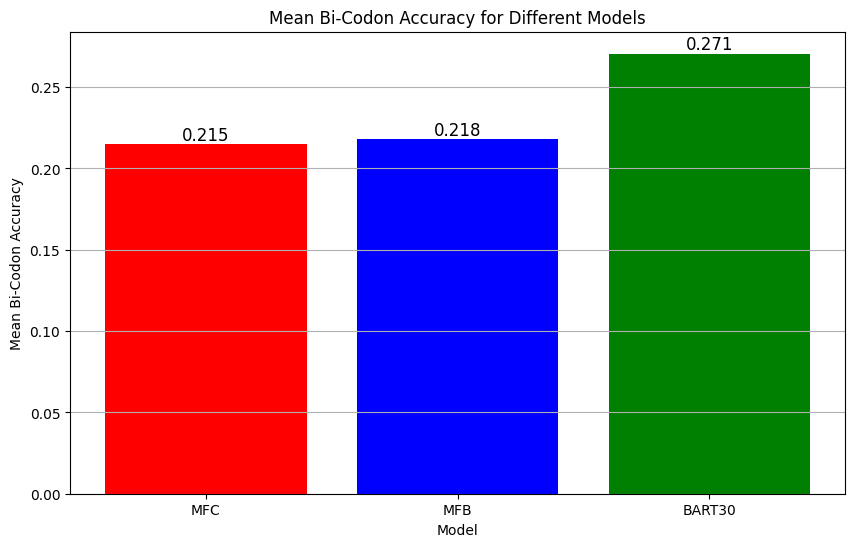

In [25]:
# Calculate the mean bicodon accuracy for each model
mean_bicodon_accuracy_mfc = test_with_results['mfc_bicodon_accuracy'].mean()
mean_bicodon_accuracy_mfb = test_with_results['mfb_bicodon_accuracy'].mean()
mean_bicodon_accuracy_bart30 = test_with_results['bart30_bicodon_accuracy'].mean()

# Create a bar plot
labels = ['MFC', 'MFB', 'BART30']
mean_accuracies = [mean_bicodon_accuracy_mfc, mean_bicodon_accuracy_mfb, mean_bicodon_accuracy_bart30]

plt.figure(figsize=(10, 6))
bars = plt.bar(labels, mean_accuracies, color=['red', 'blue', 'green'])

# Add text annotations
for bar, accuracy in zip(bars, mean_accuracies):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f'{accuracy:.3f}', ha='center', va='bottom', fontsize=12)

plt.xlabel('Model')
plt.ylabel('Mean Bi-Codon Accuracy')
plt.title('Mean Bi-Codon Accuracy for Different Models')
plt.grid(axis='y')
plt.show()

**Bad Graph - bart30 scales down as expected (sqrt).**

## Accuracy Per Amimo Acid

In [76]:
# Initialize dictionaries to store the counts of correct predictions and total counts for each amino acid
amino_acid_accuracy_counts = {
    'MFC': {},
    'MFB': {},
    'BART30': {},
    'BART30_Ablation': {}
}

# Iterate through each row in the DataFrame
for index, row in test_with_results.iterrows():
    ground_truth_codons = row['seq']
    amino_acids = row['amino_acid_seq']
    
    for model in ['MFC', 'MFB', 'BART30_Ablation', 'BART30']:
        predicted_codons = row[f'{model.lower()}_prediction']
        
        for i in range(0, len(ground_truth_codons), 3):
            ground_truth_codon = ground_truth_codons[i:i+3]
            predicted_codon = predicted_codons[i:i+3]
            amino_acid = amino_acids[i//3]
            
            if amino_acid not in amino_acid_accuracy_counts[model]:
                amino_acid_accuracy_counts[model][amino_acid] = {'correct': 0, 'total': 0}
            
            if ground_truth_codon == predicted_codon:
                amino_acid_accuracy_counts[model][amino_acid]['correct'] += 1
            amino_acid_accuracy_counts[model][amino_acid]['total'] += 1

# Calculate the accuracy for each amino acid for each model
amino_acid_accuracies = {
    'MFC': {},
    'MFB': {},
    'BART30': {},
    'BART30_Ablation': {}
}

for model in ['MFC', 'MFB', 'BART30_Ablation', 'BART30']:
    for amino_acid, counts in amino_acid_accuracy_counts[model].items():
        amino_acid_accuracies[model][amino_acid] = counts['correct'] / counts['total']

# Convert the results to a DataFrame for better visualization
amino_acid_accuracies_df = pd.DataFrame(amino_acid_accuracies)
print(amino_acid_accuracies_df)

        MFC       MFB    BART30  BART30_Ablation
M  1.000000  1.000000  1.000000         1.000000
S  0.234749  0.236427  0.291059         0.288891
R  0.227589  0.228122  0.303679         0.294752
V  0.450665  0.450665  0.459688         0.457931
Q  0.726355  0.726355  0.728214         0.728060
T  0.329327  0.326701  0.430442         0.427798
N  0.511197  0.511012  0.670252         0.666271
Y  0.536597  0.535599  0.676213         0.674436
G  0.318466  0.315447  0.399128         0.393309
L  0.375840  0.375840  0.389730         0.387130
A  0.381112  0.380780  0.464243         0.461757
F  0.514055  0.512317  0.685827         0.679316
K  0.550925  0.547160  0.598831         0.586587
E  0.557676  0.554448  0.614787         0.604273
P  0.306977  0.314247  0.411096         0.409499
C  0.515230  0.511068  0.706244         0.700428
I  0.439759  0.435127  0.545723         0.542155
D  0.510927  0.511146  0.685495         0.682233
H  0.548487  0.543092  0.657529         0.650085
W  1.000000  1.00000

In [331]:
amino_acid_accuracies_df.rename(columns={'BART30_Ablation': 'BART30Ab'}, inplace=True)
amino_acid_accuracies_df = amino_acid_accuracies_df[['MFC', 'MFB', 'BART30Ab', 'BART30']]

C:\Users\wsega\AppData\Local\Temp\ipykernel_35736\1821252788.py:22: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sorted_amino_acid_accuracies_df = sorted_amino_acid_accuracies_df.groupby('unique_codon_count', group_keys=False).apply(lambda x: x.sort_values('BART30', ascending=False))


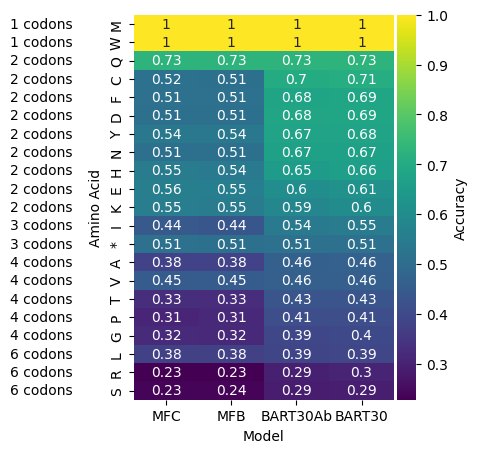

In [335]:
# Define the codon to amino acid mapping using BioPython
standard_table = CodonTable.unambiguous_dna_by_name["Standard"]
codon_to_amino_acid = {codon: aa for codon, aa in standard_table.forward_table.items()}
codon_to_amino_acid.update({codon: '*' for codon in standard_table.stop_codons})

# Define unique amino acids
unique_amino_acids = amino_acid_accuracies_df.index

# Create a dictionary to count the number of unique codons for each amino acid
amino_acid_to_codon_count = {aa: 0 for aa in unique_amino_acids}
for codon, aa in codon_to_amino_acid.items():
    if aa in amino_acid_to_codon_count:
        amino_acid_to_codon_count[aa] += 1

# Create a new column in the DataFrame for the number of unique codons
amino_acid_accuracies_df['unique_codon_count'] = amino_acid_accuracies_df.index.map(amino_acid_to_codon_count)

# Sort the DataFrame by the number of unique codons
sorted_amino_acid_accuracies_df = amino_acid_accuracies_df.sort_values(by='unique_codon_count', ascending=False)

# Sort each group of rows with the same number of codons by the value of BART30 mean accuracy
sorted_amino_acid_accuracies_df = sorted_amino_acid_accuracies_df.groupby('unique_codon_count', group_keys=False).apply(lambda x: x.sort_values('BART30', ascending=False))

# Drop the 'unique_codon_count' column for plotting
sorted_amino_acid_accuracies_df = sorted_amino_acid_accuracies_df.drop(columns=['unique_codon_count'])

# Plot the heatmap with annotations for the number of codons
plt.figure(figsize=(4, 5))
sns.heatmap(sorted_amino_acid_accuracies_df, annot=True, cmap='viridis', cbar=True, cbar_kws={'label': 'Accuracy', 'pad': 0.01})

# Annotate the number of codons for each group with a red square bracket
for idx, (label, row) in enumerate(sorted_amino_acid_accuracies_df.iterrows()):
    plt.text(-1.9, idx + 0.5, f'{amino_acid_to_codon_count[label]} codons', 
             va='center', ha='left', fontsize=10, color='black')


# plt.title('Amino Acid Accuracies Heatmap')
plt.xlabel('Model')
plt.ylabel('Amino Acid', labelpad=5)

plt.savefig('amino_acid_accuracies_heatmap.svg', format='svg', bbox_inches='tight')

plt.show()

C:\Users\wsega\AppData\Local\Temp\ipykernel_41292\2698770772.py:31: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sorted_amino_acid_accuracies_df = sorted_amino_acid_accuracies_df.groupby('unique_codon_count', group_keys=False).apply(lambda x: x.sort_values('BART30 - MFB', ascending=False))


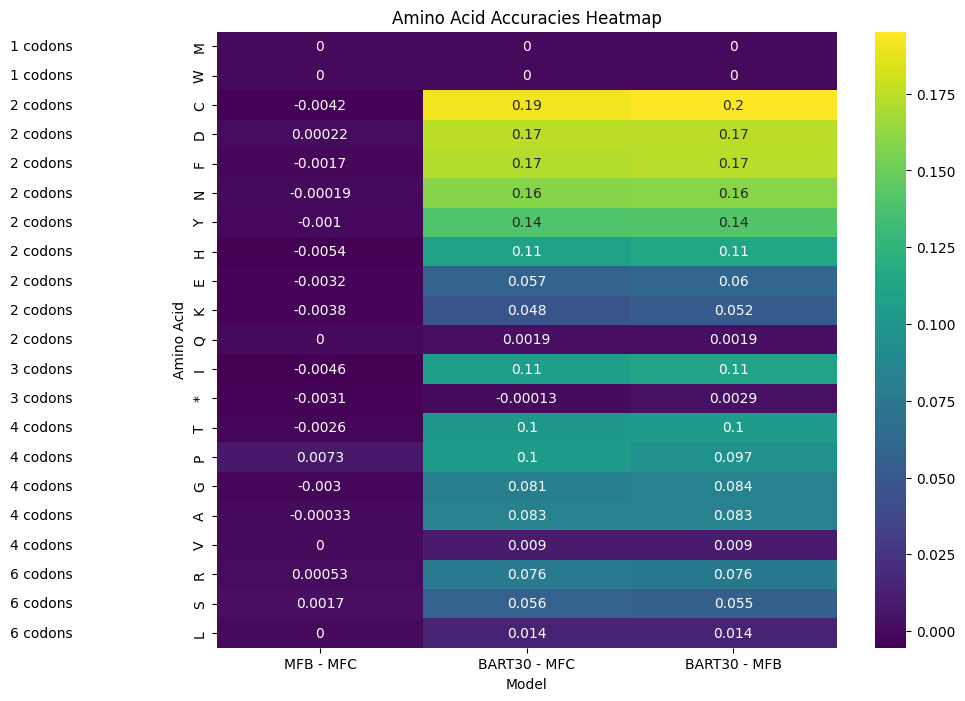

In [480]:
# add BART30-MFC column
amino_acid_accuracies_df['MFB - MFC'] = amino_acid_accuracies_df['MFB'] - amino_acid_accuracies_df['MFC']
amino_acid_accuracies_df['BART30 - MFC'] = amino_acid_accuracies_df['BART30'] - amino_acid_accuracies_df['MFC']
amino_acid_accuracies_df['BART30 - MFB'] = amino_acid_accuracies_df['BART30'] - amino_acid_accuracies_df['MFB']

temp_amino_acid_accuracies_df = amino_acid_accuracies_df.drop(columns=['MFC', 'MFB', 'BART30'])

# ---------------

# Define the codon to amino acid mapping using BioPython
standard_table = CodonTable.unambiguous_dna_by_name["Standard"]
codon_to_amino_acid = {codon: aa for codon, aa in standard_table.forward_table.items()}
codon_to_amino_acid.update({codon: '*' for codon in standard_table.stop_codons})

# Define unique amino acids
unique_amino_acids = temp_amino_acid_accuracies_df.index

# Create a dictionary to count the number of unique codons for each amino acid
amino_acid_to_codon_count = {aa: 0 for aa in unique_amino_acids}
for codon, aa in codon_to_amino_acid.items():
    if aa in amino_acid_to_codon_count:
        amino_acid_to_codon_count[aa] += 1

# Create a new column in the DataFrame for the number of unique codons
temp_amino_acid_accuracies_df['unique_codon_count'] = temp_amino_acid_accuracies_df.index.map(amino_acid_to_codon_count)

# Sort the DataFrame by the number of unique codons
sorted_amino_acid_accuracies_df = temp_amino_acid_accuracies_df.sort_values(by='unique_codon_count', ascending=False)

# Sort each group of rows with the same number of codons by the value of BART30 mean accuracy
sorted_amino_acid_accuracies_df = sorted_amino_acid_accuracies_df.groupby('unique_codon_count', group_keys=False).apply(lambda x: x.sort_values('BART30 - MFB', ascending=False))

# Drop the 'unique_codon_count' column for plotting
sorted_amino_acid_accuracies_df = sorted_amino_acid_accuracies_df.drop(columns=['unique_codon_count'])

# Plot the heatmap with annotations for the number of codons
plt.figure(figsize=(10, 8))
sns.heatmap(sorted_amino_acid_accuracies_df, annot=True, cmap='viridis', cbar=True)

# Annotate the number of codons for each group with a red square bracket
for idx, (label, row) in enumerate(sorted_amino_acid_accuracies_df.iterrows()):
    plt.text(-1, idx + 0.5, f'{amino_acid_to_codon_count[label]} codons', 
             va='center', ha='left', fontsize=10, color='black')


plt.title('Amino Acid Accuracies Heatmap')
plt.xlabel('Model')
plt.ylabel('Amino Acid')
plt.show()


C:\Users\wsega\AppData\Local\Temp\ipykernel_41292\2822421944.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab10', 6)


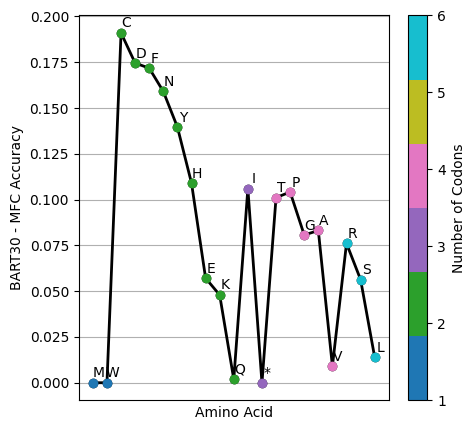

In [486]:
num_indices = range(len(sorted_amino_acid_accuracies_df['BART30 - MFC']))
y_data = sorted_amino_acid_accuracies_df['BART30 - MFC']
amino_acids = sorted_amino_acid_accuracies_df.index
codon_counts = [amino_acid_to_codon_count[aa] for aa in amino_acids]

# Normalize codon_counts for colormap
norm = mcolors.Normalize(vmin=min(codon_counts), vmax=max(codon_counts))
# use a colormap with 6 colors
cmap = cm.get_cmap('tab10', 6)

# plot the data
fig, ax = plt.subplots(figsize=(5, 5))
colors = [cmap(norm(codon_counts[i])) for i in range(len(codon_counts))]
ax.plot(num_indices, y_data, marker='o', linestyle='-', linewidth=2, color='black')  # Connect points with lines
for i, (x, y) in enumerate(zip(num_indices, y_data)):
    ax.plot(x, y, marker='o', color=colors[i], linestyle='None')  # Plot individual points
    ax.annotate(amino_acids[i], (x, y), textcoords="offset points", xytext=(4, 4), ha='center')  # Annotate points

# add labels and title
ax.set_xlabel('Amino Acid')
ax.set_ylabel('BART30 - MFC Accuracy')
# ax.set_title('BART30 - MFC Accuracy per Amino Acid')
ax.grid(axis='y')
ax.set_xticklabels([])
ax.set_xticks([])
# Add a colorbar
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Number of Codons')

plt.savefig('amino_acid_accuracies_bart30_minus_mfc.svg', format='svg', bbox_inches='tight')

plt.show()

In [322]:
grouped_amino_acids = amino_acid_accuracies_df.groupby('unique_codon_count')
grouped_amino_acids.mean()

,MFC,MFB,BART30,MFB - MFC,BART30 - MFC,BART30 - MFB
unique_codon_count,,,,,,
1,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
2,0.552383,0.550244,0.669266,-0.002139,0.116882,0.119021
3,0.475888,0.472039,0.528808,-0.003850,0.052919,0.056769
4,0.357309,0.357568,0.432920,0.000259,0.075610,0.075352
6,0.279393,0.280130,0.328156,0.000737,0.048763,0.048026


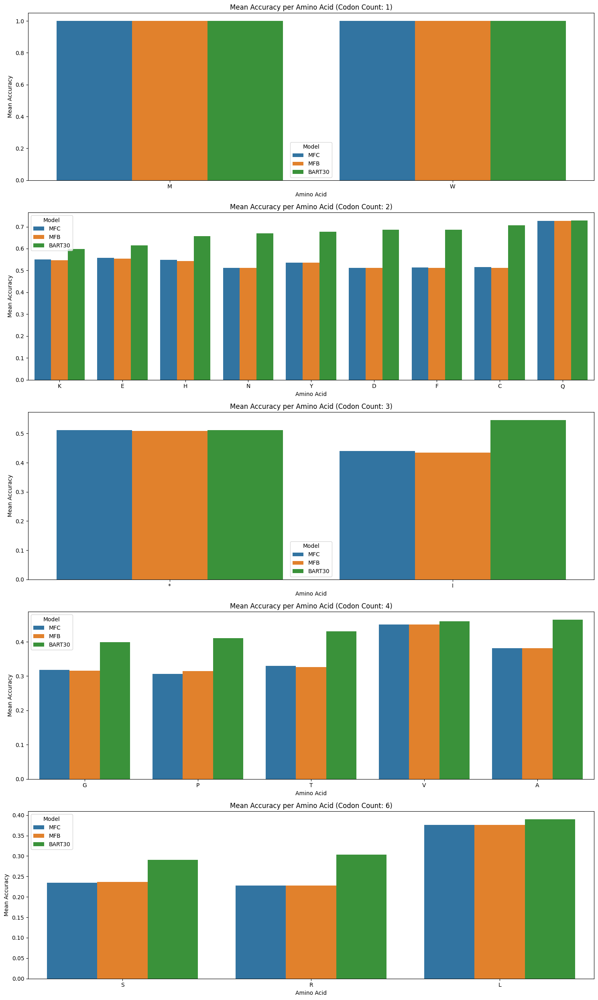

In [323]:
# Create a DataFrame for amino acid accuracies
amino_acid_accuracies_df = pd.DataFrame(amino_acid_accuracies)

# Add the unique codon count to the DataFrame
amino_acid_accuracies_df['unique_codon_count'] = amino_acid_accuracies_df.index.map(amino_acid_to_codon_count)

# Group amino acids by the number of corresponding codons
grouped_amino_acids = amino_acid_accuracies_df.groupby('unique_codon_count')

# Create a figure and axes for the subplots
fig, axes = plt.subplots(nrows=len(grouped_amino_acids), ncols=1, figsize=(15, 5 * len(grouped_amino_acids)))

# Iterate through each group and plot the barplot
for (codon_count, group), ax in zip(grouped_amino_acids, axes):
    # Sort the group by the value of the 'MFC' model
    sorted_group = group.sort_values(by='BART30', ascending=True)
    
    # Reset the index to include 'amino_acid' as a column
    sorted_group = sorted_group.reset_index()
    
    # Melt the DataFrame for seaborn
    melted_group = sorted_group.melt(id_vars=['index', 'unique_codon_count'], value_vars=['MFC', 'MFB', 'BART30'], var_name='Model', value_name='Accuracy')
    
    # Plot the barplot
    sns.barplot(data=melted_group, x='index', y='Accuracy', hue='Model', ax=ax)
    
    # Set the title and labels
    ax.set_title(f'Mean Accuracy per Amino Acid (Codon Count: {codon_count})')
    ax.set_xlabel('Amino Acid')
    ax.set_ylabel('Mean Accuracy')

# Adjust the layout
plt.tight_layout()
plt.show()

<Figure size 1200x800 with 0 Axes>

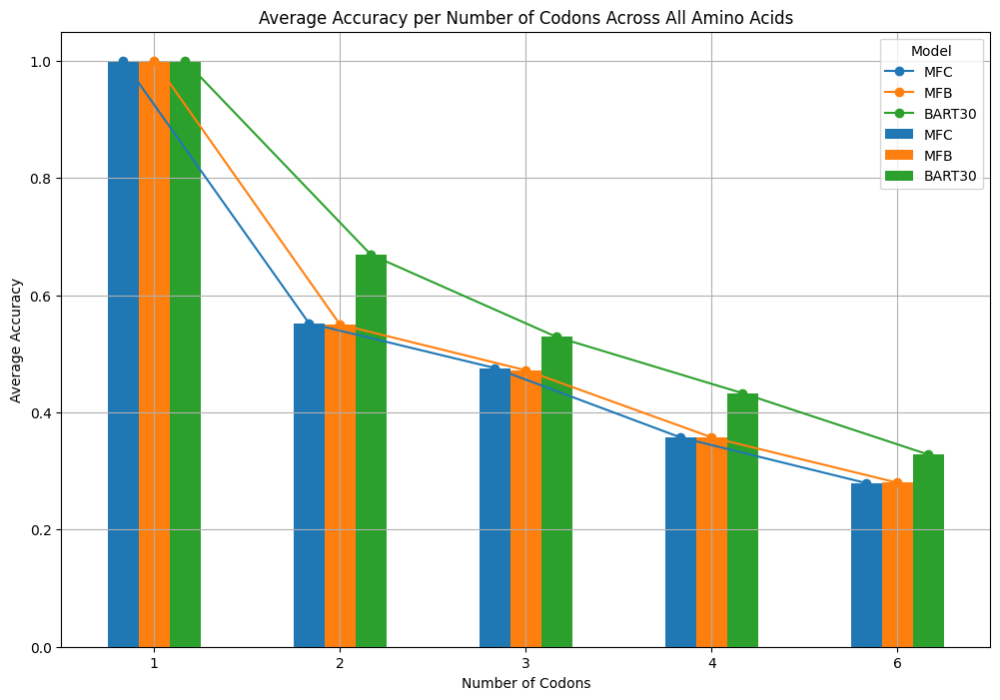

In [324]:
# Group by the number of unique codons and calculate the mean accuracy for each group
grouped_by_codon_count = amino_acid_accuracies_df.groupby('unique_codon_count').mean()

# Plot the average accuracy per number of codons
plt.figure(figsize=(12, 8))
ax = grouped_by_codon_count.plot(kind='bar', figsize=(12, 8))

# Connect each consecutive bar of the same color by a line
for i, model in enumerate(grouped_by_codon_count.columns):
    plt.plot(np.arange((i-1)/6, len(grouped_by_codon_count) + (i-1)/6, 1), grouped_by_codon_count[model], marker='o', label=model)

plt.title('Average Accuracy per Number of Codons Across All Amino Acids')
plt.xlabel('Number of Codons')
plt.ylabel('Average Accuracy')
plt.xticks(rotation=0)
plt.legend(title='Model')
plt.grid(True)
plt.show()

## Accuracy Per Codon

In [47]:
codon_to_fraction = np.load(os.path.join(results_path, 'codon_to_fraction.npy'), allow_pickle=True).item()

# Codon fractions
fractions = np.array(list(codon_to_fraction.values()))
codon_names = np.array(list(codon_to_fraction.keys()))

In [49]:
# Codon sequences predicted and ground-truth
bart30_predicted_sequences = test_with_results['bart30_prediction']
bart30_ablation_predicted_sequences = test_with_results['bart30_ablation_prediction']
mfc_predicted_sequences = test_with_results['mfc_prediction']
mfb_predicted_sequences = test_with_results['mfb_prediction']
ground_truth_sequences = test_with_results['seq']

In [50]:
# split the sequences into codons
ground_truth_codons = ground_truth_sequences.apply(lambda x: [x[i:i+3] for i in range(0, len(x), 3)])
bart30_codons = bart30_predicted_sequences.apply(lambda x: [x[i:i+3] for i in range(0, len(x), 3)])
bart30_ablation_codons = bart30_ablation_predicted_sequences.apply(lambda x: [x[i:i+3] for i in range(0, len(x), 3)])
mfc_codons = mfc_predicted_sequences.apply(lambda x: [x[i:i+3] for i in range(0, len(x), 3)])
mfb_codons = mfb_predicted_sequences.apply(lambda x: [x[i:i+3] for i in range(0, len(x), 3)])

In [51]:
# Convert lists of codons to NumPy arrays
ground_truth_codons_array = np.array(ground_truth_codons.tolist(), dtype=object)
bart30_codons_array = np.array(bart30_codons.tolist(), dtype=object)
bart30_ablation_codons_array = np.array(bart30_ablation_codons.tolist(), dtype=object)
mfc_codons_array = np.array(mfc_codons.tolist(), dtype=object)
mfb_codons_array = np.array(mfb_codons.tolist(), dtype=object)

# Compare the codons for all sequences at once
bart30_is_codon_correct = [np.array(bart30_codons_array[i]) == np.array(ground_truth_codons_array[i]) for i in range(len(ground_truth_codons_array))]
bart30_ablation_is_codon_correct = [np.array(bart30_ablation_codons_array[i]) == np.array(ground_truth_codons_array[i]) for i in range(len(ground_truth_codons_array))]
mfc_is_codon_correct = [np.array(mfc_codons_array[i]) == np.array(ground_truth_codons_array[i]) for i in range(len(ground_truth_codons_array))]
mfb_is_codon_correct = [np.array(mfb_codons_array[i]) == np.array(ground_truth_codons_array[i]) for i in range(len(ground_truth_codons_array))]


In [199]:
# Initialize dictionaries to store codon accuracies
bart30_codon_accuracies = {}
bart30_ablation_codon_accuracies = {}
mfc_codon_accuracies = {}
mfb_codon_accuracies = {}

# Convert ground_truth_codons_array to a flat array for comparison
flat_ground_truth_codons = np.concatenate(ground_truth_codons_array)

# Create a mask for each codon
for codon in codon_names:
    codon_mask = flat_ground_truth_codons == codon

    # Flatten and concatenate the boolean arrays for each model
    mfc_codon_bools = np.concatenate(mfc_is_codon_correct)[codon_mask]
    mfb_codon_bools = np.concatenate(mfb_is_codon_correct)[codon_mask]
    bart30_codon_bools = np.concatenate(bart30_is_codon_correct)[codon_mask]
    bart30_ablation_codon_bools = np.concatenate(bart30_ablation_is_codon_correct)[codon_mask]

    # Calculate codon accuracies
    bart30_codon_accuracies[codon] = np.mean(bart30_codon_bools) if len(bart30_codon_bools) > 0 else 0
    bart30_ablation_codon_accuracies[codon] = np.mean(bart30_ablation_codon_bools) if len(bart30_ablation_codon_bools) > 0 else 0
    mfc_codon_accuracies[codon] = np.mean(mfc_codon_bools) if len(mfc_codon_bools) > 0 else 0
    mfb_codon_accuracies[codon] = np.mean(mfb_codon_bools) if len(mfb_codon_bools) > 0 else 0

In [ ]:
# Save dictionaries to a single NumPy file
np.savez_compressed(os.path.join(results_path, 'codon_accuracies.npz'), bart30=bart30_codon_accuracies, bart30_ablation=bart30_ablation_codon_accuracies, mfc=mfc_codon_accuracies, mfb=mfb_codon_accuracies)

In [59]:
# Load the dictionaries from the NumPy file
loaded_data = np.load(os.path.join(results_path, 'codon_accuracies.npz'), allow_pickle=True)
bart30_codon_accuracies = loaded_data['bart30'].item()
bart30_ablation_codon_accuracies = loaded_data['bart30_ablation'].item()
mfc_codon_accuracies = loaded_data['mfc'].item()
mfb_codon_accuracies = loaded_data['mfb'].item()

# Convert the dictionaries to a DataFrame with codon names as index
codon_accuracies_df = pd.DataFrame({
    'MFC': mfc_codon_accuracies,
    'MFB': mfb_codon_accuracies,
    'BART30_Ablation': bart30_ablation_codon_accuracies,
    'BART30': bart30_codon_accuracies
})

In [60]:
codon_accuracies_df

,MFC,MFB,BART30_Ablation,BART30
AAA,0.0,0.053250,0.328258,0.416611
AAG,1.0,0.949760,0.797158,0.747364
AAC,1.0,0.910278,0.863434,0.821768
AAT,0.0,0.093454,0.460076,0.511794
ACA,0.0,0.066236,0.326970,0.341544
...,...,...,...,...
TGC,1.0,0.938463,0.875840,0.846176
TGT,0.0,0.056818,0.513994,0.557518
TGG,1.0,1.000000,1.000000,1.000000
TTC,1.0,0.780685,0.886699,0.857224


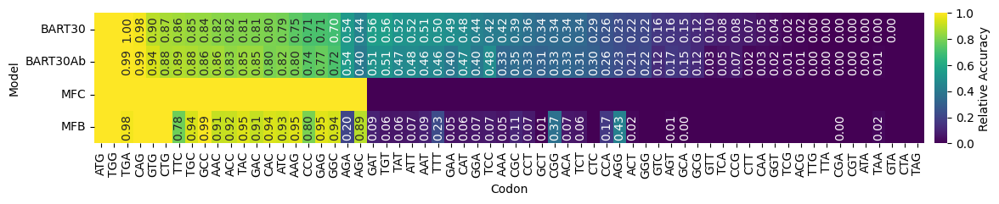

In [6]:
# Create a DataFrame from the codon accuracies
codon_accuracies_df = pd.DataFrame({
    'BART30': bart30_codon_accuracies,
    'BART30Ab': bart30_ablation_codon_accuracies,
    'MFC': mfc_codon_accuracies,
    'MFB': mfb_codon_accuracies
})

# Sort the columns by BART30 accuracies
sorted_columns = codon_accuracies_df.sort_values(by=['MFC', 'BART30', 'MFB', 'BART30Ab'], axis=0, ascending=[False, False, False, False]).index

# Reorder the DataFrame columns
sorted_codon_accuracies_df = codon_accuracies_df.loc[sorted_columns]

# Create a mask for annotations (don't annotate 0 and 1 values)
annot_mask = sorted_codon_accuracies_df.T.map(lambda x: f"{x:.2f}" if not x in [0, 1] else "")

# Plot the heatmap
plt.figure(figsize=(15, 2))
sns.heatmap(sorted_codon_accuracies_df.T, cmap='viridis', annot=annot_mask, fmt="", 
            yticklabels=['BART30', 'BART30Ab', 'MFC', 'MFB'], cbar_kws={'pad': 0.01, 'aspect': 10, 'label': 'Relative Accuracy'},
            annot_kws={"rotation": 90})  # Rotate annotations by 90 degrees

# plt.title('Synonymous Codon Relative Accuracies for Different Models (Sorted by BART30)')
plt.xlabel('Codon')
plt.ylabel('Model')

# tight layout
# plt.tight_layout()

# save the figure to svg file
plt.savefig('codon_accuracies_heatmap.svg', format='svg', bbox_inches='tight')

plt.show()


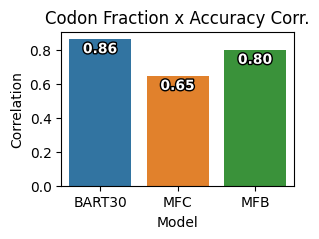

In [206]:
# Convert the list to a pandas Series
codon_fractions_series = pd.Series(codon_to_fraction)

# Compute the correlation
codon_fraction_to_accuracy_correlations = codon_accuracies_df.corrwith(codon_fractions_series, method='spearman')

# Create a DataFrame for plotting
correlation_df = codon_fraction_to_accuracy_correlations.reset_index()
correlation_df.columns = ['Model', 'Correlation']

# Plot the correlation in a barplot
plt.figure(figsize=(3, 2))

sns.barplot(data=correlation_df, x='Model', y='Correlation', hue='Model', palette='tab10', legend=False)

# Annotate the values on the plot
for i, value in enumerate(correlation_df['Correlation']):
    # add color and stroke to text
    plt.text(i, value - 0.1, f'{value:.2f}', ha='center', va='bottom', color='white', fontsize=10, fontweight='bold', path_effects=[pe.withStroke(linewidth=2, foreground='black')])

plt.title('Codon Fraction x Accuracy Corr.')
plt.ylabel('Correlation')

# Save the plot to svg file
plt.savefig('codon_fraction_accuracy_correlation.svg', format='svg')

plt.show()


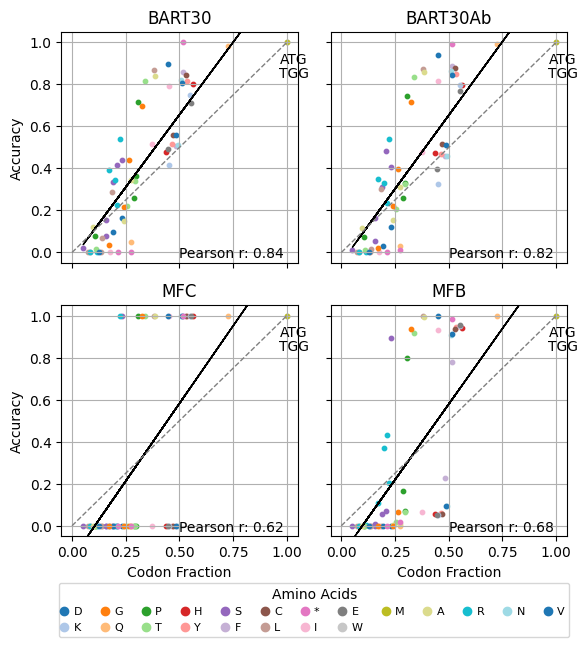

In [9]:
# Codon fractions series
codon_fractions_series = pd.Series(codon_to_fraction)

# Codon to amino acid mapping using BioPython
standard_table = CodonTable.unambiguous_dna_by_name["Standard"]
codon_to_amino_acid = {codon: aa for codon, aa in standard_table.forward_table.items()}
codon_to_amino_acid.update({codon: '*' for codon in standard_table.stop_codons})

# Define models and colors
models = ['BART30', 'BART30Ab', 'MFC', 'MFB']
amino_acids = set(codon_to_amino_acid.values())
aa_colors = sns.color_palette('tab20', len(amino_acids))
aa_to_color = {aa: aa_colors[i] for i, aa in enumerate(amino_acids)}

# Create a figure with a 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(6, 6))

# Plot each model in a subplot
for i, model in enumerate(models):
    ax = axes[i // 2, i % 2]
    x_data = codon_fractions_series
    y_data = codon_accuracies_df[model]
    
    # Calculate Pearson correlation
    pearson_corr, _ = pearsonr(x_data, y_data)
    ax.text(0.5, 0.07, f'Pearson r: {pearson_corr:.2f}', transform=ax.transAxes, fontsize=10, verticalalignment='top')
    
    # Fit and plot regression line
    slope, intercept = np.polyfit(x_data, y_data, 1)
    ax.plot(x_data, slope * x_data + intercept, color='black', linestyle='-', linewidth=1, label='Regression Line')    

    # Scatter plot
    for codon, aa in codon_to_amino_acid.items():
        ax.scatter(x_data[codon], y_data[codon], color=aa_to_color[aa], alpha=1, s=10)
    
    ax.set_xlabel('Codon Fraction')
    ax.set_ylabel('Accuracy')
    ax.set_title(f'{model}')
    ax.grid(True)
    ax.set_ylim(-0.05, 1.05)

    # Add a 45-degree line
    min_val = min(x_data.min(), y_data.min())
    max_val = max(x_data.max(), y_data.max())
    ax.plot([min_val, max_val], [min_val, max_val], color='gray', linestyle='--', linewidth=1, label='45° Line')

    # Add annotations for the codons with the highest codon fractions
    highest_fraction_codons = x_data[x_data == x_data.max()].index
    for j, highest_fraction_codon in enumerate(highest_fraction_codons):
        ax.annotate(highest_fraction_codon, 
                    (x_data[highest_fraction_codon], y_data[highest_fraction_codon]), 
                    textcoords="offset points", xytext=(5, 5 - (j + 2) * 10), ha='center')

# Add the legend in the fourth subplot
# legend_ax = axes[1, 1]
# legend_ax.axis('off')  # Turn off the axis
# handles = [plt.Line2D([0], [0], marker='o', color=color, linestyle='', label=aa) for aa, color in aa_to_color.items()]
# legend_ax.legend(handles=handles, loc='center', title='Amino Acids', ncol=3)

# turn off x and y axes ticks and labels for some subplots
axes[0, 1].set_xlabel('')
axes[0, 1].set_ylabel('')
axes[0, 1].set_xticklabels([])
axes[0, 1].set_yticklabels([])
axes[0, 0].set_xlabel('')
axes[0, 0].set_xticklabels([])
axes[1, 1].set_ylabel('')
axes[1, 1].set_yticklabels([])

# add the legend to the right of the figure
handles = [plt.Line2D([0], [0], marker='o', color=color, linestyle='', label=aa) for aa, color in aa_to_color.items()]
fig.legend(handles=handles, loc='lower center', bbox_to_anchor=(0.532, -0.08), title='Amino Acids', fontsize=8, title_fontsize=10, ncols=len(amino_acids)//2+3, handlelength=0.1)
# Adjust the layout to prevent overlap
plt.subplots_adjust(wspace=0.4, hspace=0.4)
# Adjust layout
plt.tight_layout()

# Save figure to svg file
plt.savefig('codon_fraction_accuracy_scatter.svg', format='svg', bbox_inches='tight')

plt.show()

## Accuracy vs. GC content

In [ ]:
def gc_content(seq):
    """Calculate the GC content of a sequence."""
    return (seq.count('G') + seq.count('C')) / len(seq) if len(seq) > 0 else 0

test_with_results['gc_content'] = test_with_results['seq'].swifter.apply(gc_content)
test_with_results['mfc_gc_content'] = test_with_results['mfc_prediction'].swifter.apply(gc_content)
test_with_results['mfb_gc_content'] = test_with_results['mfb_prediction'].swifter.apply(gc_content)
test_with_results['bart30_ablation_gc_content'] = test_with_results['bart30_ablation_prediction'].swifter.apply(gc_content)
test_with_results['bart30_gc_content'] = test_with_results['bart30_prediction'].swifter.apply(gc_content)

Pandas Apply: 100%|██████████| 15976/15976 [00:00<00:00, 152714.80it/s]


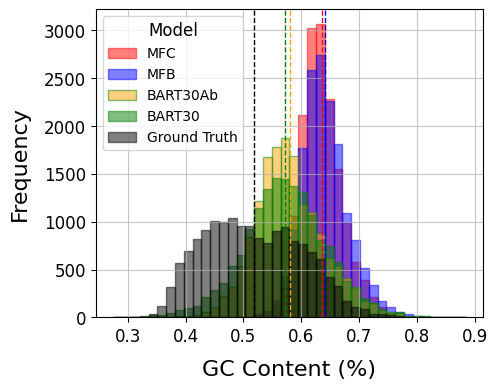

In [140]:
plt.figure(figsize=(5, 4))

# Define the number of bins
bins = 40

# Calculate the shared bin edges
bin_edges = np.linspace(
    min(test_with_results[['gc_content', 'mfc_gc_content', 'mfb_gc_content', 'bart30_ablation_gc_content', 'bart30_gc_content']].min()),
    max(test_with_results[['gc_content', 'mfc_gc_content', 'mfb_gc_content', 'bart30_ablation_gc_content', 'bart30_gc_content']].max()),
    bins + 1
)

mean_gc_content_mfc = test_with_results['mfc_gc_content'].mean()
mean_gc_content_mfb = test_with_results['mfb_gc_content'].mean()
mean_gc_content_bart30_ablation = test_with_results['bart30_ablation_gc_content'].mean()
mean_gc_content_bart30 = test_with_results['bart30_gc_content'].mean()
mean_gc_content_ground_truth = test_with_results['gc_content'].mean()

# Plot histograms for each dataset using shared bins
plt.hist(test_with_results['mfc_gc_content'], bins=bin_edges, alpha=0.5, label='MFC', color='red', edgecolor='red')
plt.axvline(mean_gc_content_mfc, color='red', linestyle='--', linewidth=1)

plt.hist(test_with_results['mfb_gc_content'], bins=bin_edges, alpha=0.5, label='MFB', color='blue', edgecolor='blue')
plt.axvline(mean_gc_content_mfb, color='blue', linestyle='--', linewidth=1)

plt.hist(test_with_results['bart30_ablation_gc_content'], bins=bin_edges, alpha=0.5, label='BART30Ab', color='orange', edgecolor='green')
plt.axvline(mean_gc_content_bart30_ablation, color='orange', linestyle='--', linewidth=1)

plt.hist(test_with_results['bart30_gc_content'], bins=bin_edges, alpha=0.5, label='BART30', color='green', edgecolor='green')
plt.axvline(mean_gc_content_bart30, color='green', linestyle='--', linewidth=1)

plt.hist(test_with_results['gc_content'], bins=bin_edges, alpha=0.5, label='Ground Truth', color='black', edgecolor='black')
plt.axvline(mean_gc_content_ground_truth, color='black', linestyle='--', linewidth=1)

# Add labels and legend
plt.xlabel('GC Content (%)', fontsize=16, labelpad=10)
plt.ylabel('Frequency', fontsize=16, labelpad=10)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='both', linestyle='-', alpha=0.7)
plt.legend(fontsize=10, title='Model', title_fontsize=12, loc='best')

# Save the figure as an SVG file
plt.savefig('gc_content_histograms.svg', format='svg', bbox_inches='tight')

plt.show()


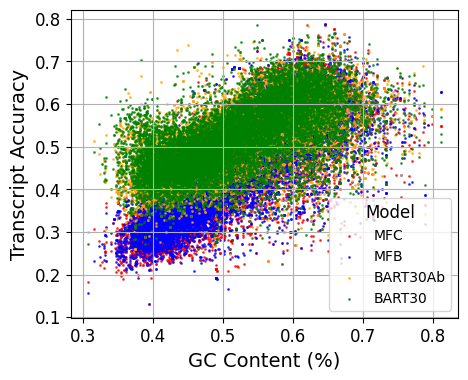

In [81]:
# Sort the data by 'GC.' column
sorted_indices = test_with_results['gc_content'].argsort()
sorted_gc_content = test_with_results['gc_content'].iloc[sorted_indices]
sorted_accuracies = test_with_results[['mfc_accuracy', 'mfb_accuracy', 'bart30_ablation_accuracy', 'bart30_accuracy']].iloc[sorted_indices]

# Scatter plot for all models
plt.figure(figsize=(5, 4))
labels = ['MFC', 'MFB', 'BART30Ab', 'BART30']
colors = ['red', 'blue', 'orange', 'green']
models = ['mfc_accuracy', 'mfb_accuracy', 'bart30_ablation_accuracy', 'bart30_accuracy']

for model, color, label in zip(models, colors, labels):
    # Scatter plot
    plt.scatter(sorted_gc_content, sorted_accuracies[model], label=f'{label}', color=color, alpha=0.7, s=1)

# Add labels, legend, and grid
plt.xlabel('GC Content (%)', fontsize=14)
plt.ylabel('Transcript Accuracy', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=10, title_fontsize=12, title='Model')
plt.grid(True)

plt.show()

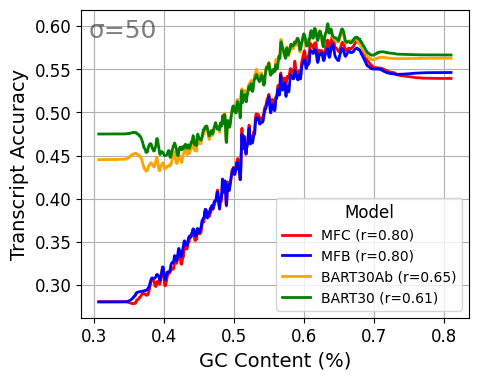

In [85]:
# Sort the data by 'GC.' column
sorted_indices = test_with_results['gc_content'].argsort()
sorted_gc_content = test_with_results['gc_content'].iloc[sorted_indices]
sorted_accuracies = test_with_results[['mfc_accuracy', 'mfb_accuracy', 'bart30_ablation_accuracy', 'bart30_accuracy']].iloc[sorted_indices]

# Define the window size for moving average
sgma = 50

# Plot smoothed lines for all models
plt.figure(figsize=(5, 4))
labels = ['MFC', 'MFB', 'BART30Ab', 'BART30']
colors = ['red', 'blue', 'orange', 'green']
models = ['mfc_accuracy', 'mfb_accuracy', 'bart30_ablation_accuracy', 'bart30_accuracy']

for model, color, label in zip(models, colors, labels):
    # Apply Gaussian smoothing
    smoothed_y = gaussian_filter1d(sorted_accuracies[model], sigma=sgma)
    
    # Calculate Pearson correlation
    pearson_corr, _ = pearsonr(sorted_gc_content, sorted_accuracies[model])
    
    # Plot the smoothed line
    plt.plot(sorted_gc_content, smoothed_y, label=f'{label} (r={pearson_corr:.2f})', linewidth=2, color=color)

# Add labels, legend, and grid
plt.xlabel('GC Content (%)', fontsize=14)
plt.ylabel('Transcript Accuracy', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=10, title_fontsize=12, title='Model')
plt.grid(True)

# Annotate sigma value in the top left corner
plt.text(0.02, 0.97, f'σ={sgma}', fontsize=18, ha='left', va='top', alpha=0.5, transform=plt.gca().transAxes)

# Save the figure as an SVG file
plt.savefig('transcript_accuracy_vs_gc_content_smoothed_with_correlation.svg', format='svg', bbox_inches='tight')

plt.show()


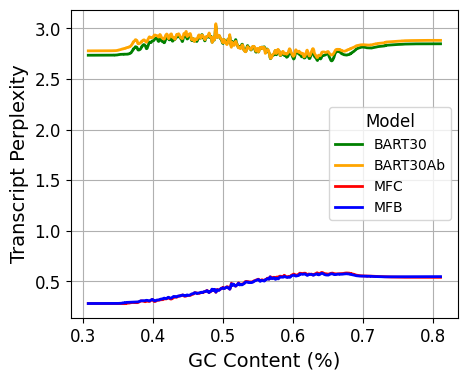

In [9]:
# Sort the data by 'GC.' column
sorted_indices = test_with_results['gc_content'].argsort()
sorted_gc_content = test_with_results['gc_content'].iloc[sorted_indices]
sorted_perplexities = test_with_results[['bart30_perplexity', 'bart30_ablation_perplexity', 'mfc_accuracy', 'mfb_accuracy']].iloc[sorted_indices]

# Define the window size for moving average
window_size = 50

# Plot smoothed lines for all models
plt.figure(figsize=(5, 4))
labels = ['BART30', 'BART30Ab', 'MFC', 'MFB']
colors = ['green', 'orange', 'red', 'blue']
models = ['bart30_perplexity', 'bart30_ablation_perplexity', 'mfc_accuracy', 'mfb_accuracy']

for model, color, label in zip(models, colors, labels):
    # Apply Gaussian smoothing
    smoothed_y = gaussian_filter1d(sorted_perplexities[model], sigma=window_size)
    
    # Plot the smoothed line
    plt.plot(sorted_gc_content, smoothed_y, label=f'{label}', linewidth=2, color=color)

# Add labels, legend, and grid
plt.xlabel('GC Content (%)', fontsize=14)
plt.ylabel('Transcript Perplexity', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=10, title_fontsize=12, title='Model')
plt.grid(True)

# plt.savefig('transcript_perplexity_vs_gc_content_smoothed.svg', format='svg', bbox_inches='tight')

plt.show()


In [ ]:
def get_dna_codons():
  nt_bases = ['A', 'C', 'G', 'T']
  codons = [c1 + c2 + c3 for c1 in nt_bases for c2 in nt_bases for c3 in nt_bases]
  return codons

def get_amino_acids():
    codons = get_dna_codons()
    amino_acids = [Seq(codon).translate() for codon in codons]
    unique_amino_acids = list(set(amino_acids))
    return unique_amino_acids

amino_acids = get_amino_acids()

def amino_acid_fractions(dna_seq):
    # Create a dictionary to store the fractions of each amino acid
    aa_fractions = {}
    # Iterate through the codon fractions and calculate the fraction for each amino aci
    aa_seq = Seq(dna_seq).translate()
    for aa in amino_acids:
        # Count the number of codons for the amino acid in the sequence
        count = Seq(aa_seq).count(aa)
        # Calculate the fraction of the amino acid in the sequence
        fraction = count / len(aa_seq) if len(aa_seq) > 0 else 0
        aa_fractions[str(aa)] = fraction
    return aa_fractions

def codon_fractions(dna_seq):
    # Create a dictionary to store the fractions of each codon
    codon_fractions = {codon: 0 for codon in get_dna_codons()}
    # Split the DNA sequence into codons
    codon_list = [dna_seq[i:i+3] for i in range(0, len(dna_seq), 3)]
    # Count the occurrences of each codon in the sequence
    for codon in codon_fractions.keys():
        count = codon_list.count(codon)
        # Calculate the fraction of the codon in the sequence
        fraction = count / len(codon_list) if len(codon_list) > 0 else 0
        codon_fractions[codon] = fraction
    return codon_fractions

test_with_results['amino_acid_fractions'] = test_with_results['seq'].swifter.apply(amino_acid_fractions)
amino_acid_fractions_df = pd.DataFrame(test_with_results['amino_acid_fractions'].tolist(), index=test_with_results.index)

test_with_results['codon_fractions'] = test_with_results['seq'].swifter.apply(codon_fractions)
codon_fractions_df = pd.DataFrame(test_with_results['codon_fractions'].tolist(), index=test_with_results.index)

Pandas Apply: 100%|██████████| 15976/15976 [00:05<00:00, 2663.06it/s]


In [ ]:
# Define the codon to amino acid mapping using BioPython
standard_table = CodonTable.unambiguous_dna_by_name["Standard"]
codon_to_amino_acid = {codon: aa for codon, aa in standard_table.forward_table.items()}
codon_to_amino_acid.update({codon: '*' for codon in standard_table.stop_codons})

# Reverse the mapping to get amino acid to codons
amino_acid_to_codons = {}
for codon, aa in codon_to_amino_acid.items():
    if aa not in amino_acid_to_codons:
        amino_acid_to_codons[aa] = []
    amino_acid_to_codons[aa].append(codon)

# Function to calculate GC content for a list of codons
def calculate_gc_content(codons):
    gc_count = sum(codon.count('G') + codon.count('C') for codon in codons)
    total_bases = len(codons) * 3
    return gc_count / total_bases if total_bases > 0 else 0

# Create a DataFrame to store GC content for each amino acid
amino_acids = list(amino_acid_to_codons.keys())
gc_content_df = pd.DataFrame(columns=amino_acids)

# Iterate through each row in the 'seq' column
gc_content_rows = []  # Temporary list to store rows
for index, row in test_with_results.iterrows():
    seq = row['seq']
    codons = [seq[i:i+3] for i in range(0, len(seq), 3)]
    gc_content_row = {}
    
    for aa in amino_acids:
        aa_codons = [codon for codon in codons if codon in amino_acid_to_codons.get(aa, [])]
        gc_content_row[aa] = calculate_gc_content(aa_codons)
    
    gc_content_rows.append(gc_content_row)

# Convert the list of rows into a DataFrame
gc_content_df = pd.DataFrame(gc_content_rows)

gc_content_df

,F,L,S,Y,C,W,P,H,Q,R,...,M,T,N,K,V,A,D,E,G,*
0,0.129032,0.550201,0.498471,0.183333,0.523810,0.666667,0.813725,0.492754,0.585366,0.594203,...,0.333333,0.510204,0.210526,0.180791,0.575758,0.830409,0.488506,0.508772,0.864198,0.000000
1,0.185185,0.500000,0.425926,0.166667,0.444444,0.666667,0.769231,0.500000,0.500000,0.625000,...,0.333333,0.444444,0.142857,0.138889,0.555556,0.772727,0.523810,0.533333,0.845238,0.333333
2,0.222222,0.536723,0.517544,0.208333,0.444444,0.666667,0.811594,0.551724,0.586667,0.711111,...,0.333333,0.588889,0.200000,0.218750,0.589744,0.847619,0.555556,0.571429,0.904762,0.000000
3,0.222222,0.587719,0.525253,0.266667,0.595238,0.666667,0.870370,0.666667,0.647059,0.708333,...,0.333333,0.577778,0.263158,0.244444,0.632184,0.896552,0.579710,0.588889,0.914286,0.333333
4,0.333333,0.666667,0.666667,0.166667,0.666667,0.666667,0.833333,0.333333,0.666667,0.733333,...,0.333333,0.333333,0.166667,0.333333,0.555556,0.777778,0.533333,0.666667,0.888889,0.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15971,0.294118,0.614286,0.588889,0.233333,0.565217,0.666667,0.876543,0.600000,0.620155,0.843972,...,0.333333,0.600000,0.277778,0.308333,0.630952,0.913333,0.565657,0.555556,0.930556,0.000000
15972,0.297619,0.661017,0.591954,0.317460,0.666667,0.666667,0.925926,0.625000,0.666667,0.929825,...,0.333333,0.603175,0.318182,0.319149,0.666667,0.934641,0.608696,0.654902,0.929487,0.333333
15973,0.250000,0.388889,0.466667,0.266667,0.555556,0.666667,0.750000,0.666667,0.444444,0.722222,...,0.333333,0.487179,0.222222,0.222222,0.622222,0.909091,0.416667,0.555556,0.888889,0.000000
15974,0.000000,0.333333,0.666667,0.333333,0.333333,0.666667,0.833333,0.444444,0.000000,0.866667,...,0.333333,0.555556,0.133333,0.055556,0.583333,0.888889,0.444444,0.666667,0.888889,0.333333


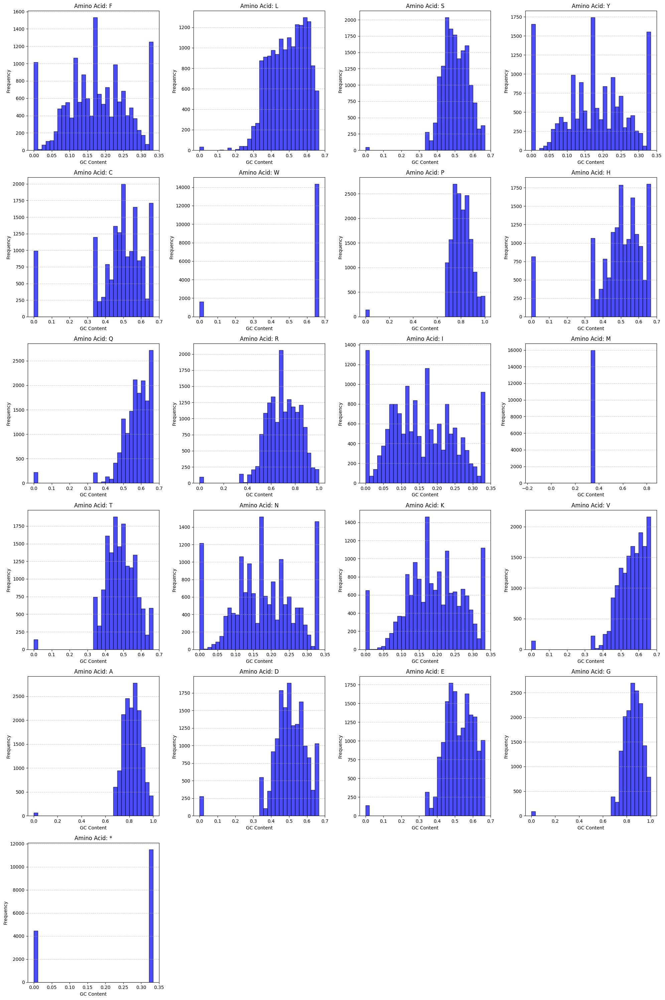

In [149]:
# Create subplots for each amino acid
num_amino_acids = len(gc_content_df.columns)
fig, axes = plt.subplots(nrows=(num_amino_acids // 4) + 1, ncols=4, figsize=(20, 5 * ((num_amino_acids // 4) + 1)))

# Flatten axes for easier iteration
axes = axes.flatten()

# Iterate over each amino acid column in the gc_content_df
for idx, amino_acid in enumerate(gc_content_df.columns):
    ax = axes[idx]
    
    # Plot the histogram of GC content for the current amino acid
    ax.hist(gc_content_df[amino_acid].dropna(), bins=30, alpha=0.7, label='GC Content', color='blue', edgecolor='black')
    
    # Add labels and title
    ax.set_xlabel('GC Content', fontsize=10)
    ax.set_ylabel('Frequency', fontsize=10)
    ax.set_title(f'Amino Acid: {amino_acid}', fontsize=12)
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Hide any unused subplots
for idx in range(len(gc_content_df.columns), len(axes)):
    fig.delaxes(axes[idx])

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


In [188]:
# Calculate the correlation between amino acid frequency and GC content for each amino acid
correlations = {}

amino_acids = get_amino_acids()

for aa in amino_acids:
    if aa in gc_content_df.columns:
        aa_frequencies = test_with_results['amino_acid_fractions'].apply(lambda x: x.get(aa, 0))
        aa_gc_content = gc_content_df[aa]
        correlations[aa] = aa_frequencies.corr(aa_gc_content, method='pearson')

# Convert the correlations dictionary to a DataFrame for plotting
correlations_df = pd.DataFrame(list(correlations.items()), columns=['Amino Acid', 'Correlation'])

# Sort the DataFrame by correlation values
correlations_df = correlations_df.sort_values(by='Correlation', ascending=False)

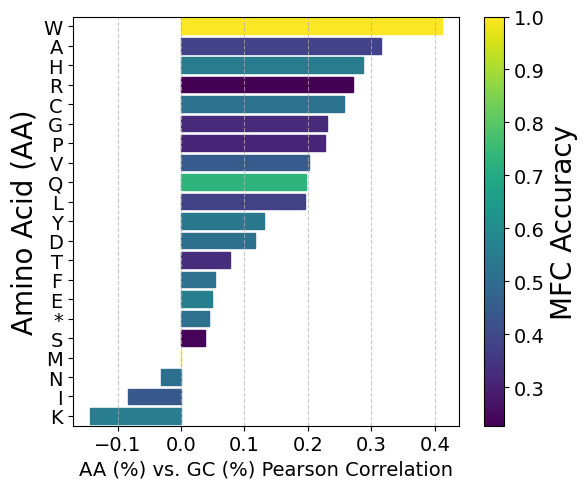

In [194]:
# Map the mfc values to colors
mfc_values = amino_acid_accuracies_df['MFC']
norm = plt.Normalize(vmin=mfc_values.min(), vmax=mfc_values.max())
cmap = plt.cm.viridis
colors = correlations_df['Amino Acid'].map(lambda aa: cmap(norm(float(mfc_values.get(aa, 0))))).tolist()

# Plot the correlations
plt.figure(figsize=(6, 5))
barplot = sns.barplot(data=correlations_df, x='Correlation', y='Amino Acid', palette="viridis")

# Manually set the colors of the bars
for bar, color in zip(barplot.patches, colors):
    bar.set_color(color)

# Add labels and title
plt.xlabel('AA (%) vs. GC (%) Pearson Correlation', fontsize=14)
plt.ylabel('Amino Acid (AA)', fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
# plt.title('Correlation of Amino Acid Frequency with GC Content', fontsize=16)
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Add a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=barplot)
cbar.set_label('MFC Accuracy', fontsize=20)
cbar.ax.tick_params(labelsize=14)  # Set colorbar tick label size

plt.tight_layout()

plt.savefig('amino_acid_gc_correlation_colored_accuracy.svg', format='svg', bbox_inches='tight')

plt.show()

In [78]:
# Calculate the weighted mean accuracy for each model
for model in ['MFC', 'MFB', 'BART30', 'BART30_Ablation']:
    weighted_mean_accuracies = amino_acid_fractions_df.swifter.apply(
        lambda row: sum(row[aa] * amino_acid_accuracies_df.loc[aa, model] for aa in amino_acid_accuracies_df.index),
        axis=1
    )
    test_with_results[f'aa_expected_{model.lower()}_accuracy'] = weighted_mean_accuracies

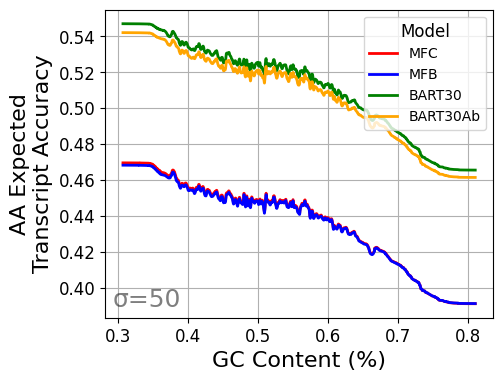

In [96]:
# Gaussian smoothed plot for all models
plt.figure(figsize=(5, 4))
models = ['aa_expected_mfc_accuracy', 'aa_expected_mfb_accuracy', 'aa_expected_bart30_accuracy', 'aa_expected_bart30_ablation_accuracy']
colors = ['red', 'blue', 'green', 'orange']
labels = ['MFC', 'MFB', 'BART30', 'BART30Ab']

# Sort by GC content for proper smoothing
sorted_indices = test_with_results['gc_content'].argsort()
sorted_gc_content = test_with_results['gc_content'].iloc[sorted_indices]

sgma = 50
for model, color, label in zip(models, colors, labels):
    sorted_values = test_with_results[model].iloc[sorted_indices]
    smoothed_values = gaussian_filter1d(sorted_values, sigma=sgma)
    plt.plot(sorted_gc_content, smoothed_values, color=color, label=label, linewidth=2)

plt.xlabel('GC Content (%)', fontsize=16)
plt.ylabel('AA Expected\nTranscript Accuracy', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=10, title='Model', title_fontsize=12, loc='upper right')
plt.grid(True)

# annotate sigma value in the bottom left corner
plt.text(0.02, 0.02, f'σ={sgma}', fontsize=18, ha='left', va='bottom', alpha=0.5, transform=plt.gca().transAxes)

# Save the figure as an SVG file
plt.savefig('aa_expected_transcript_accuracy_vs_gc_content.svg', format='svg', bbox_inches='tight')

plt.show()

In [63]:
codon_accuracies_df.loc['AAA']

MFC                0.000000
MFB                0.053250
BART30_Ablation    0.328258
BART30             0.416611
Name: AAA, dtype: float64

In [72]:
# Calculate the weighted mean accuracy for each model
for model in ['MFC', 'MFB', 'BART30', 'BART30_Ablation']:
    weighted_mean_accuracies = codon_fractions_df.swifter.apply(
        lambda row: sum(row[codon] * codon_accuracies_df.loc[codon, model] for codon in codon_accuracies_df.index),
        axis=1
    )
    test_with_results[f'codon_expected_{model.lower()}_accuracy'] = weighted_mean_accuracies

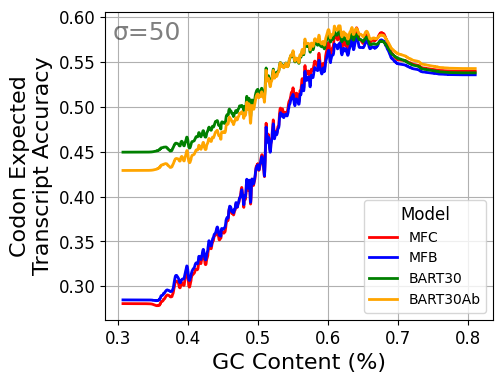

In [91]:
# Gaussian smoothed plot for all models (codons)
plt.figure(figsize=(5, 4))
models = ['codon_expected_mfc_accuracy', 'codon_expected_mfb_accuracy', 'codon_expected_bart30_accuracy', 'codon_expected_bart30_ablation_accuracy']
colors = ['red', 'blue', 'green', 'orange']
labels = ['MFC', 'MFB', 'BART30', 'BART30Ab']

# Sort by GC content for proper smoothing
sorted_indices = test_with_results['gc_content'].argsort()
sorted_gc_content = test_with_results['gc_content'].iloc[sorted_indices]

sgma = 50
for model, color, label in zip(models, colors, labels):
    sorted_values = test_with_results[model].iloc[sorted_indices]
    smoothed_values = gaussian_filter1d(sorted_values, sigma=sgma)
    plt.plot(sorted_gc_content, smoothed_values, color=color, label=label, linewidth=2)

plt.xlabel('GC Content (%)', fontsize=16)
plt.ylabel('Codon Expected\nTranscript Accuracy', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=10, title='Model', title_fontsize=12, loc='best')
plt.grid(True)

# annotate sigma value in the top left corner
plt.text(0.02, 0.97, f'σ={sgma}', fontsize=18, ha='left', va='top', alpha=0.5, transform=plt.gca().transAxes)

# Save the figure as an SVG file
plt.savefig('codon_expected_transcript_accuracy_vs_gc_content.svg', format='svg', bbox_inches='tight')

plt.show()

## GC Content vs. Expression

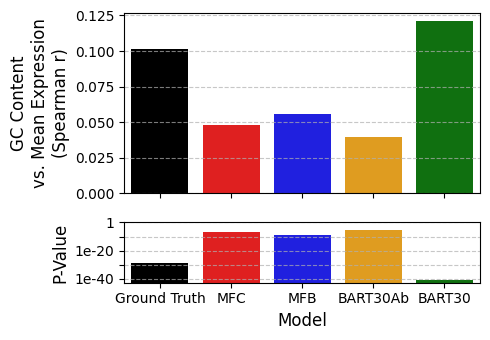

In [78]:
from scipy.stats import spearmanr

# Calculate correlations and p-values for GC content of all models
models = ['gc_content', 'mfc_gc_content', 'mfb_gc_content', 'bart30_ablation_gc_content', 'bart30_gc_content']
labels = ['Ground Truth', 'MFC', 'MFB', 'BART30Ab', 'BART30']
colors = ['black', 'red', 'blue', 'orange', 'green']
correlations = {}
p_values = {}

test_with_results_with_expression = test_with_results.dropna(subset=['median'])
mean_expression_series = pd.Series(np.mean(normalized_test_float_vectors, axis=1))

for model in models:
    corr, p_val = spearmanr(test_with_results_with_expression[model], mean_expression_series)
    correlations[model] = corr
    p_values[model] = p_val

# Convert correlations and p-values to DataFrames for plotting
correlations_df = pd.DataFrame(list(correlations.items()), columns=['Model', 'Correlation'])
p_values_df = pd.DataFrame(list(p_values.items()), columns=['Model', 'P-Value'])

# Create subplots
fig, axes = plt.subplots(2, 1, figsize=(5, 3.5), gridspec_kw={'height_ratios': [3, 1]})

# Plot correlations
sns.barplot(data=correlations_df, x='Model', y='Correlation', palette=colors, ax=axes[0])
axes[0].set_xlabel('')
axes[0].set_ylabel('GC Content\nvs. Mean Expression\n(Spearman r)', fontsize=12)
axes[0].set_xticks(range(len(labels)))
axes[0].set_xticklabels([], rotation=0, fontsize=10)
axes[0].grid(axis='y', linestyle='--', alpha=0.7)

# Plot p-values
sns.barplot(data=p_values_df, x='Model', y='P-Value', palette=colors, ax=axes[1])
axes[1].set_xlabel('Model', fontsize=12)
axes[1].set_ylabel('P-Value', fontsize=12)
axes[1].set_xticks(range(len(labels)))
axes[1].set_xticklabels(labels, rotation=0, fontsize=10)
axes[1].grid(axis='y', linestyle='--', alpha=0.7)
axes[1].set_yscale('log')  # Set y-axis to logarithmic scale for p-values

# Ensure at least two ticks on the y-axis
axes[1].set_yticks([1e-10, 1e-20, 1e-30, 1e-40, 1], labels=[None, '1e-20', None, '1e-40', '1']) # labels=['1e-10', None, '1e-30', None, None])

# Adjust layout
plt.tight_layout()

# Save the figure as an SVG file
plt.savefig('gc_content_correlation_and_p_values.svg', format='svg', bbox_inches='tight')

plt.show()

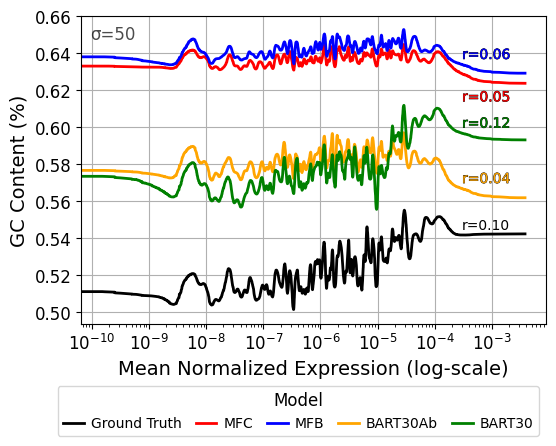

In [195]:
from scipy.ndimage import gaussian_filter1d
from scipy.stats import spearmanr
from matplotlib.patheffects import withStroke

import matplotlib.pyplot as plt

# Define models and colors
models_gc = ['gc_content', 'mfc_gc_content', 'mfb_gc_content', 'bart30_ablation_gc_content', 'bart30_gc_content']
labels = ['Ground Truth', 'MFC', 'MFB', 'BART30Ab', 'BART30']
colors = ['black', 'red', 'blue', 'orange', 'green']

# Sort data by normalized_transcript_expression_vectors
test_with_results_with_expression = test_with_results.dropna(subset=['median']).copy().reset_index()
mean_expression = normalized_test_float_vectors.mean(axis=1)
test_with_results_with_expression['mean_expression'] = mean_expression
test_with_results_with_expression.sort_values(by='mean_expression', inplace=True)

sorted_expression = test_with_results_with_expression['mean_expression'].values
sorted_gc_content = test_with_results_with_expression.loc[:, models_gc]

# Define Gaussian smoothing sigma
sgma = 50

# Plot smoothed lines for all models
plt.figure(figsize=(6, 4))
for model, color, label in zip(models_gc, colors, labels):
    smoothed_gc = gaussian_filter1d(sorted_gc_content[model], sigma=sgma)
    spearman_corr, p_val = spearmanr(sorted_expression, sorted_gc_content[model])
    num_tests = len(models_gc)
    adj_pval = p_val * num_tests  # Bonferroni correction for multiple comparisons
    plt.plot(sorted_expression, smoothed_gc, label=f'{label}', color=color, linewidth=2)
    
    # Annotate r and bf_p next to the line
    if label == 'MFC':
        x_pos = 3e-4
        y_pos = smoothed_gc[np.argmin(np.abs(sorted_expression - x_pos))] - 0.015
    else:
        x_pos = 3e-4
        y_pos = smoothed_gc[np.argmin(np.abs(sorted_expression - x_pos))] + 0.003

    # Add annotation with a thin black stroke for non-black annotations
    text_color = color if color != 'black' else 'black'
    plt.text(
        x_pos, y_pos, f'r={spearman_corr:.2f}',#\nbf_p={adj_pval:.1}',
        color=text_color, fontsize=10,
        path_effects=[withStroke(linewidth=0.5, foreground='black')] if text_color != 'black' else None
    )

# Add labels, legend, and grid
plt.xlabel('Mean Normalized Expression (log-scale)', fontsize=14)
plt.ylabel('GC Content (%)', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)
plt.xscale('log')

# Annotate sigma value in the top left corner
plt.text(0.02, 0.97, f'σ={sgma}', fontsize=12, ha='left', va='top', alpha=0.7, transform=plt.gca().transAxes)
# Place the legend to the right of the plot
plt.legend(fontsize=10, title='Model', title_fontsize=12, loc='best', ncol=5, bbox_to_anchor=(1, -0.18), 
           borderaxespad=0.5, columnspacing=1, handletextpad=0.5, handlelength=1.5)

# Save the figure as an SVG file
plt.savefig('gc_content_vs_normalized_expression_smoothed.svg', format='svg', bbox_inches='tight')

plt.show()

## GC Content vs. KL Divergence

### Load KL Divergence

In [10]:
test_with_results_with_kl = pd.read_pickle(os.path.join(results_path, 'test_with_kl_divergence.pkl'))

### Graph

**Scatter**

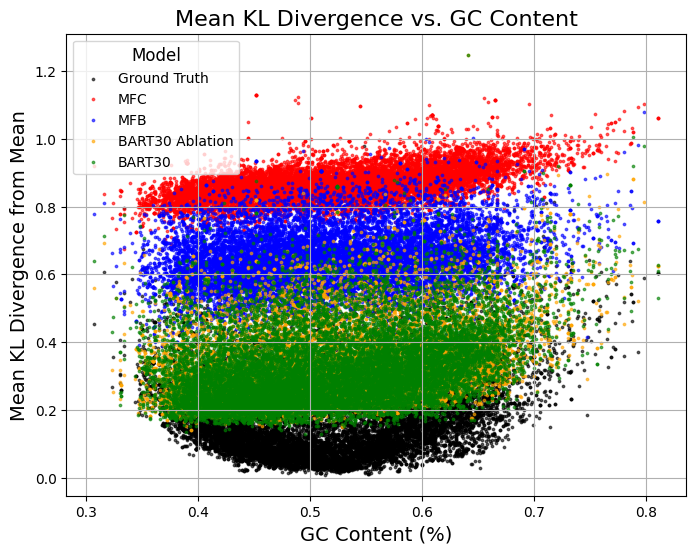

In [ ]:
# Define models and their corresponding columns
models = ['gt', 'mfc', 'mfb', 'bart30_ablation', 'bart30']
colors = ['black', 'red', 'blue', 'orange', 'green']
labels = ['Ground Truth', 'MFC', 'MFB', 'BART30 Ablation', 'BART30']

# Create a scatter plot for each model
plt.figure(figsize=(8, 6))
for model, color, label in zip(models, colors, labels):
    column_name = f'mean_{model}_kl_divergence_from_mean'
    plt.scatter(test_with_results['gc_content'], test_with_results_with_kl[column_name], 
                label=label, color=color, alpha=0.6, s=3)

# Add labels, legend, and grid
plt.xlabel('GC Content (%)', fontsize=14)
plt.ylabel('Mean KL Divergence from Mean', fontsize=14)
plt.legend(fontsize=10, title='Model', title_fontsize=12)
plt.grid(True)
plt.title('Mean KL Divergence vs. GC Content', fontsize=16)

# Show the plot
plt.show()

**Gaussian Smoothed Plot**

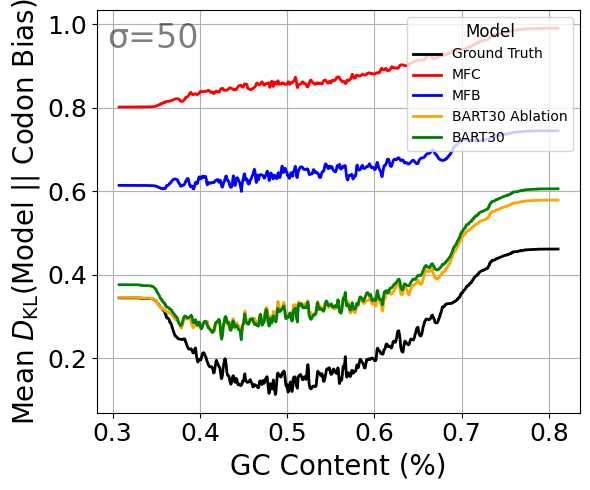

In [37]:
# Define models and their corresponding columns
models = ['gt', 'mfc', 'mfb', 'bart30_ablation', 'bart30']
colors = ['black', 'red', 'blue', 'orange', 'green']
labels = ['Ground Truth', 'MFC', 'MFB', 'BART30 Ablation', 'BART30']

# Define Gaussian smoothing sigma
sgma = 50

# Create a smoothed plot for each model
plt.figure(figsize=(6, 5))
for model, color, label in zip(models, colors, labels):
    column_name = f'mean_{model}_kl_divergence_from_mean'
    sorted_indices = test_with_results['gc_content'].argsort()
    sorted_gc_content = test_with_results['gc_content'].iloc[sorted_indices]
    sorted_values = test_with_results_with_kl[column_name].iloc[sorted_indices]
    smoothed_values = gaussian_filter1d(sorted_values, sigma=sgma)
    plt.plot(sorted_gc_content, smoothed_values, label=label, color=color, linewidth=2)

# Add labels, legend, and grid
plt.xlabel('GC Content (%)', fontsize=20)
plt.xticks(fontsize=18)
plt.ylabel('Mean $D_\mathrm{KL}$(Model || Codon Bias)', fontsize=20)
plt.yticks(fontsize=18)
plt.legend(fontsize=10, title='Model', title_fontsize=12, loc='best')
plt.grid(True)
# plt.title('Mean KL Divergence vs. GC Content (Smoothed)', fontsize=16)

# Annotate sigma value in the top left corner
plt.text(0.02, 0.97, f'σ={sgma}', fontsize=24, ha='left', va='top', alpha=0.5, transform=plt.gca().transAxes)

plt.tight_layout()

# Save the figure as an SVG file
plt.savefig('mean_kl_divergence_vs_gc_content_smoothed.svg', format='svg', bbox_inches='tight')

# Show the plot
plt.show()